<a href="https://colab.research.google.com/github/Ania-star/Clicked-Decision-Modeling/blob/main/anna_formula_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Decision Modeling**

Predict a probability of winning a race in Monaco 2024

In [ ]:
import pandas as pd # Import pandas library for data manipulation and analysis.
import numpy as np # Import numpy library for numerical computing.
import seaborn as sns # Import seaborn library for statistical data visualization.
import matplotlib.pyplot as plt # Import matplotlib library for creating plots and visualizations.
import plotly.express as px # Import plotly library for interactive data visualization.
from sklearn.model_selection import train_test_split # Import train_test_split function from sklearn library for splitting data into training and testing sets.
from sklearn.preprocessing import StandardScaler, OneHotEncoder # Import StandardScaler and OneHotEncoder classes from sklearn library for preprocessing data.
from sklearn.compose import ColumnTransformer # Import ColumnTransformer class from sklearn library for preprocessing data.
from sklearn.pipeline import Pipeline # Import Pipeline class from sklearn library for creating pipelines.
from sklearn.ensemble import RandomForestClassifier # Import RandomForestClassifier class from sklearn library for building random forest models.
from sklearn.metrics import accuracy_score, classification_report # Import accuracy_score and classification_report functions from sklearn library for evaluating model performance.
from sklearn.model_selection import GridSearchCV # Import GridSearchCV class from sklearn library for hyperparameter tuning.
from imblearn.pipeline import Pipeline as ImbPipeline # Import ImbPipeline class from imblearn library for handling imbalanced datasets.
from imblearn.over_sampling import SMOTE # Import SMOTE class from imblearn library for handling imbalanced datasets.

In [ ]:
# cloning github repository
!git clone https://github.com/Ania-star/Clicked-Decision-Modeling

fatal: destination path 'Clicked-Decision-Modeling' already exists and is not an empty directory.


In [ ]:
# List of file paths
file_paths = [
    '/content/Clicked-Decision-Modeling/Data/lap_times.csv',
    '/content/Clicked-Decision-Modeling/Data/races.csv',
    '/content/Clicked-Decision-Modeling/Data/results.csv',
    '/content/Clicked-Decision-Modeling/Data/drivers.csv',
    '/content/Clicked-Decision-Modeling/Data/pit_stops.csv',
    '/content/Clicked-Decision-Modeling/Data/constructors.csv',
    '/content/Clicked-Decision-Modeling/Data/driver_standings.csv',
    '/content/Clicked-Decision-Modeling/Data/constructor_standings.csv',
    '/content/Clicked-Decision-Modeling/Data/sprint_results.csv',
    '/content/Clicked-Decision-Modeling/Data/constructor_results.csv',
    '/content/Clicked-Decision-Modeling/Data/F1Weather.csv',
    '/content/Clicked-Decision-Modeling/Data/Monaco_current_race_data.csv',
    '/content/Clicked-Decision-Modeling/Data/formula_df.csv',
    '/content/Clicked-Decision-Modeling/Data/analysis_merged_constructor_result_pit_lap_f_df.csv'
    ]

# Dictionary to store DataFrames
data_frames = {}

# Read each file into a DataFrame and store it in the dictionary
for file_path in file_paths:
    # Extract the file name without the extension
    file_name = file_path.split('/')[-1].split('.')[0]
    # Read the file into a DataFrame
    df = pd.read_csv(file_path)
    # Store the DataFrame in the dictionary with the file name as the key
    data_frames[file_name] = df

# Access each DataFrame using its file name as the key
lap_times_df = data_frames['lap_times']
races_df = data_frames['races']
results_df = data_frames['results']
drivers_df = data_frames['drivers']
pit_stops_df = data_frames['pit_stops']
constructors_df = data_frames['constructors']
driver_standings_df = data_frames['driver_standings']
constructor_standings_df = data_frames['constructor_standings']
sprint_results_df = data_frames['sprint_results']
constructor_results_df = data_frames['constructor_results']
weather_df = data_frames['F1Weather']
Monaco_current_race_data_df = data_frames['Monaco_current_race_data']
formula_df = data_frames['formula_df']
analysis_merged_constructor_result_pit_lap_f_df = data_frames['analysis_merged_constructor_result_pit_lap_f_df']

#**Exploratory Data Analysis**


**Data Structure Inspection:**
- Overview of the dataset's structure, including both numerical and categorical data types.
- Unique values, missing values, and \N values analysis, these values might represent special cases or placeholders.

**Summary Statistics:**
- Descriptive statistics (e.g., mean, median, standard deviation) to summarize the central tendency, dispersion, and shape of the dataset's distribution.
- Insights into the overall characteristics of the data.

**Visualization**:

- **Categorical Feature Distribution:**
 - Visualizes the distribution of categorical variables using plots like bar plots or count plots.
 - Helps understand the frequency or distribution of categories within each categorical feature.

- **Numerical Feature Distribution**:
 - Visualizes the distribution of numerical variables using histograms, box plots, or kernel density plots.
 - Helps understand the spread, skewness, and outliers in numerical data.

- **Outliee Analysis**:
 - Identifies and visualizes outliers using box plots and statistical methods


##**Drivers** **Dataset**

###Data Structure Inspection

In [ ]:
# Data Structure Inspection

print('\nData Dimensions')
print(drivers_df.shape)

print('\nColumns:\n')
print(drivers_df.columns)

print('\nFirst few rows:')
print(drivers_df.head(4))

print('\nBasic Information:\n')
drivers_df.info()

# Check for missing values
print('\nMissing values:')
print(drivers_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(drivers_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:')
print(drivers_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(drivers_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(drivers_df.duplicated().sum())


Data Dimensions
(857, 9)

Columns:

Index(['driverId', 'drivers_driverRef', 'drivers_number', 'drivers_code',
       'drivers_forename', 'drivers_surname', 'drivers_dob',
       'drivers_nationality', 'drivers_url'],
      dtype='object')

First few rows:
   driverId drivers_driverRef drivers_number drivers_code drivers_forename  \
0         1          hamilton             44          HAM            Lewis   
1         2          heidfeld             \N          HEI             Nick   
2         3           rosberg              6          ROS             Nico   
3         4            alonso             14          ALO         Fernando   

  drivers_surname drivers_dob drivers_nationality  \
0        Hamilton  1985-01-07             British   
1        Heidfeld  1977-05-10              German   
2         Rosberg  1985-06-27              German   
3          Alonso  1981-07-29             Spanish   

                                    drivers_url  
0   http://en.wikipedia.org/wiki/Lew

###Summary Statistice

In [ ]:
#Summary statistics
print('Summary Statistics:\n')
drivers_df.describe(include='all')

Summary Statistics:



,driverId,drivers_driverRef,drivers_number,drivers_code,drivers_forename,drivers_surname,drivers_dob,drivers_nationality,drivers_url
count,857.000000,857,857,857,857,857,857,857,857
unique,NaN,857,45,95,476,798,839,42,857
top,NaN,hamilton,\N,\N,John,Taylor,1935-07-23,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
freq,NaN,1,803,757,14,5,2,165,1
mean,429.057176,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,247.632402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,215.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,429.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,643.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


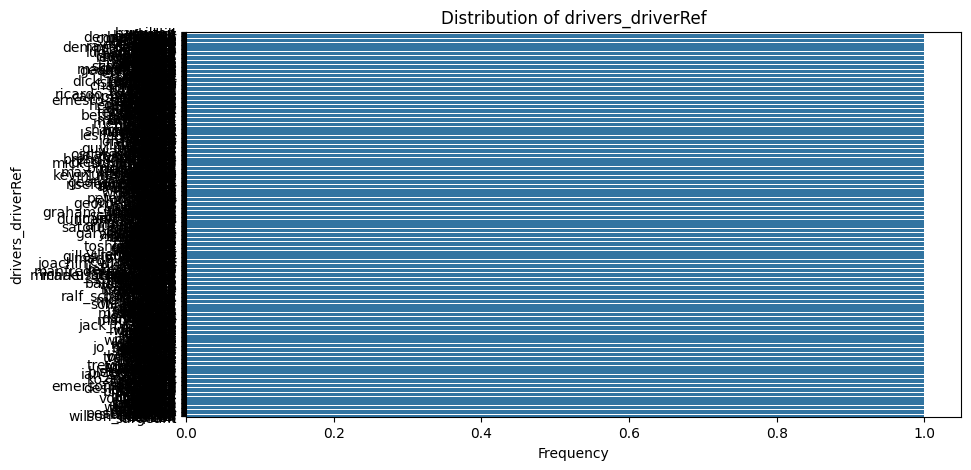

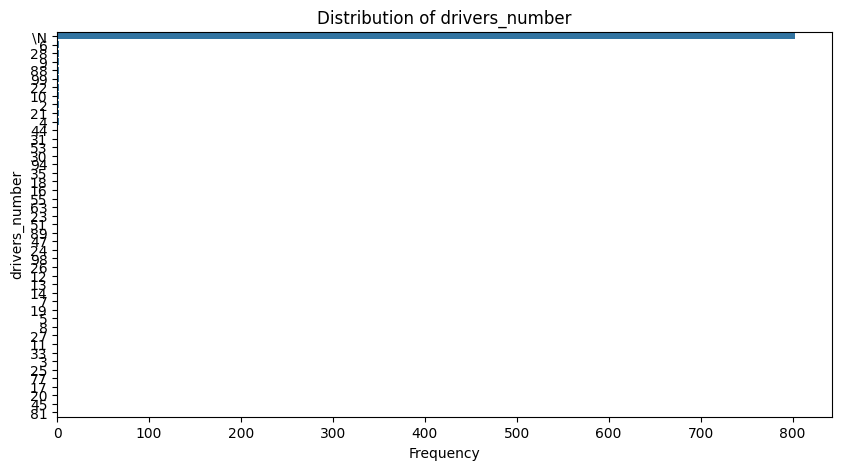

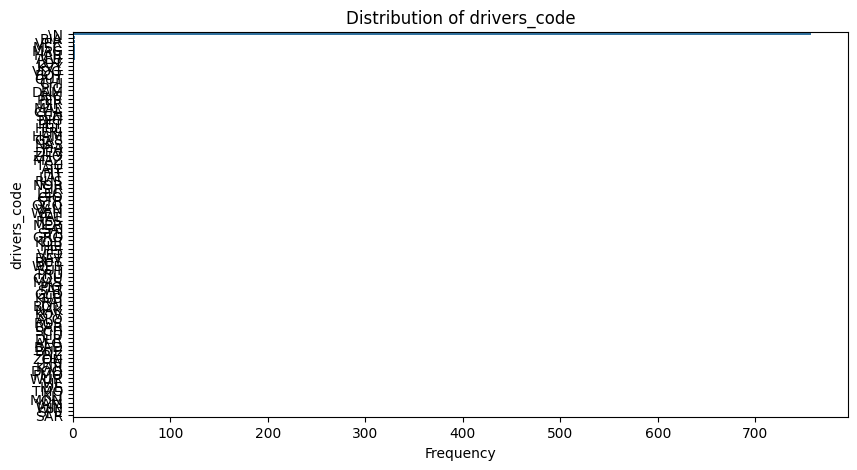

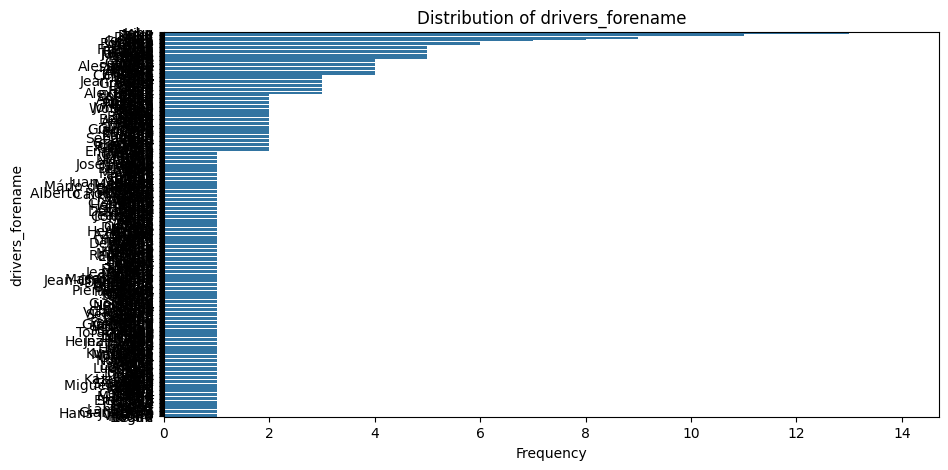

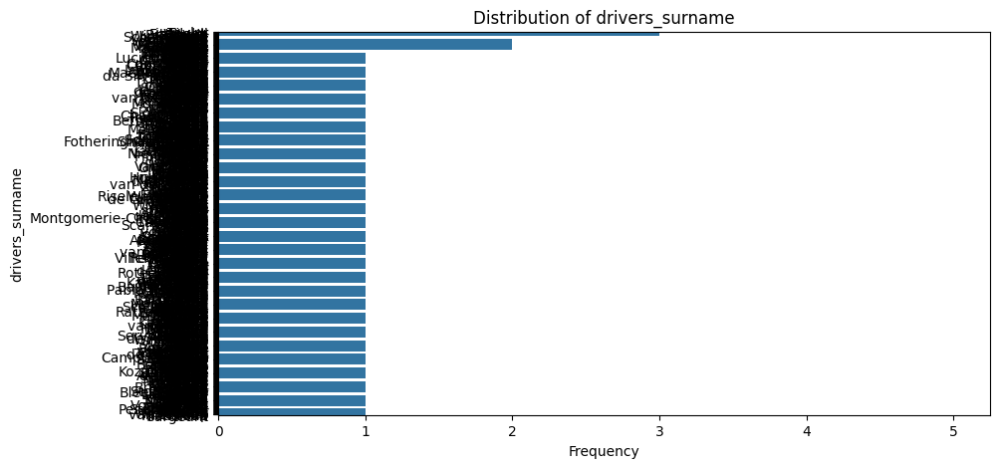

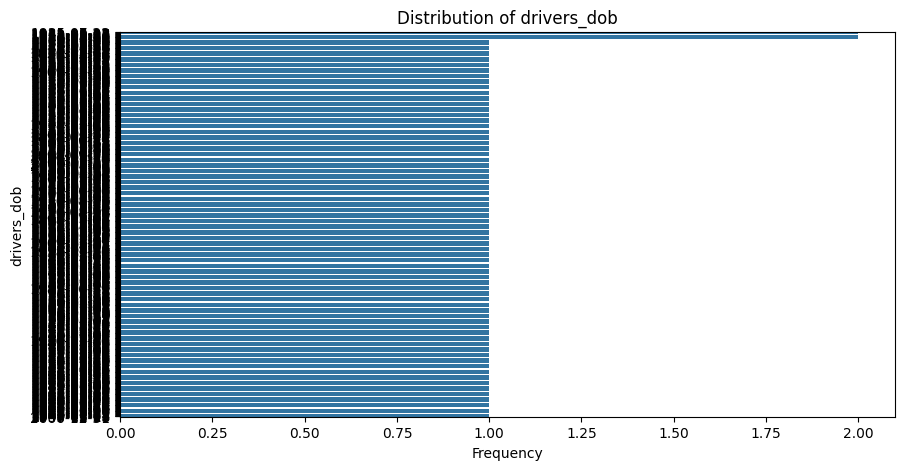

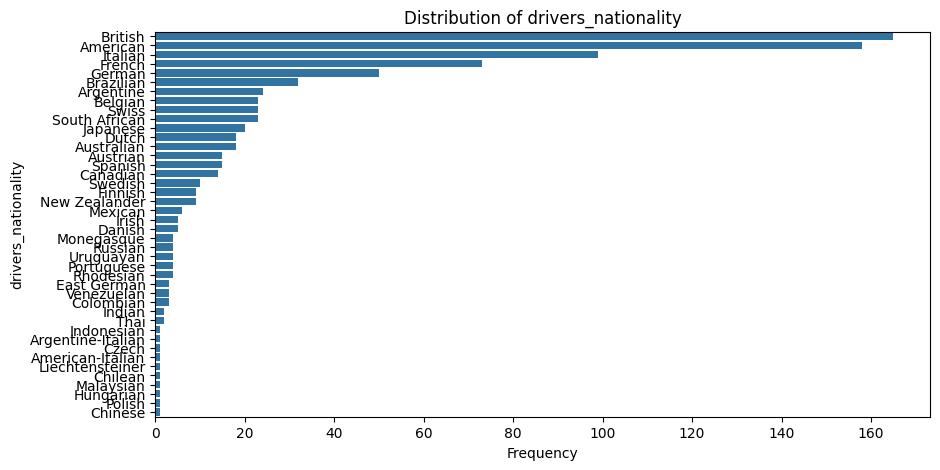

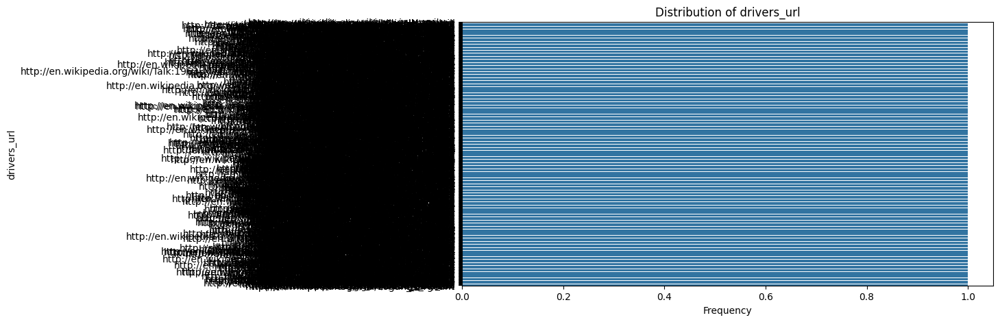





Numerical Feature


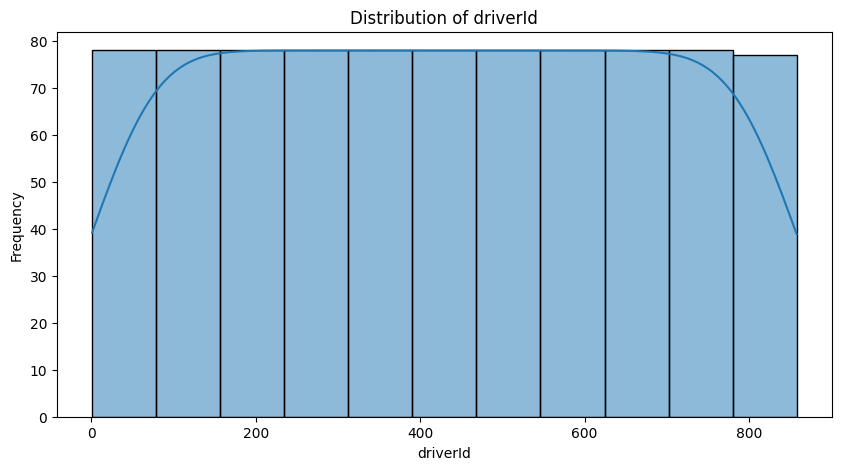



Outlier Analysis


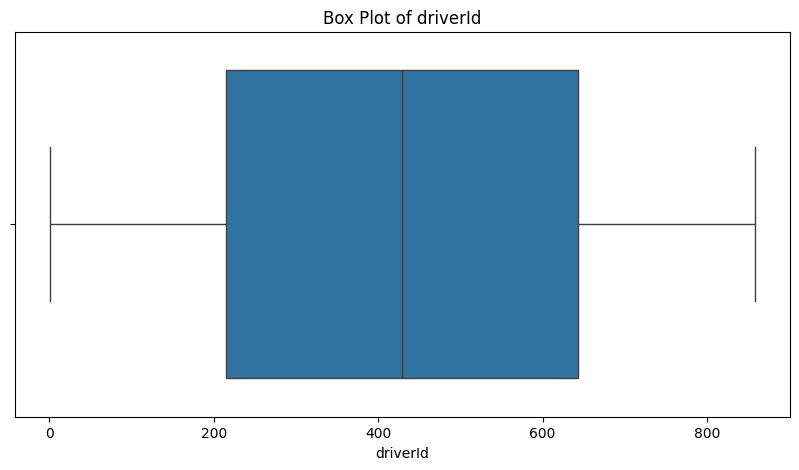



Outliers in driverId identified using IQR method:
Empty DataFrame
Columns: [driverId, drivers_driverRef, drivers_number, drivers_code, drivers_forename, drivers_surname, drivers_dob, drivers_nationality, drivers_url]
Index: []







In [ ]:
#Visualization
print('Visualizations:')

# Categorical features
print('Categorical Features')
cat_columns = drivers_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=drivers_df[col], order=drivers_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = drivers_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(drivers_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs



    # Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=drivers_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = drivers_df[col].quantile(0.25)
    Q3 = drivers_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = drivers_df[(drivers_df[col] < Q1 - 1.5 * IQR) | (drivers_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

###Correlation Matrix

##**Driver Standings Dataset**

###Data Structure Inspection

In [ ]:
# Data Structure Inspection

print('\nData Dimensions:')
print(driver_standings_df.shape)

print('\n-dataset Columns:')
print(driver_standings_df.columns)

print('\n-First few rows:')
print(driver_standings_df.head(4))

print('\n-Basic Information:\n')
driver_standings_df.info()

# Check for missing values
print('\nMissing values:')
print(driver_standings_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(driver_standings_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(driver_standings_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(driver_standings_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(driver_standings_df.duplicated().sum())


Data Dimensions:
(34124, 7)

-dataset Columns:
Index(['drivers_s_driverStandingsId', 'raceId', 'driverId', 'drivers_s_points',
       'drivers_s_position', 'drivers_s_positionText', 'drivers_s_wins'],
      dtype='object')

-First few rows:
   drivers_s_driverStandingsId  raceId  driverId  drivers_s_points  \
0                            1      18         1              10.0   
1                            2      18         2               8.0   
2                            3      18         3               6.0   
3                            4      18         4               5.0   

   drivers_s_position drivers_s_positionText  drivers_s_wins  
0                   1                      1               1  
1                   2                      2               0  
2                   3                      3               0  
3                   4                      4               0  

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34124 entries, 0 to 

###Summary Statistics

In [ ]:
#Summary statistics
print('Summary Statistics:\n')
driver_standings_df.describe(include='all')

Summary Statistics:



,drivers_s_driverStandingsId,raceId,driverId,drivers_s_points,drivers_s_position,drivers_s_positionText,drivers_s_wins
count,34124.000000,34124.000000,34124.000000,34124.000000,34124.000000,34124,34124.000000
unique,NaN,NaN,NaN,NaN,NaN,109,NaN
top,NaN,NaN,NaN,NaN,NaN,1,NaN
freq,NaN,NaN,NaN,NaN,NaN,1091,NaN
mean,42535.650656,572.649396,307.284697,13.489987,19.897169,NaN,0.269429
std,21729.601277,284.154765,267.228677,35.599709,16.396017,NaN,0.995681
min,1.000000,1.000000,1.000000,0.000000,1.000000,NaN,0.000000
25%,19649.750000,347.000000,85.000000,0.000000,8.000000,NaN,0.000000
50%,49674.500000,595.000000,221.000000,1.000000,16.000000,NaN,0.000000
75%,58946.250000,797.000000,509.000000,10.000000,26.000000,NaN,0.000000


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


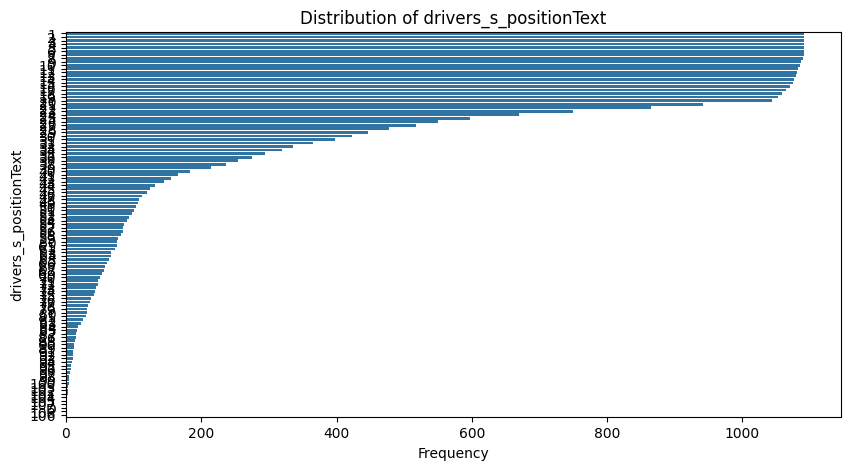





Numerical Feature


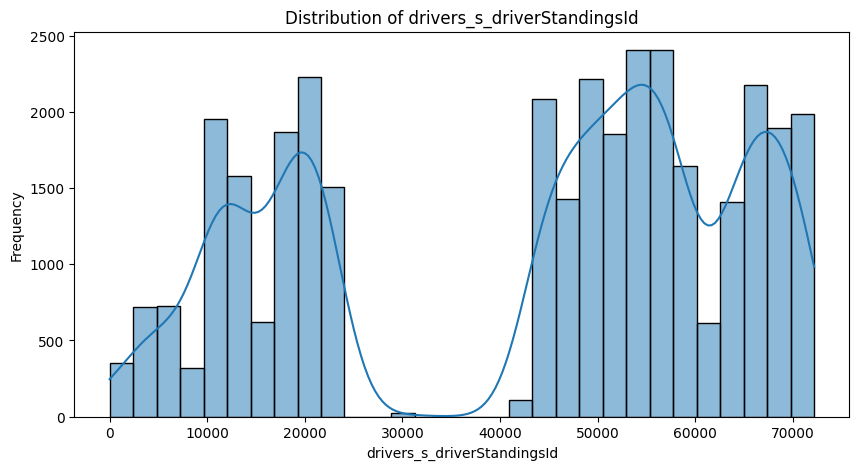



Outlier Analysis


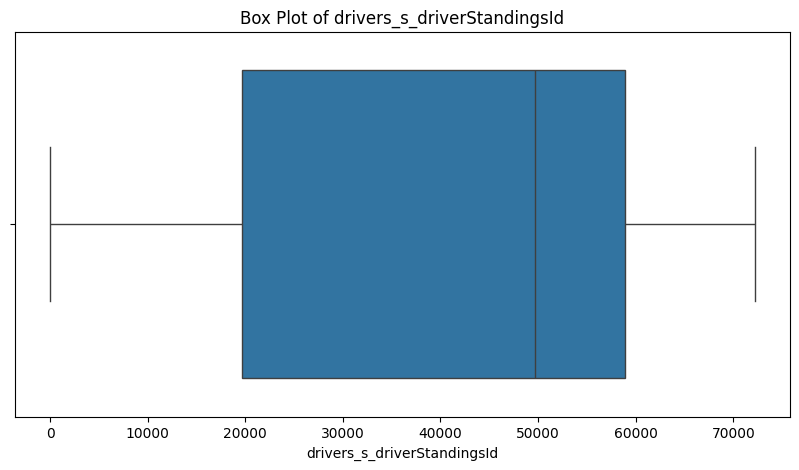



Outliers in drivers_s_driverStandingsId identified using IQR method:
Empty DataFrame
Columns: [drivers_s_driverStandingsId, raceId, driverId, drivers_s_points, drivers_s_position, drivers_s_positionText, drivers_s_wins]
Index: []





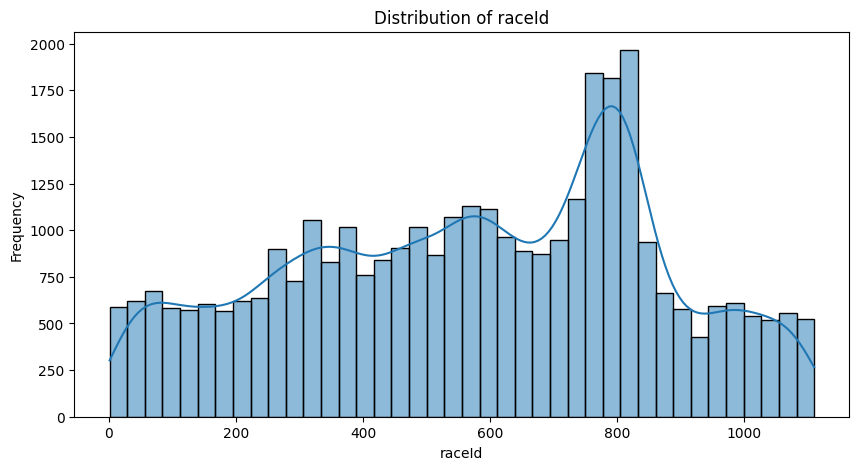



Outlier Analysis


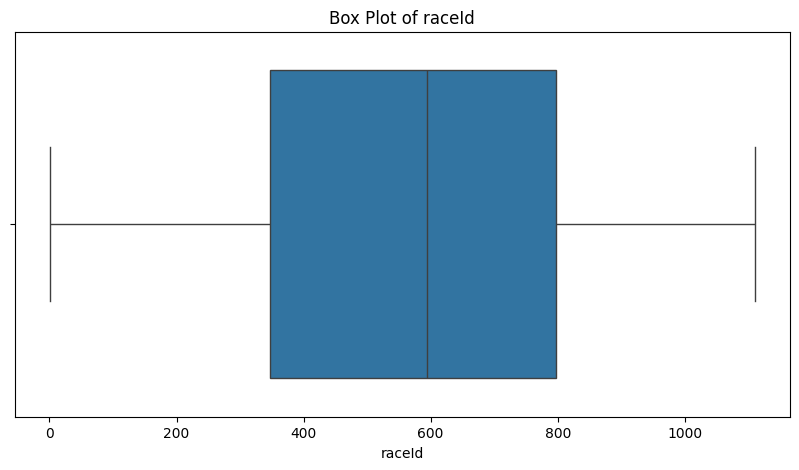



Outliers in raceId identified using IQR method:
Empty DataFrame
Columns: [drivers_s_driverStandingsId, raceId, driverId, drivers_s_points, drivers_s_position, drivers_s_positionText, drivers_s_wins]
Index: []





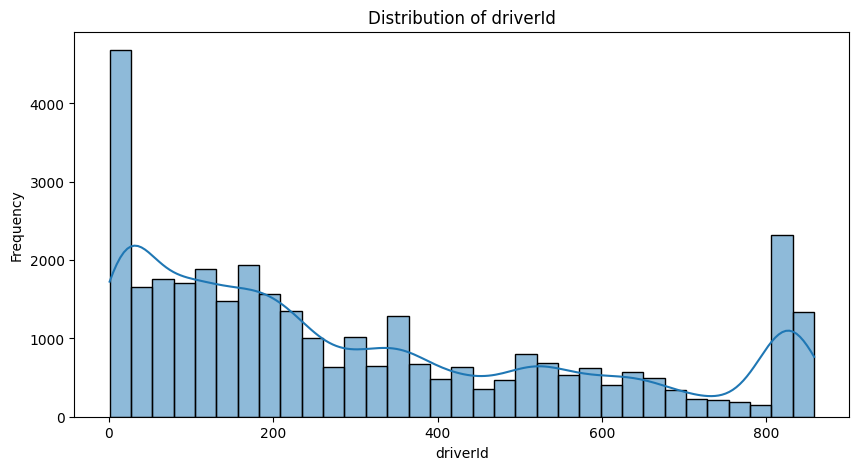



Outlier Analysis


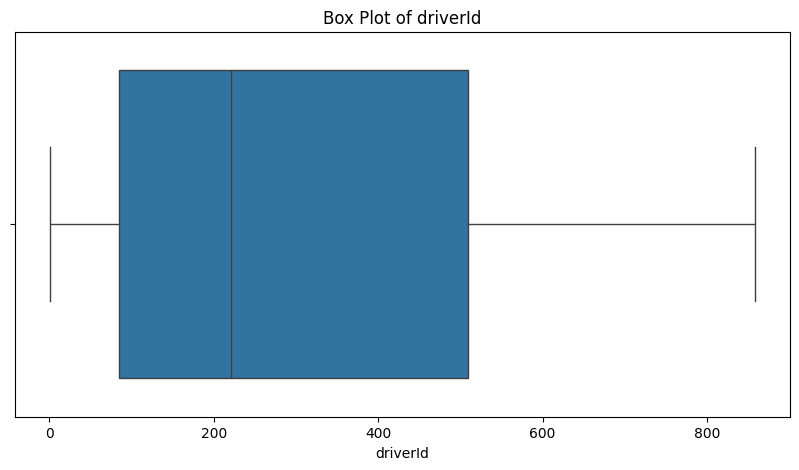



Outliers in driverId identified using IQR method:
Empty DataFrame
Columns: [drivers_s_driverStandingsId, raceId, driverId, drivers_s_points, drivers_s_position, drivers_s_positionText, drivers_s_wins]
Index: []





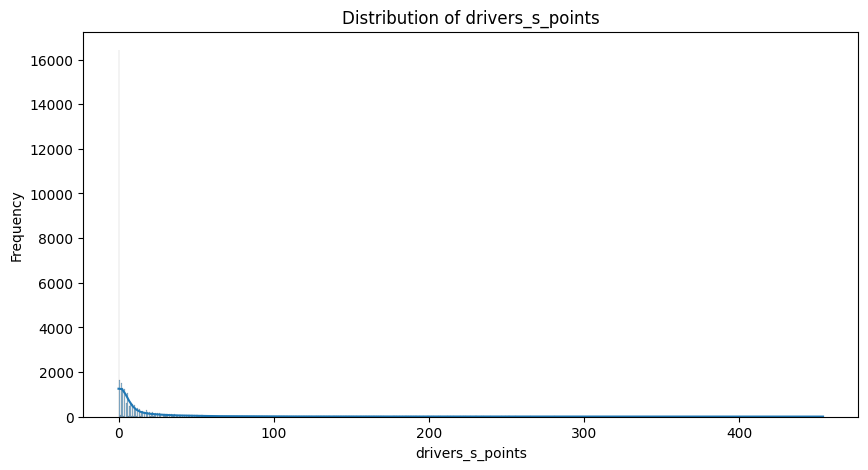



Outlier Analysis


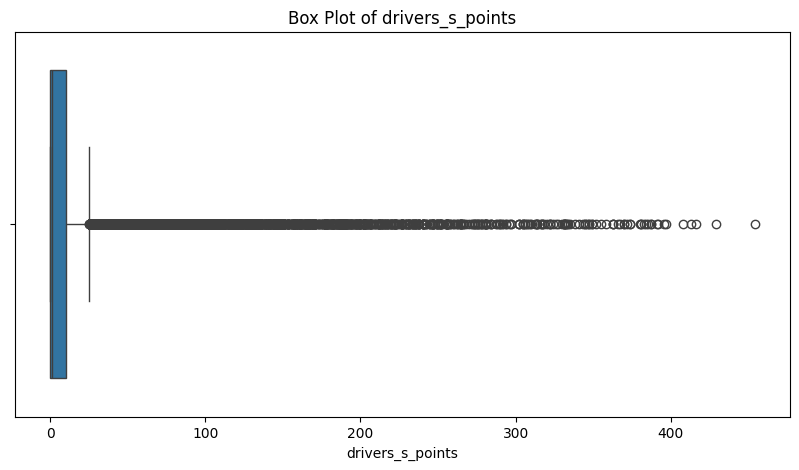



Outliers in drivers_s_points identified using IQR method:
       drivers_s_driverStandingsId  raceId  driverId  drivers_s_points  \
54                              55      21         8              29.0   
68                              69      22         1              28.0   
75                              76      22         8              35.0   
86                              87      22        13              28.0   
90                              91      23         1              38.0   
...                            ...     ...       ...               ...   
34109                        72173    1110       847              99.0   
34119                        72183    1110       846              69.0   
34120                        72184    1110       839              35.0   
34121                        72185    1110       844              99.0   
34122                        72186    1110       857              34.0   

       drivers_s_position drivers_s_positionText  d

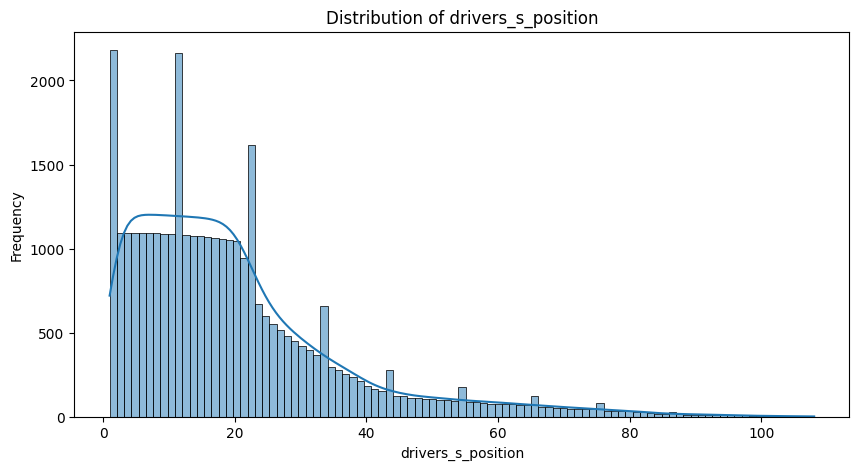



Outlier Analysis


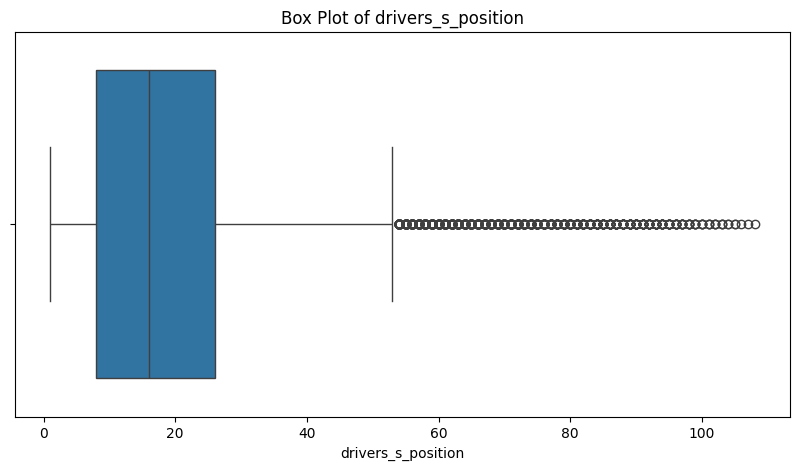



Outliers in drivers_s_position identified using IQR method:
       drivers_s_driverStandingsId  raceId  driverId  drivers_s_points  \
14773                        58296     556       220               0.0   
14777                        58292     556       247               0.0   
14781                        58288     556       266               0.0   
14782                        58287     556       245               0.0   
14825                        58353     557       220               0.0   
...                            ...     ...       ...               ...   
27780                        63711     728       442               0.0   
27781                        63710     728       441               0.0   
27873                        62503     764       550               0.0   
27891                        62451     763       522               0.0   
27893                        62454     763       564               0.0   

       drivers_s_position drivers_s_positionText 

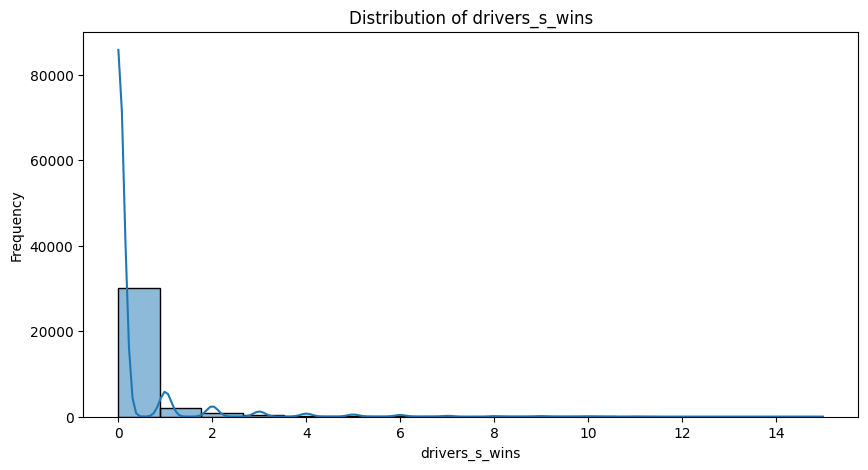



Outlier Analysis


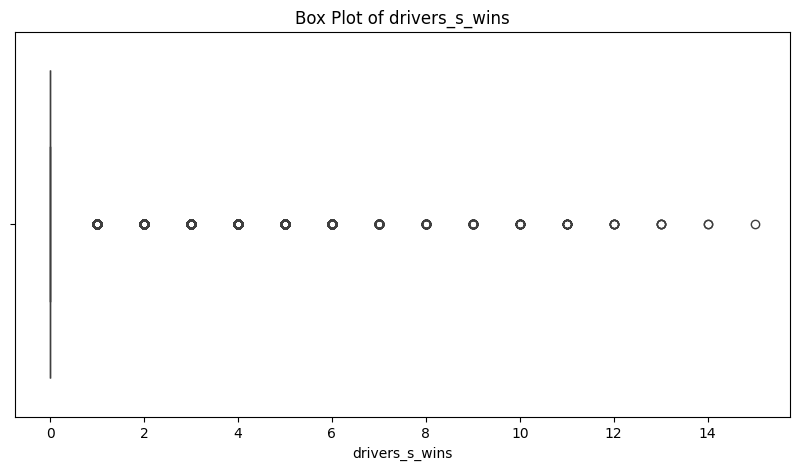



Outliers in drivers_s_wins identified using IQR method:
       drivers_s_driverStandingsId  raceId  driverId  drivers_s_points  \
0                                1      18         1              10.0   
8                                9      19         1              14.0   
15                              16      19         8              11.0   
26                              27      20         1              14.0   
33                              34      20         8              19.0   
...                            ...     ...       ...               ...   
34063                        72127    1108       815             156.0   
34082                        72146    1109       830             281.0   
34083                        72147    1109       815             171.0   
34103                        72167    1110       830             314.0   
34104                        72168    1110       815             189.0   

       drivers_s_position drivers_s_positionText  dri

In [ ]:
#Visualization
print('Visualizations:')

# Categorical features
print('Categorical Features')
cat_columns = driver_standings_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=driver_standings_df[col], order=driver_standings_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = driver_standings_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(driver_standings_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

# Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=driver_standings_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = driver_standings_df[col].quantile(0.25)
    Q3 = driver_standings_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = driver_standings_df[(driver_standings_df[col] < Q1 - 1.5 * IQR) | (driver_standings_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")




###Correlation Matrix

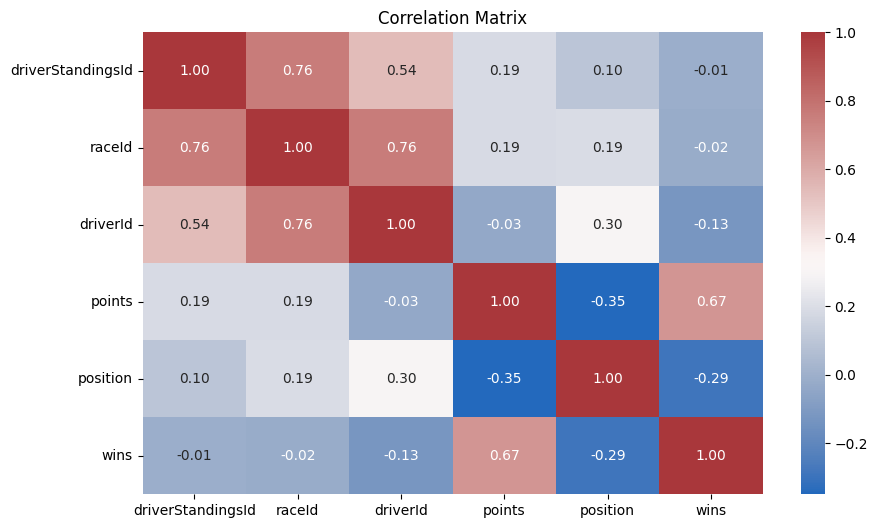

In [ ]:
#Create a correlation matrix visualization
num_columns = driver_standings_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = driver_standings_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Races Dataset**

###Data Structure Inspection

In [ ]:
# Data Structure Inspection

print('\nData Dimensions:')
print(races_df.shape)

print('\n-dataset Columns:\n')
print(races_df.columns)

print('\n-First few rows:')
print(races_df.head(4))

print('\n-Basic Information:\n')
races_df.info()


# Check for missing values
print('\nMissing values:')
print(races_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(races_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(races_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(races_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(races_df.duplicated().sum())




Data Dimentions:
(1101, 18)

-dataset Columns:

Index(['raceId', 'year', 'round', 'circuitId', 'name', 'date', 'time', 'url',
       'fp1_date', 'fp1_time', 'fp2_date', 'fp2_time', 'fp3_date', 'fp3_time',
       'quali_date', 'quali_time', 'sprint_date', 'sprint_time'],
      dtype='object')

-First few rows:
   raceId  year  round  circuitId                   name        date  \
0       1  2009      1          1  Australian Grand Prix  2009-03-29   
1       2  2009      2          2   Malaysian Grand Prix  2009-04-05   
2       3  2009      3         17     Chinese Grand Prix  2009-04-19   
3       4  2009      4          3     Bahrain Grand Prix  2009-04-26   

       time                                                url fp1_date  \
0  06:00:00  http://en.wikipedia.org/wiki/2009_Australian_G...       \N   
1  09:00:00  http://en.wikipedia.org/wiki/2009_Malaysian_Gr...       \N   
2  07:00:00  http://en.wikipedia.org/wiki/2009_Chinese_Gran...       \N   
3  12:00:00  http://en.wiki

###Summary Statistics

In [ ]:
#Summary statistics
print('Summary Statistics:\n')
races_df.describe(include='all')

Summary Statistics:



,raceId,year,round,circuitId,name,date,time,url,fp1_date,fp1_time,fp2_date,fp2_time,fp3_date,fp3_time,quali_date,quali_time,sprint_date,sprint_time
count,1101.000000,1101.000000,1101.000000,1101.000000,1101,1101,1101,1101,1101,1101,1101,1101,1101,1101,1101,1101,1101,1101
unique,NaN,NaN,NaN,NaN,54,1101,34,1101,67,19,67,16,55,17,67,13,13,6
top,NaN,NaN,NaN,NaN,Italian Grand Prix,2009-03-29,\N,http://en.wikipedia.org/wiki/2009_Australian_G...,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
freq,NaN,NaN,NaN,NaN,74,1,731,1,1035,1057,1035,1057,1047,1066,1035,1057,1089,1092
mean,553.355132,1992.020890,8.494096,23.700272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,321.425790,20.296406,5.081089,19.346014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,1950.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,276.000000,1976.000000,4.000000,9.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,551.000000,1994.000000,8.000000,18.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,826.000000,2010.000000,12.000000,34.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


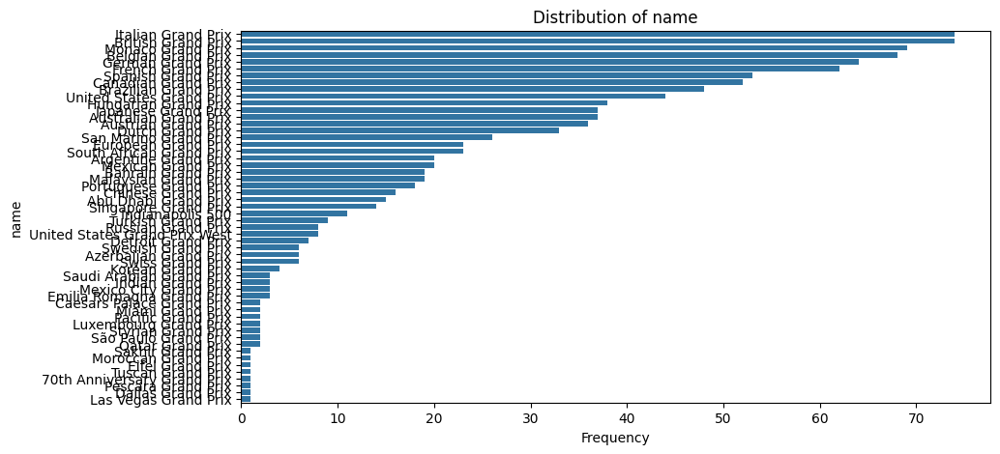

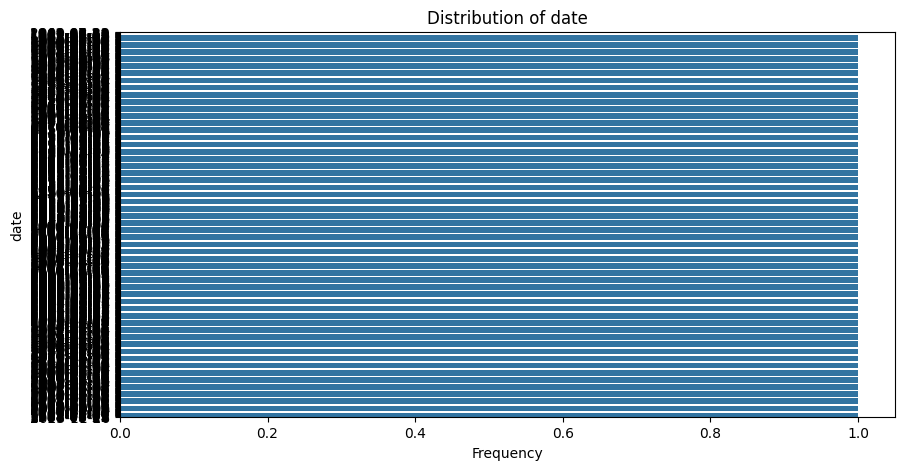

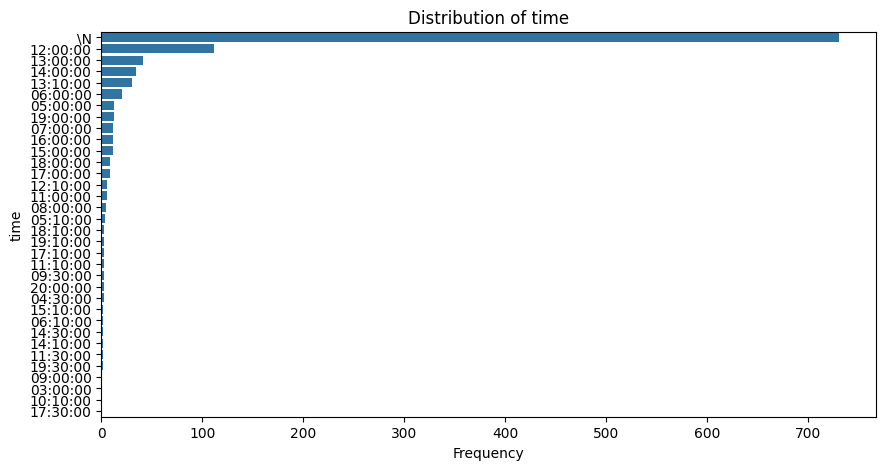

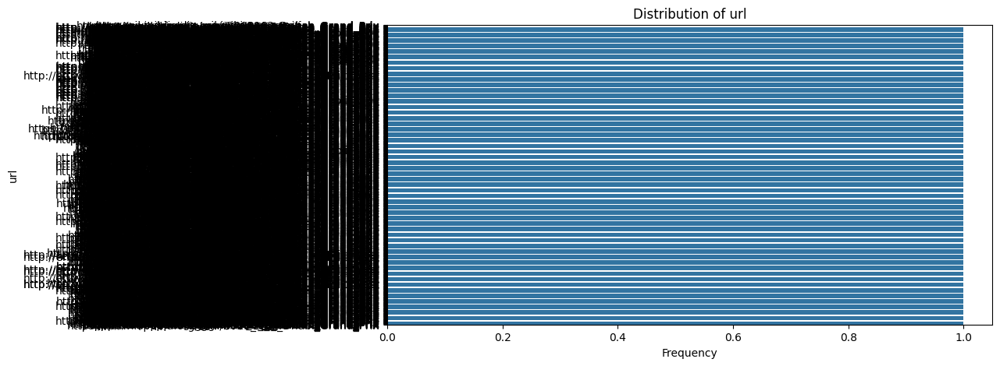

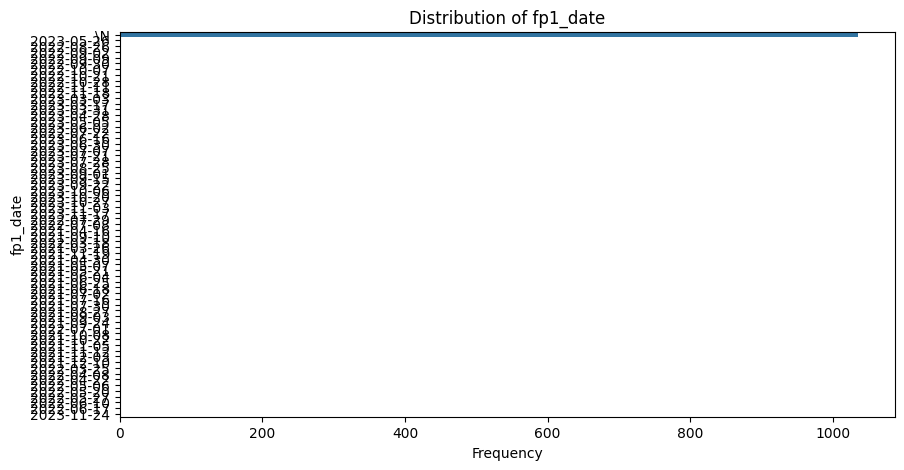

...

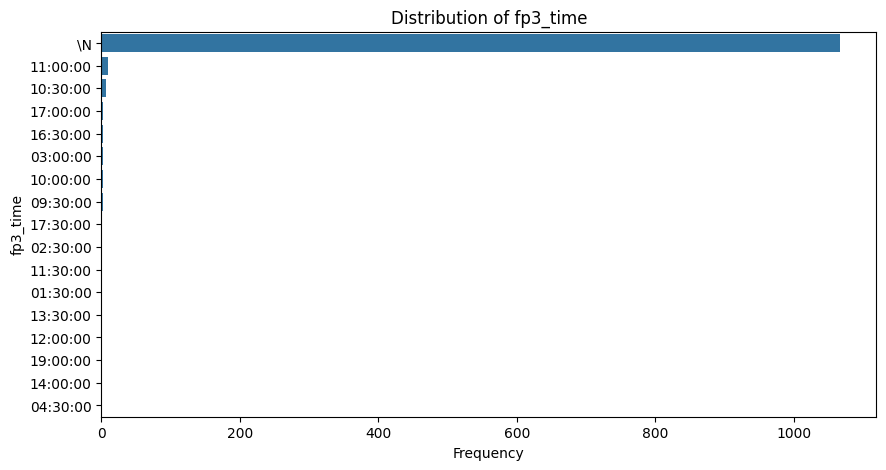

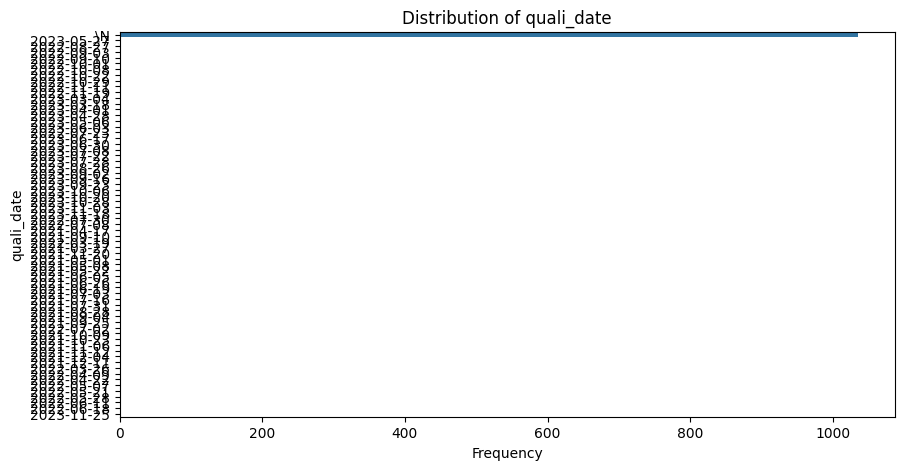

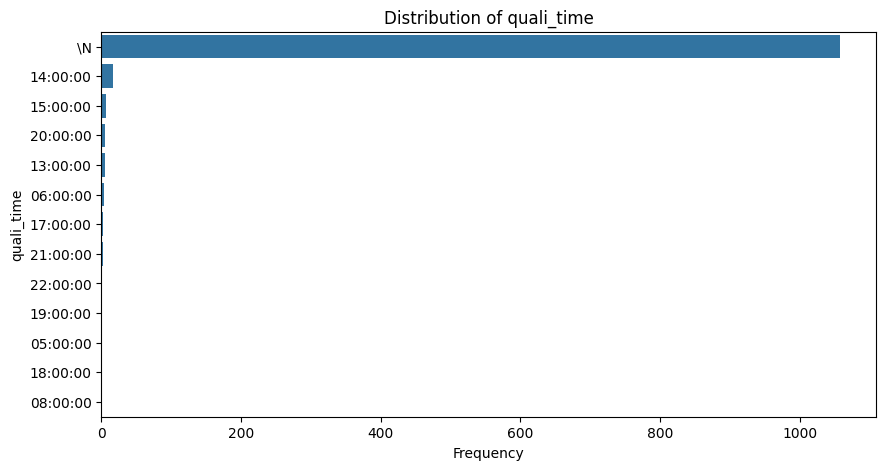

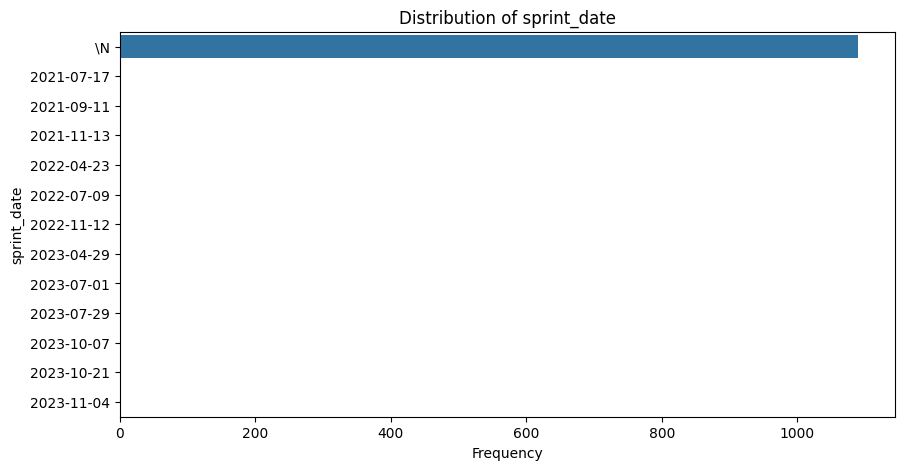

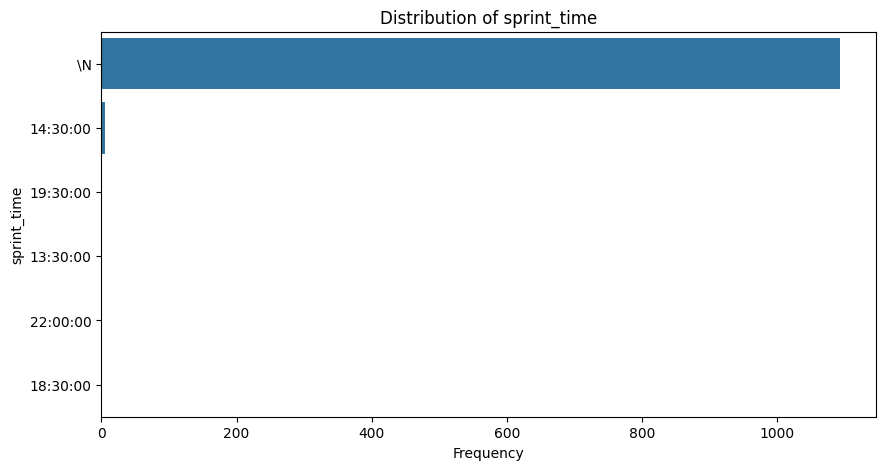





Numerical Feature


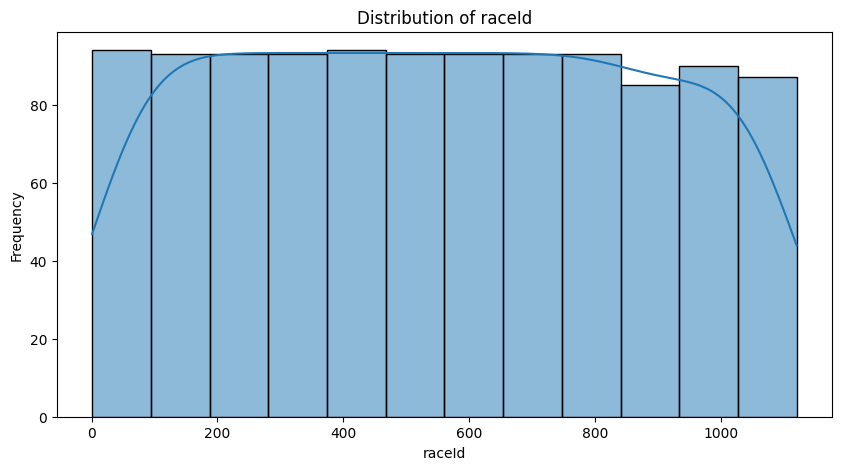



Outlier Analysis


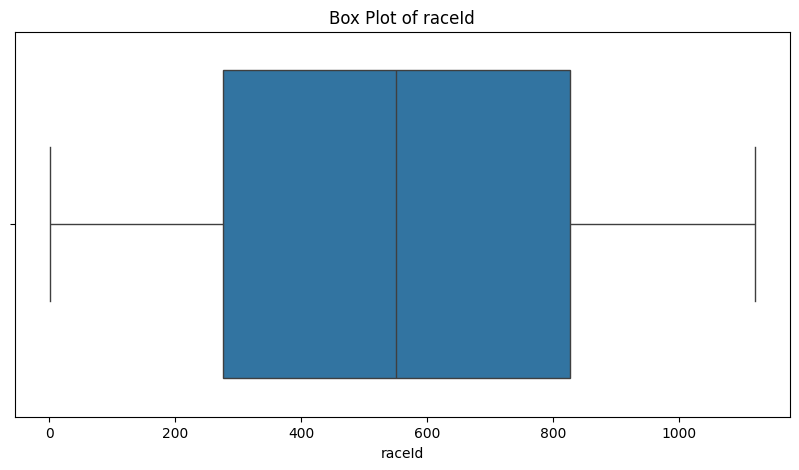



Outliers in raceId identified using IQR method:
Empty DataFrame
Columns: [raceId, year, round, circuitId, name, date, time, url, fp1_date, fp1_time, fp2_date, fp2_time, fp3_date, fp3_time, quali_date, quali_time, sprint_date, sprint_time]
Index: []





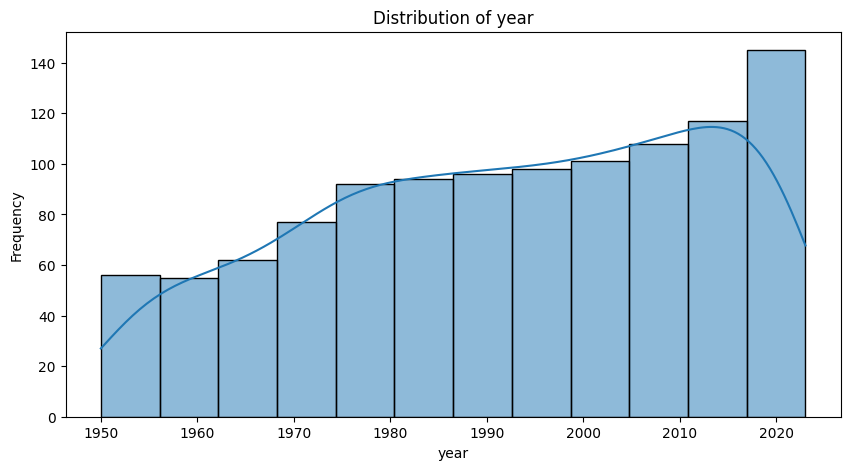



Outlier Analysis


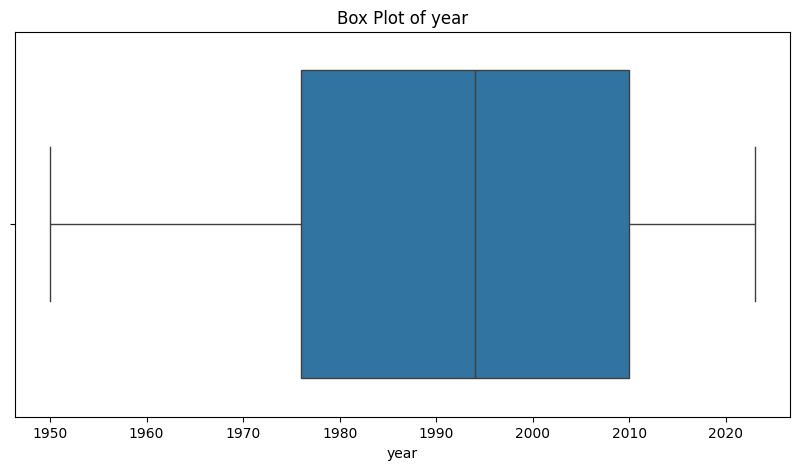



Outliers in year identified using IQR method:
Empty DataFrame
Columns: [raceId, year, round, circuitId, name, date, time, url, fp1_date, fp1_time, fp2_date, fp2_time, fp3_date, fp3_time, quali_date, quali_time, sprint_date, sprint_time]
Index: []





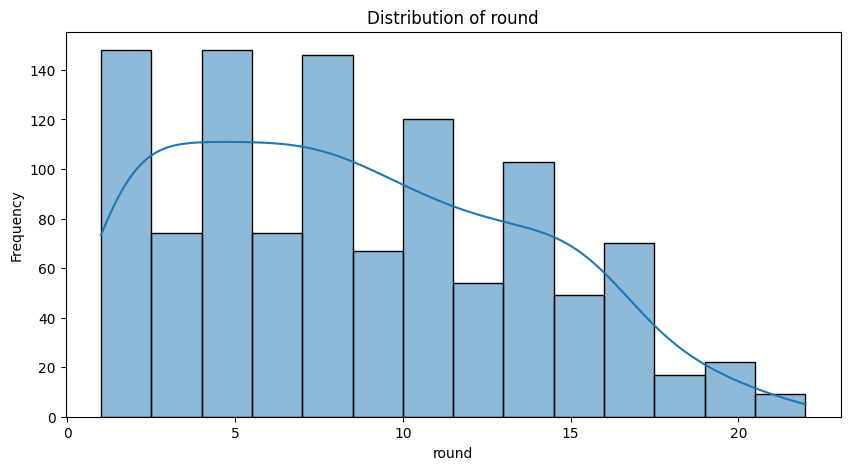



Outlier Analysis


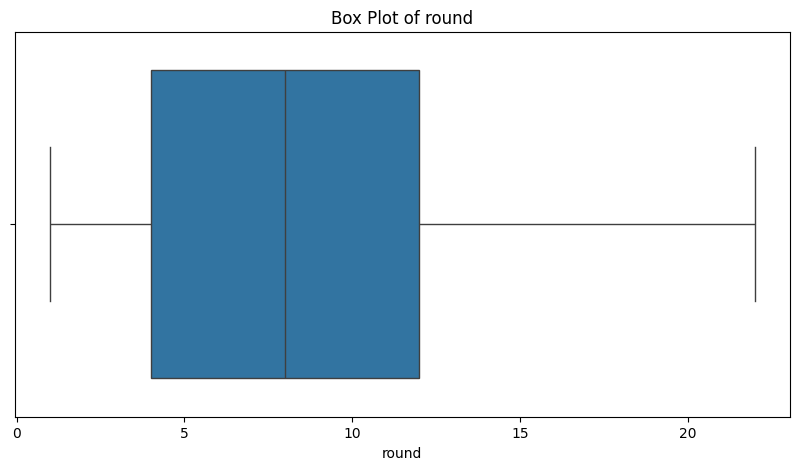



Outliers in round identified using IQR method:
Empty DataFrame
Columns: [raceId, year, round, circuitId, name, date, time, url, fp1_date, fp1_time, fp2_date, fp2_time, fp3_date, fp3_time, quali_date, quali_time, sprint_date, sprint_time]
Index: []





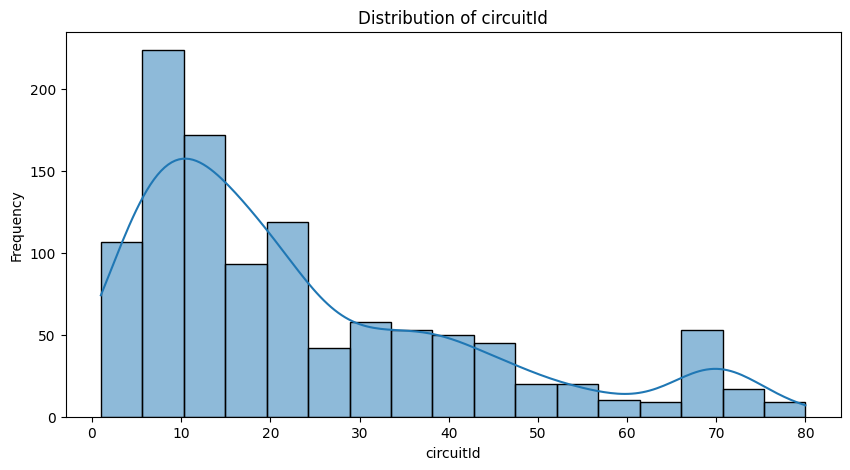



Outlier Analysis


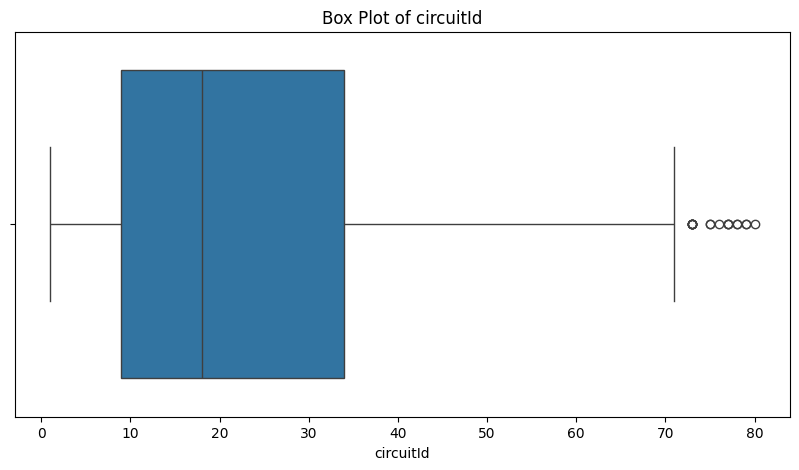



Outliers in circuitId identified using IQR method:
      raceId  year  round  circuitId                      name        date  \
942      955  2016      8         73       European Grand Prix  2016-06-19   
963      976  2017      8         73     Azerbaijan Grand Prix  2017-06-25   
979      992  2018      4         73     Azerbaijan Grand Prix  2018-04-29   
1000    1013  2019      4         73     Azerbaijan Grand Prix  2019-04-28   
1026    1039  2020      9         76         Tuscan Grand Prix  2020-09-13   
1029    1042  2020     12         75     Portuguese Grand Prix  2020-10-25   
1038    1051  2021     20         78          Qatar Grand Prix  2021-11-21   
1039    1054  2021      3         75     Portuguese Grand Prix  2021-05-02   
1042    1057  2021      6         73     Azerbaijan Grand Prix  2021-06-06   
1056    1072  2021     21         77  Saudi Arabian Grand Prix  2021-12-05   
1058    1075  2022      2         77  Saudi Arabian Grand Prix  2022-03-27   
1061    107

In [ ]:
#Visualization
print('Visualizations:')

# Categorical features
print('Categorical Features')
cat_columns = races_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=races_df[col], order=races_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs


print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = races_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(races_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=races_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = races_df[col].quantile(0.25)
    Q3 = races_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = races_df[(races_df[col] < Q1 - 1.5 * IQR) | (races_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")



###Correlation Matrix

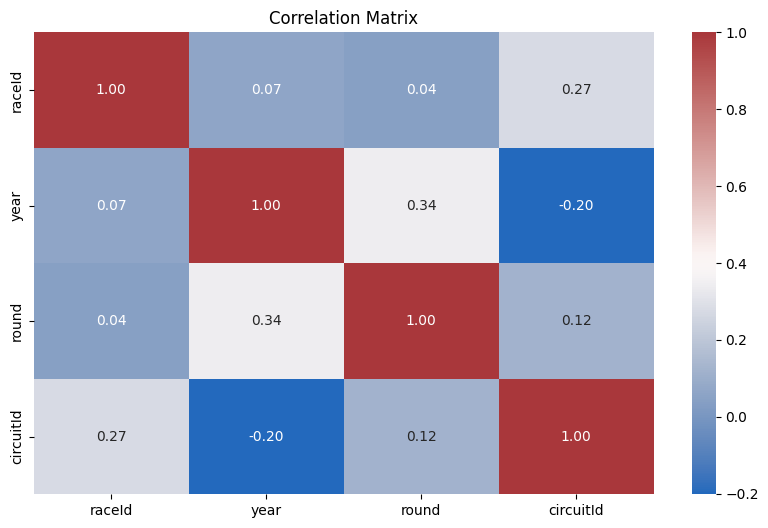

In [ ]:
#Create a correlation matrix visualization
num_columns = races_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = races_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Pit Stops Dataset**

###Data Structure Inspection

In [ ]:
print('\nData Dimensions:')
print(pit_stops_df.shape)

print('\n-dataset Columns:\n')
print(pit_stops_df.columns)

print('\n-First few rows:')
print(pit_stops_df.head(4))

print('\n-Basic Information:\n')
pit_stops_df.info()

# Check for missing values
print('\nMissing values:')
print(pit_stops_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(pit_stops_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(pit_stops_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(pit_stops_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(pit_stops_df.duplicated().sum())

# Sorting the DataFrame by race date in descending order
print('\nSorted by raceId ascending')
pit_stops_df_sorted = pit_stops_df.sort_values(by='raceId', ascending=True)
print(pit_stops_df_sorted)



Data Dimensions:
(10138, 7)

-dataset Columns:

Index(['raceId', 'driverId', 'pit_stops_stop', 'pit_stops_lap',
       'pit_stops_time', 'pit_stops_duration', 'pit_stops_time_in_seconds'],
      dtype='object')

-First few rows:
   raceId  driverId  pit_stops_stop  pit_stops_lap pit_stops_time  \
0     841       153               1              1       17:05:23   
1     841        30               1              1       17:05:52   
2     841        17               1             11       17:20:48   
3     841         4               1             12       17:22:34   

   pit_stops_duration  pit_stops_time_in_seconds  
0               26.90                     26.898  
1               25.02                     25.021  
2               23.43                     23.426  
3               23.25                     23.251  

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10138 entries, 0 to 10137
Data columns (total 7 columns):
 #   Column                     Non-Nul

###Summary Statistics

In [ ]:
print('Summary Statistics:\n')
pit_stops_df.describe(include='all')

Summary Statistics:



,raceId,driverId,stop,lap,time,duration,milliseconds
count,10089.000000,10089.000000,10089.000000,10089.000000,10089,10089,1.008900e+04
unique,NaN,NaN,NaN,NaN,7492,6969,NaN
top,NaN,NaN,NaN,NaN,14:22:38,22.745,NaN
freq,NaN,NaN,NaN,NaN,6,7,NaN
mean,962.774011,523.998910,1.759738,25.312023,NaN,NaN,7.534863e+04
std,81.144375,389.698555,0.916282,14.729775,NaN,NaN,2.788588e+05
min,841.000000,1.000000,1.000000,1.000000,NaN,NaN,1.289700e+04
25%,888.000000,18.000000,1.000000,13.000000,NaN,NaN,2.191400e+04
50%,958.000000,815.000000,2.000000,25.000000,NaN,NaN,2.357000e+04
75%,1035.000000,831.000000,2.000000,36.000000,NaN,NaN,2.620200e+04


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


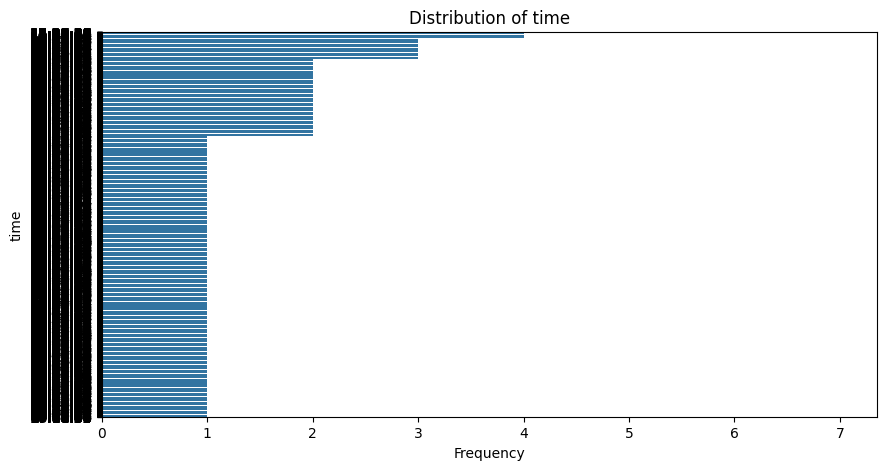





Numerical Feature


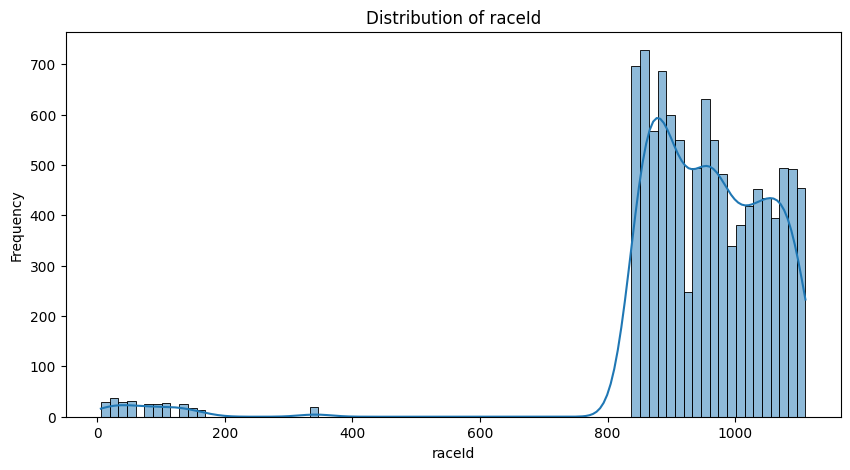



Outlier Analysis


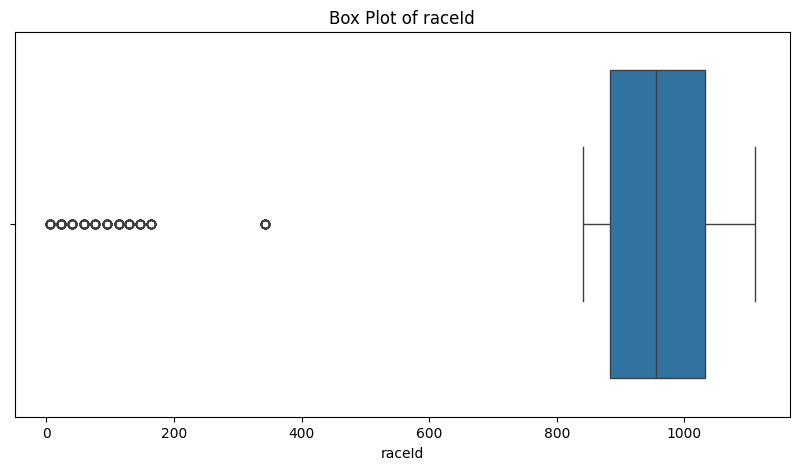



Outliers in raceId identified using IQR method:
       raceId  driverId  stop  lap      time  duration  milliseconds
10089       6         9     1    2  14:06:11     22.82       22824.0
10090       6        20     1   10  14:16:24     26.77       26771.0
10091       6         1     1   10  14:16:47     25.72       25715.0
10092       6        16     1   11  14:18:12     22.56       22561.0
10093       6         8     1   15  14:22:38     23.69       23693.0
...       ...       ...   ...  ...       ...       ...           ...
10368     164        49     1   53  15:48:05     27.26       27256.0
10369     164        22     1   53  15:48:06     27.42       27420.0
10370     164        63     1   53  15:48:52     28.06       28059.0
10371     164        35     1   54  15:50:44     27.43       27431.0
10372     164        14     1   56  15:51:54     28.19       28189.0

[284 rows x 7 columns]





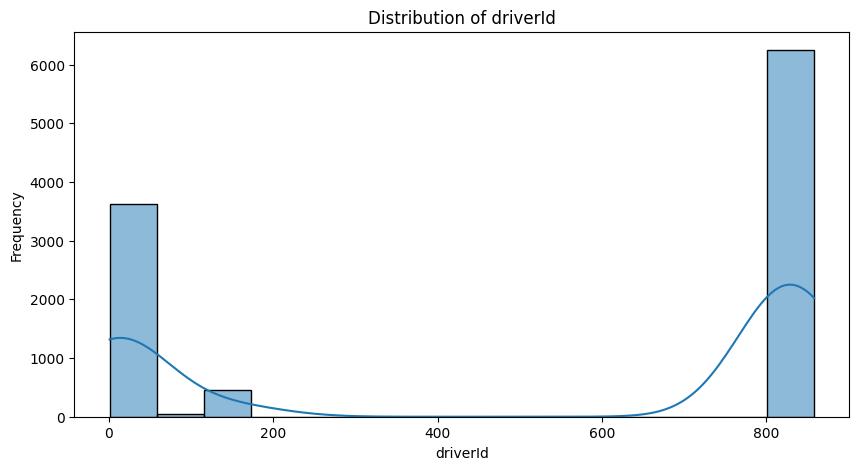



Outlier Analysis


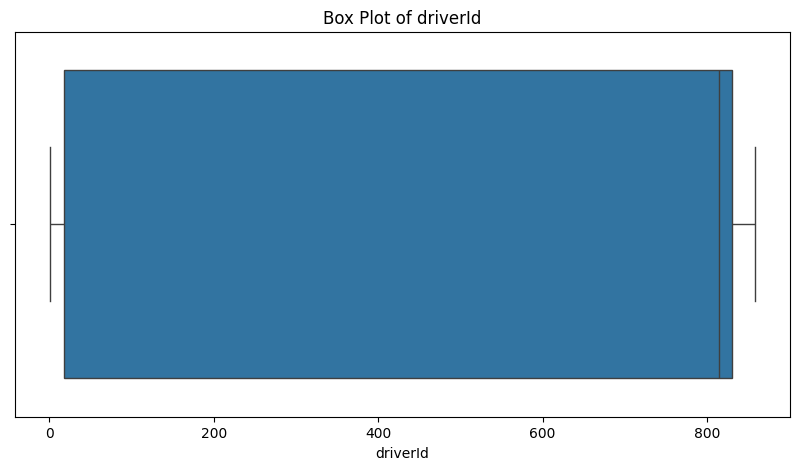



Outliers in driverId identified using IQR method:
Empty DataFrame
Columns: [raceId, driverId, stop, lap, time, duration, milliseconds]
Index: []





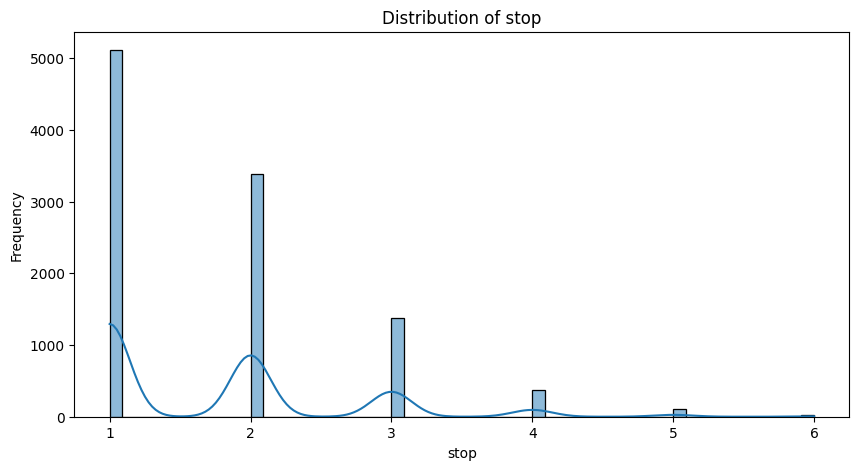



Outlier Analysis


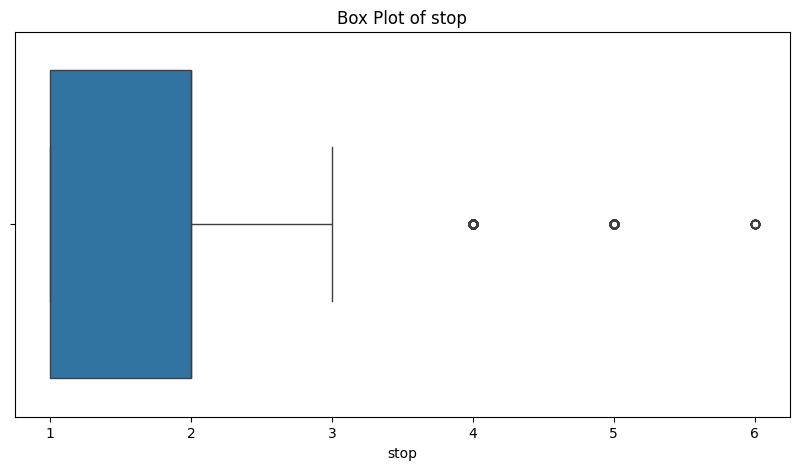



Outliers in stop identified using IQR method:
       raceId  driverId  stop  lap      time  duration  milliseconds
42        841        22     4   40  18:08:03     26.31       26309.0
99        842        17     4   43  17:19:10     22.16       22161.0
101       842         4     4   46  17:24:24     27.18       27182.0
103       842         1     4   52  17:34:48     22.47       22466.0
161       843       815     4   50  16:31:39     28.85       28845.0
...       ...       ...   ...  ...       ...       ...           ...
9983     1107       852     4   43  15:56:56     21.39       21392.0
9990     1107       840     4   54  16:09:28     21.84       21837.0
9991     1107       830     4   69  16:25:43     21.33       21328.0
10168      23         3     4   53  15:29:20     27.19       27186.0
10174      23         8     4   68  15:53:21     27.60       27602.0

[500 rows x 7 columns]





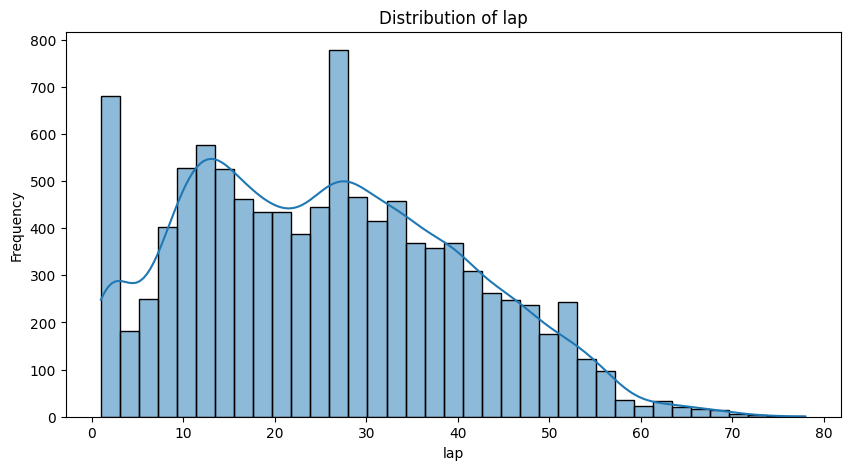



Outlier Analysis


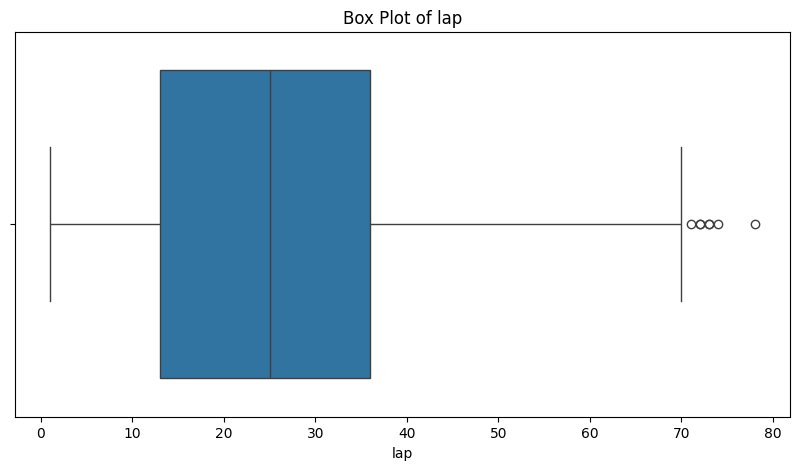



Outliers in lap identified using IQR method:
       raceId  driverId  stop  lap      time  duration  milliseconds
1448      865         5     2   73  15:43:52     31.29       31293.0
1449      865        39     2   74  15:46:48     26.97       26973.0
3276      905         8     3   73  15:47:37     31.90       31896.0
5774      974       815     3   72  15:40:06     35.49       35485.0
6416      994       838     2   72  16:48:42     25.44       25438.0
8006     1046       847     4   78  21:35:26     24.24       24235.0
10117       6         6     2   71  15:35:40     21.87       21865.0





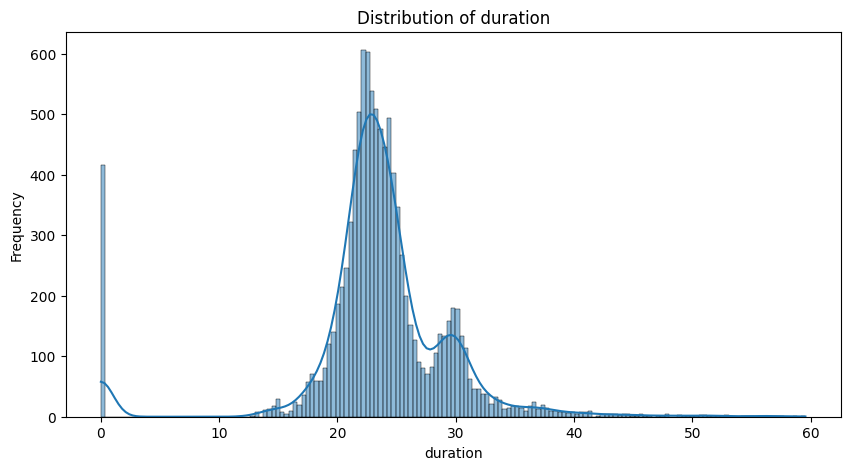



Outlier Analysis


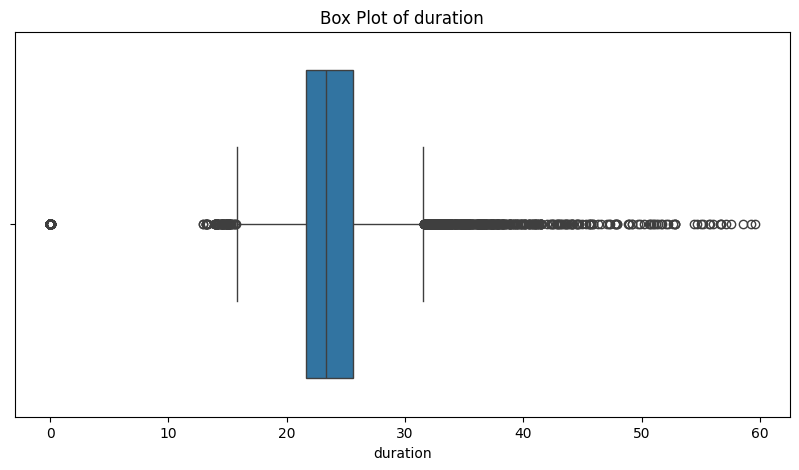



Outliers in duration identified using IQR method:
       raceId  driverId  stop  lap      time  duration  milliseconds
24        841        22     2   23  17:40:45     37.86  37856.000000
45        842        16     1    3  16:09:07     31.69  31694.000000
46        842        22     1    3  16:10:04     32.98  32978.000000
102       842        24     3   44  17:25:07     38.82  38823.000000
105       843        24     1    9  15:20:00     14.16  14160.000000
...       ...       ...   ...  ...       ...       ...           ...
10346     147        50     1   42  15:01:50      0.00      0.716019
10347     147        59     1   43  15:04:04     33.12  33124.000000
10348     147        58     1   44  15:06:58     32.43  32431.000000
10359     164        65     1   27  15:12:09      0.00      0.759444
10360     164        57     1   36  15:24:38      0.00      0.873981

[1075 rows x 7 columns]





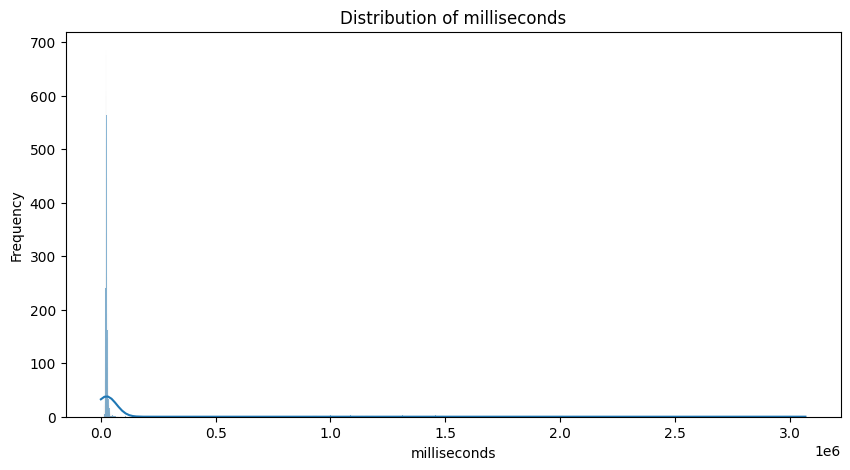



Outlier Analysis


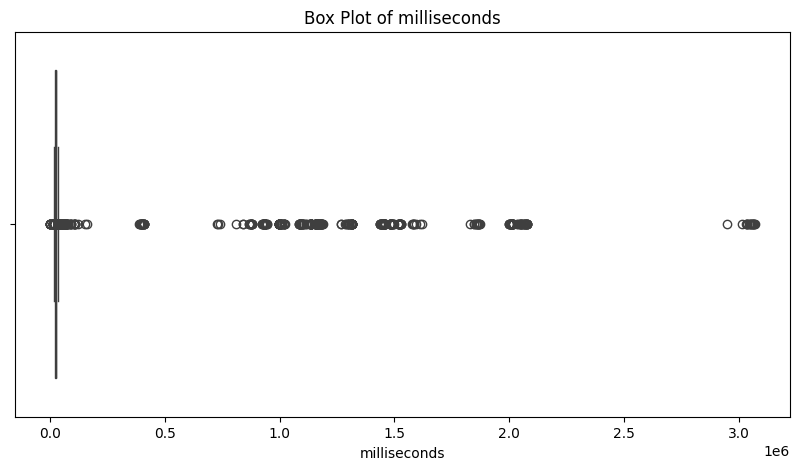



Outliers in milliseconds identified using IQR method:
       raceId  driverId  stop  lap      time  duration  milliseconds
24        841        22     2   23  17:40:45     37.86  37856.000000
102       842        24     3   44  17:25:07     38.82  38823.000000
105       843        24     1    9  15:20:00     14.16  14160.000000
154       843        10     3   39  16:14:17     33.83  33827.000000
160       843       815     3   48  16:28:01     13.90  13900.000000
...       ...       ...   ...  ...       ...       ...           ...
10344     147        57     1   14  14:22:35     55.05  55054.000000
10345     147         8     1   15  14:24:39      0.00      3.540914
10346     147        50     1   42  15:01:50      0.00      0.716019
10359     164        65     1   27  15:12:09      0.00      0.759444
10360     164        57     1   36  15:24:38      0.00      0.873981

[886 rows x 7 columns]







In [ ]:
print('Visualizations:')

# Categorical features
print('Categorical Features')
cat_columns = pit_stops_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=pit_stops_df[col], order=pit_stops_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = pit_stops_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(pit_stops_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=pit_stops_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = pit_stops_df[col].quantile(0.25)
    Q3 = pit_stops_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = pit_stops_df[(pit_stops_df[col] < Q1 - 1.5 * IQR) | (pit_stops_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

###Correlation Matrix

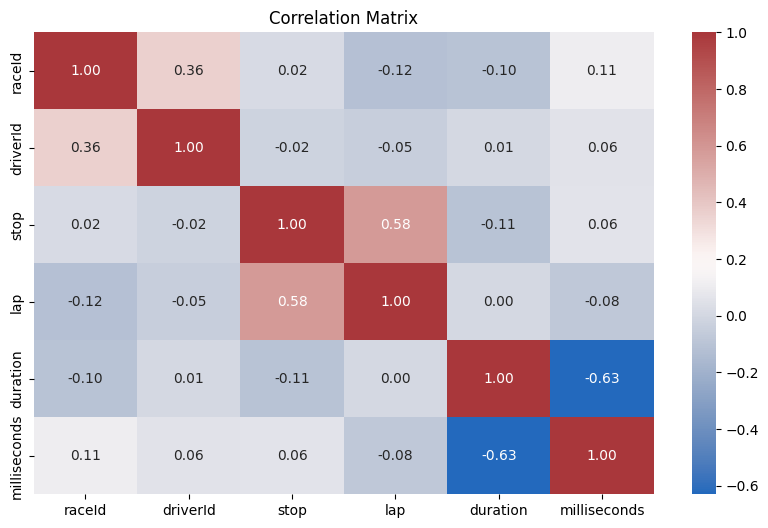

In [ ]:
num_columns = pit_stops_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = pit_stops_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Results** **Dataset**



In [ ]:
print('\nData Dimensions:')
print(results_df.shape)

print('\n-dataset Columns:\n')
print(results_df.columns)

print('\n-dataset Heads:\n')
print(results_df.head())


Data Dimensions:
(26080, 18)

-dataset Columns:

Index(['resultId', 'raceId', 'driverId', 'constructorId', 'number', 'grid',
       'position', 'positionText', 'positionOrder', 'points', 'laps', 'time',
       'milliseconds', 'fastestLap', 'rank', 'fastestLapTime',
       'fastestLapSpeed', 'statusId'],
      dtype='object')

-dataset Heads:

   resultId  raceId  driverId  constructorId number  grid position  \
0         1      18         1              1     22     1        1   
1         2      18         2              2      3     5        2   
2         3      18         3              3      7     7        3   
3         4      18         4              4      5    11        4   
4         5      18         5              1     23     3        5   

  positionText  positionOrder  points  laps         time milliseconds  \
0            1              1    10.0    58  1:34:50.616      5690616   
1            2              2     8.0    58       +5.478      5696094   
2            3

In [ ]:
#Read the results csv file and create a data frame.
results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26080 entries, 0 to 26079
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   resultId         26080 non-null  int64  
 1   raceId           26080 non-null  int64  
 2   driverId         26080 non-null  int64  
 3   constructorId    26080 non-null  int64  
 4   number           26080 non-null  object 
 5   grid             26080 non-null  int64  
 6   position         26080 non-null  object 
 7   positionText     26080 non-null  object 
 8   positionOrder    26080 non-null  int64  
 9   points           26080 non-null  float64
 10  laps             26080 non-null  int64  
 11  time             26080 non-null  object 
 12  milliseconds     26080 non-null  object 
 13  fastestLap       26080 non-null  object 
 14  rank             26080 non-null  object 
 15  fastestLapTime   26080 non-null  object 
 16  fastestLapSpeed  26080 non-null  object 
 17  statusId    

In [ ]:
#Return total of unique values
results_df.nunique()

resultId           26080
raceId              1091
driverId             857
constructorId        210
number               130
grid                  35
position              34
positionText          39
positionOrder         39
points                39
laps                 172
time                7000
milliseconds        7213
fastestLap            80
rank                  26
fastestLapTime      6970
fastestLapSpeed     7145
statusId             137
dtype: int64

In [ ]:
#Check for missing values
results_df.isnull().sum()

resultId           0
raceId             0
driverId           0
constructorId      0
number             0
grid               0
position           0
positionText       0
positionOrder      0
points             0
laps               0
time               0
milliseconds       0
fastestLap         0
rank               0
fastestLapTime     0
fastestLapSpeed    0
statusId           0
dtype: int64

In [ ]:
#Check for NA values.
results_df.isna().sum()

resultId           0
raceId             0
driverId           0
constructorId      0
number             0
grid               0
position           0
positionText       0
positionOrder      0
points             0
laps               0
time               0
milliseconds       0
fastestLap         0
rank               0
fastestLapTime     0
fastestLapSpeed    0
statusId           0
dtype: int64

In [ ]:
#Check for columns that have \N values
results_df.applymap(lambda x: x == r'\N').any()

resultId           False
raceId             False
driverId           False
constructorId      False
number              True
grid               False
position            True
positionText       False
positionOrder      False
points             False
laps               False
time                True
milliseconds        True
fastestLap          True
rank                True
fastestLapTime      True
fastestLapSpeed     True
statusId           False
dtype: bool

In [ ]:
#Check for duplicates in dataset
print('\nDuplicates:')
print(results_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(results_df.duplicated().sum())


Duplicates:
0        False
1        False
2        False
3        False
4        False
         ...  
26075    False
26076    False
26077    False
26078    False
26079    False
Length: 26080, dtype: bool

Duplicated Rows Number:
0


In [ ]:
#Summary statistics
results_df.describe()

,resultId,raceId,driverId,constructorId,grid,positionOrder,points,laps,statusId
count,26080.000000,26080.000000,26080.000000,26080.000000,26080.000000,26080.000000,26080.000000,26080.000000,26080.000000
mean,13041.372661,536.695667,266.277569,49.059663,11.167561,12.854141,1.906635,46.076687,17.476074
std,7530.008377,303.034639,272.581622,60.221056,7.232797,7.700068,4.219715,29.726058,26.129965
min,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
25%,6520.750000,294.750000,57.000000,6.000000,5.000000,6.000000,0.000000,22.000000,1.000000
50%,13040.500000,519.000000,163.000000,25.000000,11.000000,12.000000,0.000000,53.000000,10.000000
75%,19560.250000,791.000000,364.000000,58.250000,17.000000,18.000000,2.000000,66.000000,14.000000
max,26085.000000,1110.000000,858.000000,214.000000,34.000000,39.000000,50.000000,200.000000,141.000000


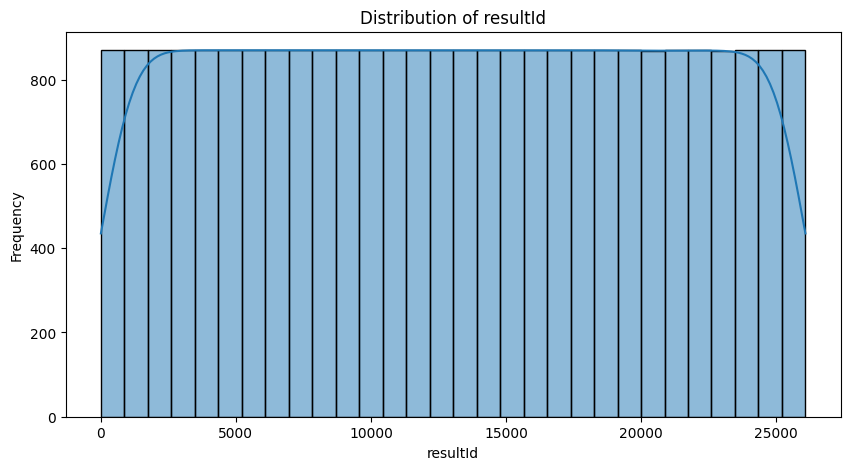



Outlier Analysis


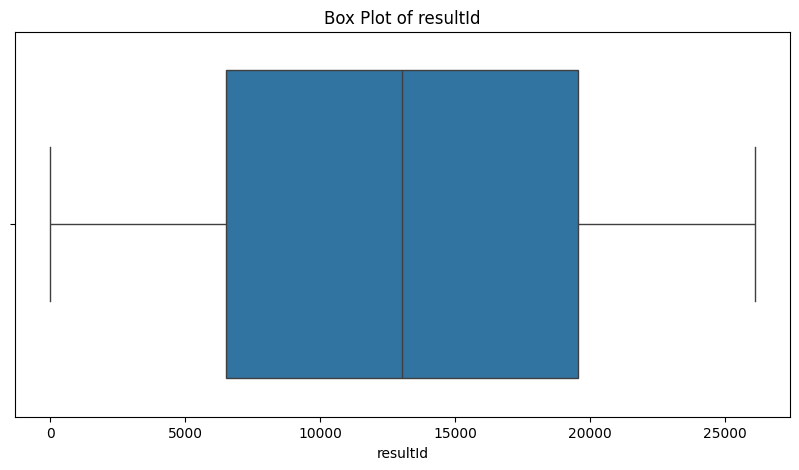



Outliers in resultId identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, rank, fastestLapTime, fastestLapSpeed, statusId]
Index: []





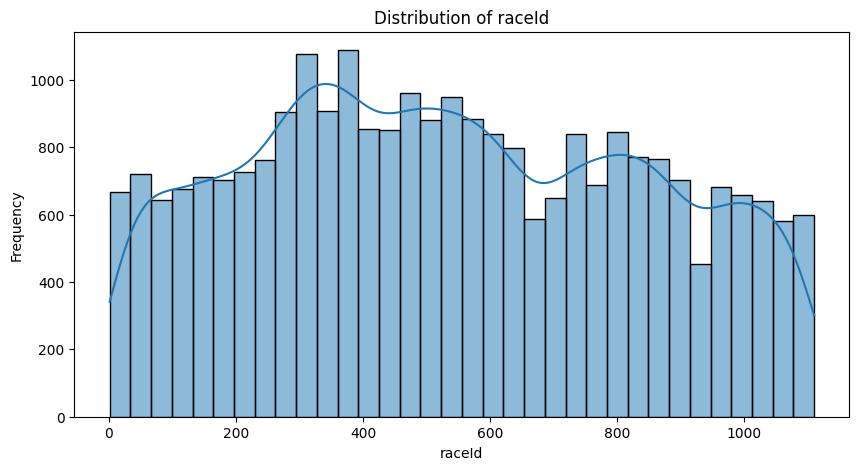



Outlier Analysis


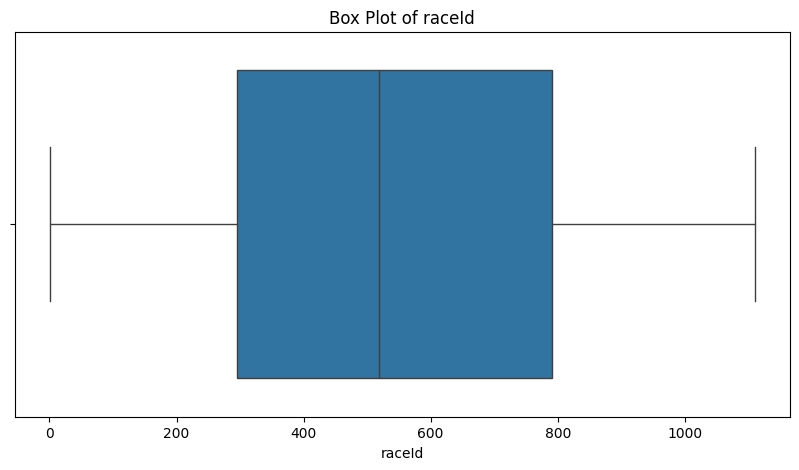



Outliers in raceId identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, rank, fastestLapTime, fastestLapSpeed, statusId]
Index: []





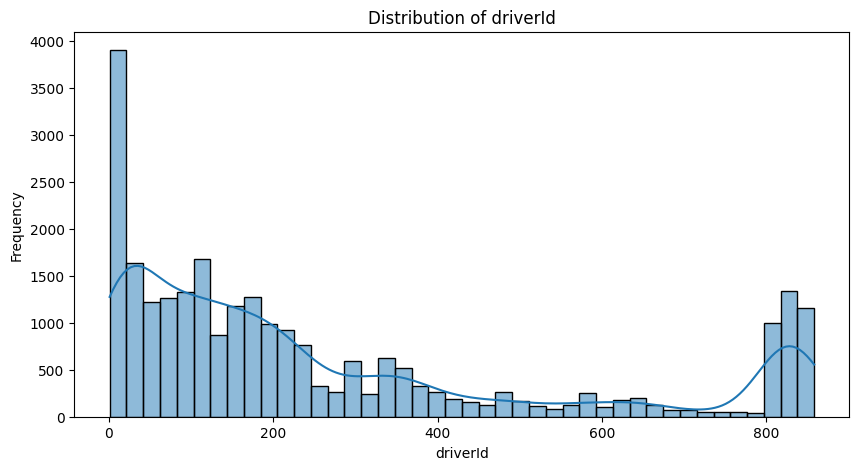



Outlier Analysis


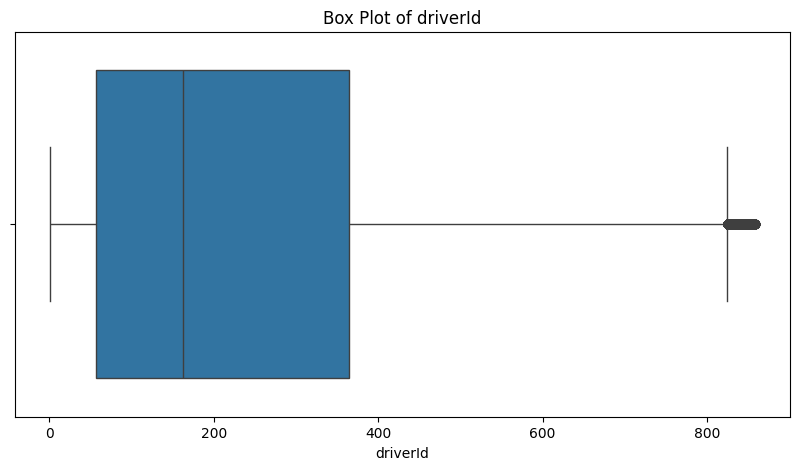



Outliers in driverId identified using IQR method:
       resultId  raceId  driverId  constructorId number  grid position  \
22128     22131     900       825              1     20     4        2   
22135     22138     900       826              5     26     8        9   
22143     22146     900       828            207      9    19       \N   
22157     22160     901       825              1     20     8        9   
22158     22161     901       826              5     26    11       10   
...         ...     ...       ...            ...    ...   ...      ...   
26073     26079    1110       848              3     23    15       14   
26074     26080    1110       825            210     20    16       15   
26076     26082    1110       858              3      2    18       17   
26078     26084    1110       832              6     55     4       \N   
26079     26085    1110       857              1     81     5       \N   

      positionText  positionOrder  points  laps       time 

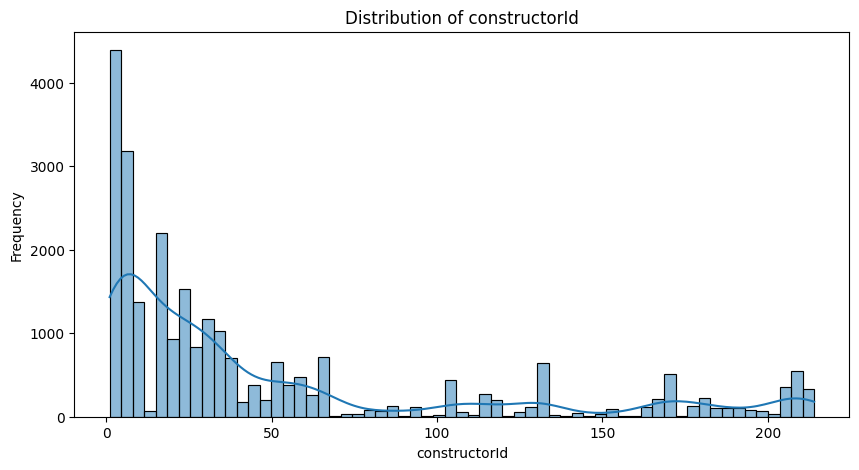



Outlier Analysis


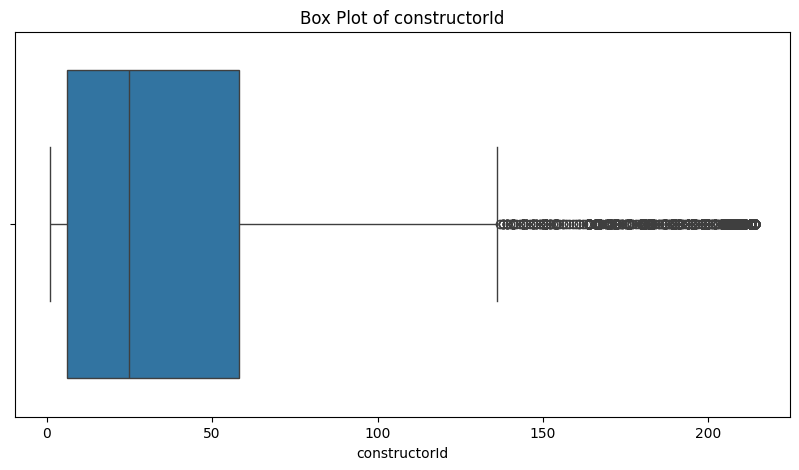



Outliers in constructorId identified using IQR method:
       resultId  raceId  driverId  constructorId number  grid position  \
12393     12394     512       182            204      5    23       \N   
12398     12399     512       137            204      6    20       \N   
12422     12423     513       182            204      5    12       \N   
12423     12424     513       137            204      6    22       \N   
12433     12434     514       182            204      5     4        6   
...         ...     ...       ...            ...    ...   ...      ...   
26069     26075    1110       852            213     22    11       10   
26070     26076    1110       842            214     10    12       11   
26074     26080    1110       825            210     20    16       15   
26075     26081    1110       817            213      3    19       16   
26077     26083    1110       807            210     27     0       18   

      positionText  positionOrder  points  laps       

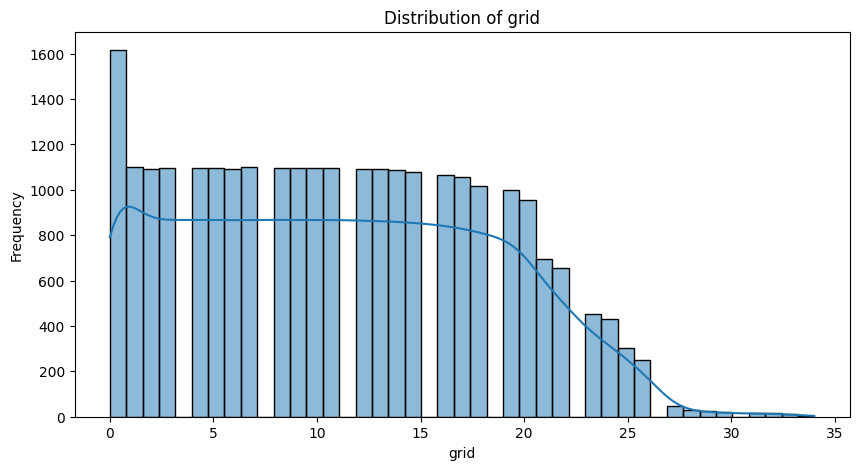



Outlier Analysis


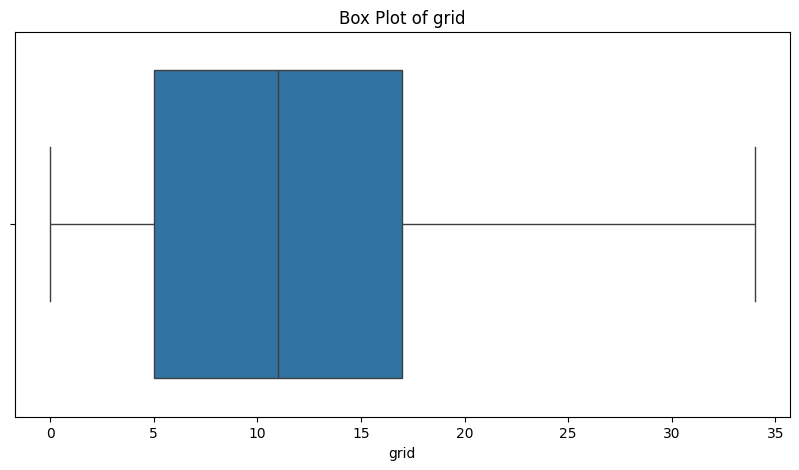



Outliers in grid identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, rank, fastestLapTime, fastestLapSpeed, statusId]
Index: []





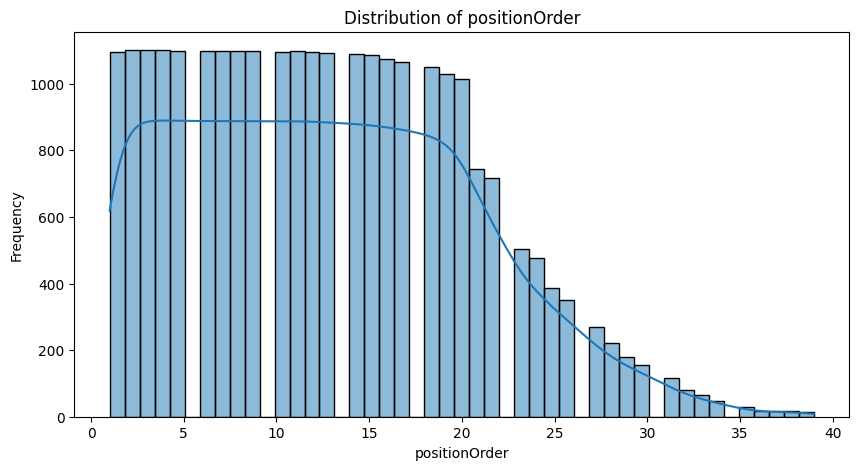



Outlier Analysis


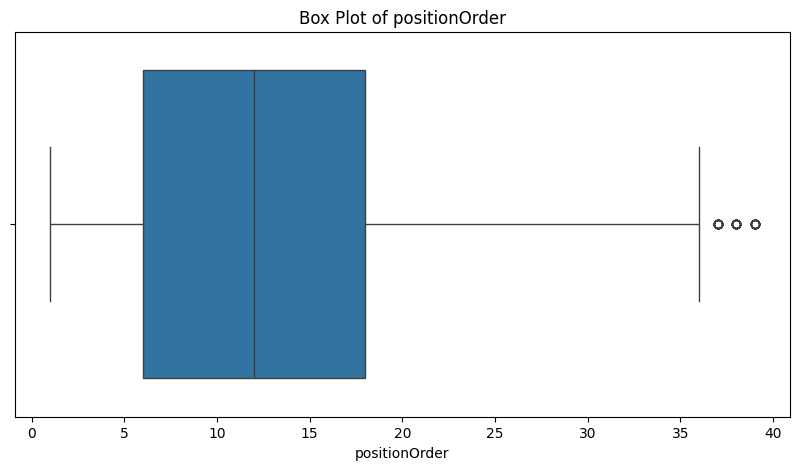



Outliers in positionOrder identified using IQR method:
       resultId  raceId  driverId  constructorId number  grid position  \
7909       7910     356       140             46     36     0       \N   
7910       7911     356        92             46     37     0       \N   
7947       7948     357        88             49     35     0       \N   
7948       7949     357       146             49     34     0       \N   
7949       7950     357       161             48     39     0       \N   
7986       7987     358        88             49     35     0       \N   
7987       7988     358       164             39     41     0       \N   
8024       8025     359       160             45     18     0       \N   
8025       8026     359       164             39     41     0       \N   
8026       8027     359       162             42     32     0       \N   
8063       8064     360        88             49     35     0       \N   
8064       8065     360       146             49     34

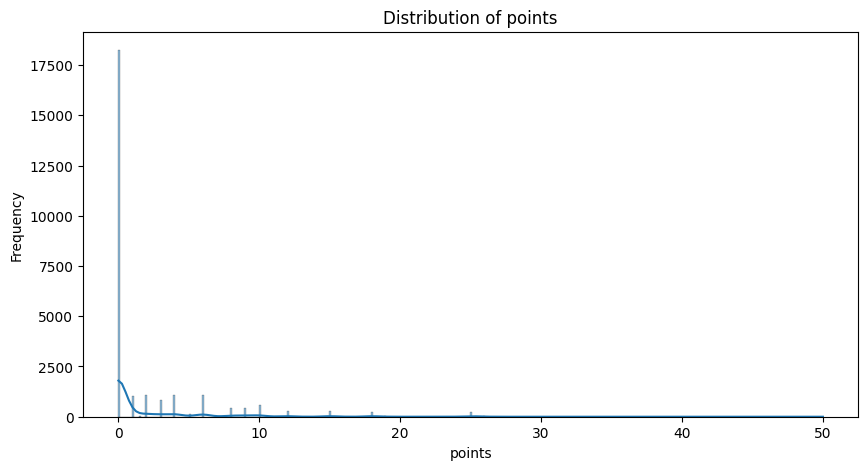



Outlier Analysis


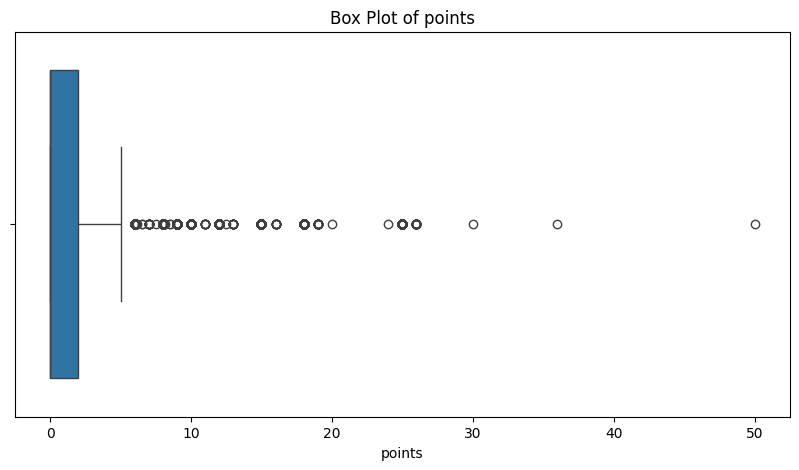



Outliers in points identified using IQR method:
       resultId  raceId  driverId  constructorId number  grid position  \
0             1      18         1              1     22     1        1   
1             2      18         2              2      3     5        2   
2             3      18         3              3      7     7        3   
22           23      19         8              6      1     2        1   
23           24      19         9              2      4     4        2   
...         ...     ...       ...            ...    ...   ...      ...   
26062     26068    1110       844              6     16     1        3   
26063     26069    1110         1            131     44     3        4   
26064     26070    1110         4            117     14     9        5   
26065     26071    1110       847            131     63     8        6   
26066     26072    1110       846              1      4     7        7   

      positionText  positionOrder  points  laps         time 

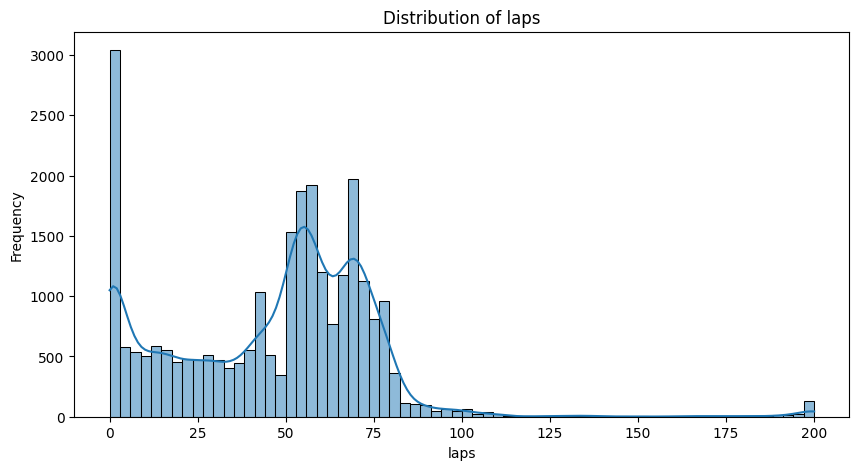



Outlier Analysis


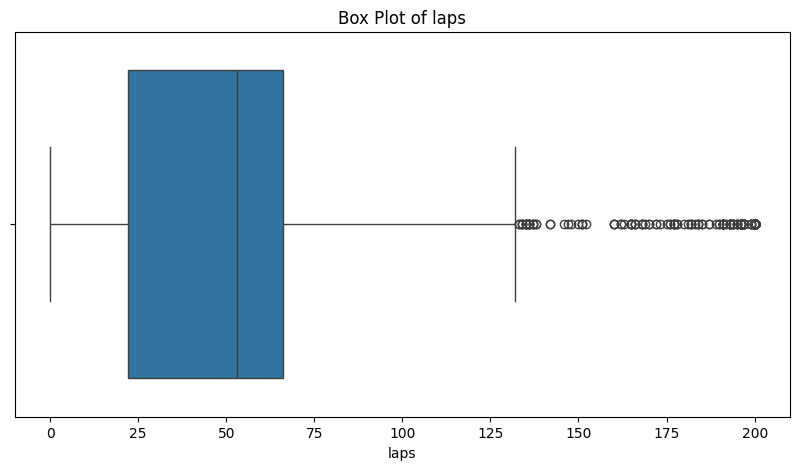



Outliers in laps identified using IQR method:
       resultId  raceId  driverId  constructorId number  grid position  \
18112     18113     748       509            107      4     2        1   
18113     18114     748       449            107      1     3        2   
18114     18115     748       510            108     99    26        3   
18115     18116     748       511            109      7     8        4   
18116     18117     748       512            110      3    17        5   
...         ...     ...       ...            ...    ...   ...      ...   
20232     20233     800       556            138     43     4       \N   
20233     20234     800       702            134     74    23       \N   
20260     20261     794       555            113     10     2        2   
20261     20262     794       519            113     77     7        5   
20272     20273     786       532            113     10    14       \N   

      positionText  positionOrder  points  laps        time mil

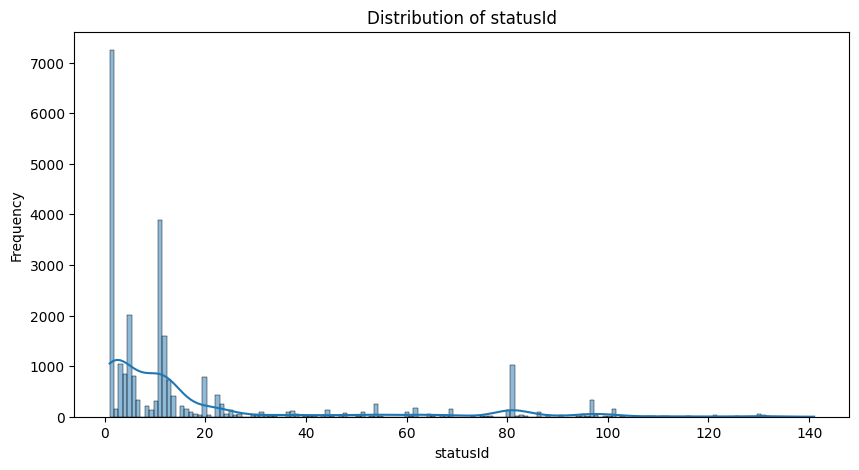



Outlier Analysis


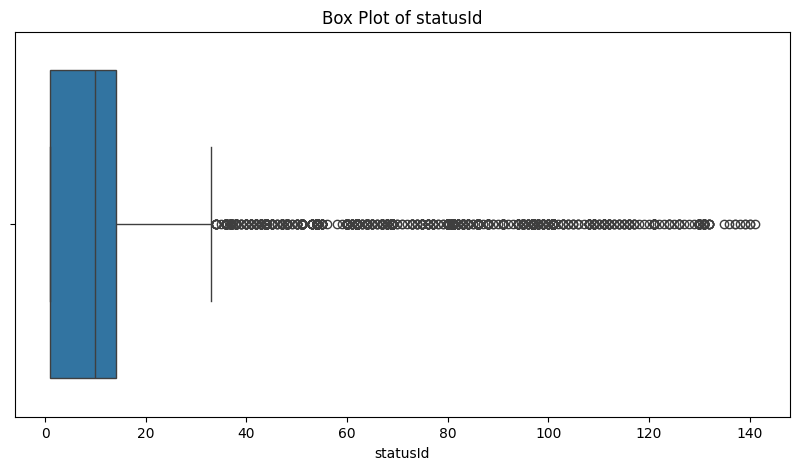



Outliers in statusId identified using IQR method:
       resultId  raceId  driverId  constructorId number  grid position  \
516         517      42        24              5     18    19       17   
540         541      43        27             12     21    20       \N   
563         564      44        23              7     11     6       \N   
608         609      46        18             11      7    17       \N   
674         675      49        20              5     19    16       \N   
...         ...     ...       ...            ...    ...   ...      ...   
26039     26045    1108       839            214     31    13       \N   
26058     26064    1109       839            214     31    12       \N   
26059     26065    1109       842            214     10    15       \N   
26078     26084    1110       832              6     55     4       \N   
26079     26085    1110       857              1     81     5       \N   

      positionText  positionOrder  points  laps time millis

In [ ]:
#Create distribution visualization of all columns with a numerical type.
cols = results_df.select_dtypes(include=['int64', 'float64']).columns
for col in cols:
  plt.figure(figsize=(10, 5))
  sns.histplot(results_df[col].dropna(), kde=True)
  plt.title(f'Distribution of {col}')
  plt.xlabel(col)
  plt.ylabel('Frequency')
  plt.show()
  print("\n")  # Add a space between graphs

# Outlier analysis using box plot
  print('Outlier Analysis')
  plt.figure(figsize=(10, 5))
  sns.boxplot(x=results_df[col])
  plt.title(f'Box Plot of {col}')
  plt.xlabel(col)
  plt.show()
  print("\n")  # Add a space between graphs

# Outlier analysis using IQR
  Q1 = results_df[col].quantile(0.25)
  Q3 = results_df[col].quantile(0.75)
  IQR = Q3 - Q1
  outliers = results_df[(results_df[col] < Q1 - 1.5 * IQR) | (results_df[col] > Q3 + 1.5 * IQR)]
  print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
  print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

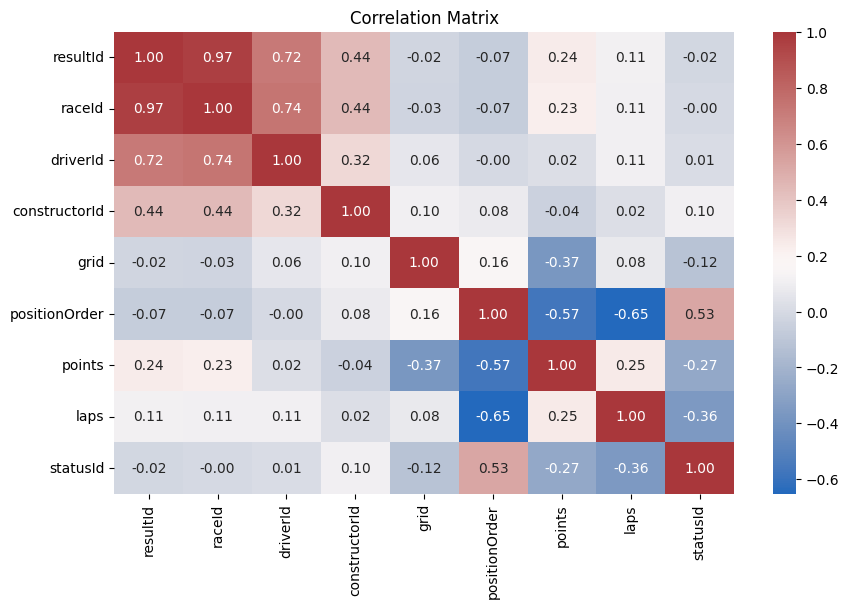

In [ ]:
#Create a correlation matrix visualization
num_columns = results_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = results_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

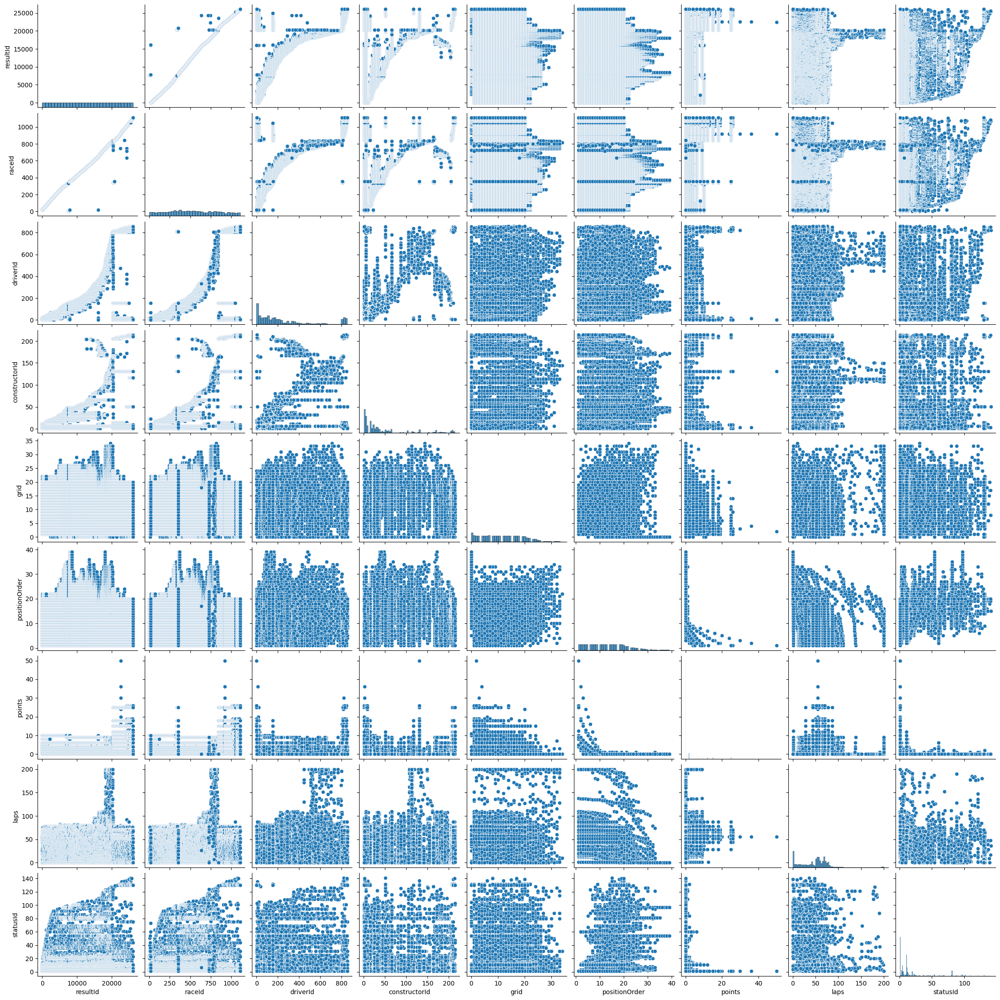

In [ ]:
sns.pairplot(results_df[num_columns])
plt.show()

##**Constructors Dataset**

###Data Structure Inspection

In [ ]:
print('\nData Dimensions:')
print(constructors_df.shape)

print('\n-dataset Columns:\n')
print(constructors_df.columns)

print('\n-First few rows:')
print(constructors_df.head(4))

print('\n-Basic Information:\n')
constructors_df.info()

# Check for missing values
print('\nMissing values:')
print(constructors_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(constructors_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(constructors_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(constructors_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(constructors_df.duplicated().sum())


Data Dimensions:
(211, 5)

-dataset Columns:

Index(['constructorId', 'constructorRef', 'name', 'nationality', 'url'], dtype='object')

-First few rows:
   constructorId constructorRef        name nationality  \
0              1        mclaren     McLaren     British   
1              2     bmw_sauber  BMW Sauber      German   
2              3       williams    Williams     British   
3              4        renault     Renault      French   

                                                 url  
0               http://en.wikipedia.org/wiki/McLaren  
1            http://en.wikipedia.org/wiki/BMW_Sauber  
2  http://en.wikipedia.org/wiki/Williams_Grand_Pr...  
3  http://en.wikipedia.org/wiki/Renault_in_Formul...  

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   constructorId   211 non-null    int64 
 1   constructorR

###Summary statistics

In [ ]:
print('Summary Statistics:\n')
constructors_df.describe(include='all')

Summary Statistics:



,constructorId,constructorRef,name,nationality,url
count,211.000000,211,211,211,211
unique,NaN,211,211,24,174
top,NaN,mclaren,McLaren,British,http://en.wikipedia.org/wiki/Cooper_Car_Company
freq,NaN,1,1,86,11
mean,107.037915,NaN,NaN,NaN,NaN
std,61.653629,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN
25%,54.500000,NaN,NaN,NaN,NaN
50%,107.000000,NaN,NaN,NaN,NaN
75%,159.500000,NaN,NaN,NaN,NaN


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


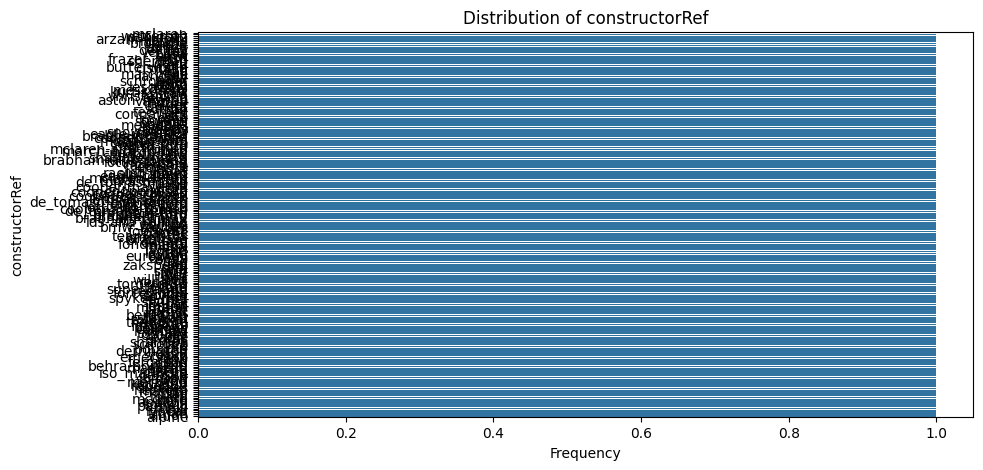

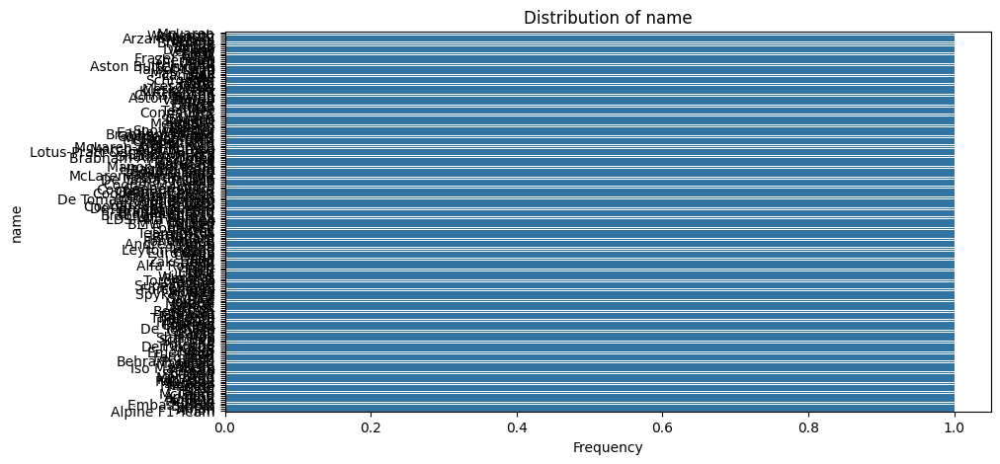

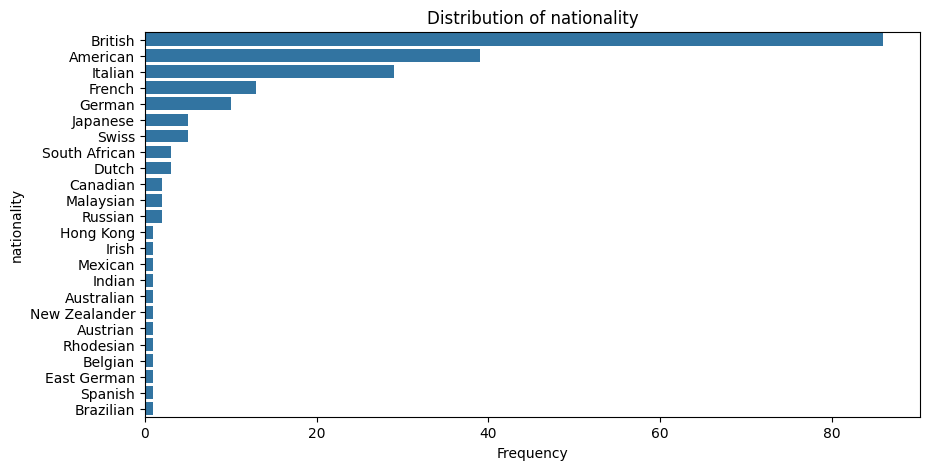

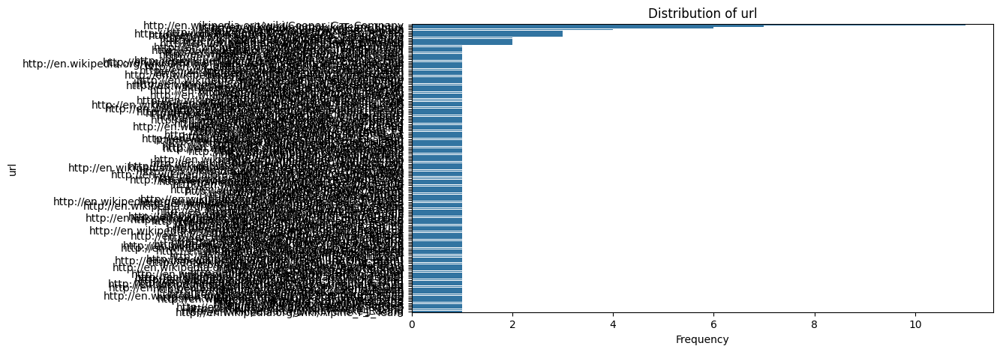





Numerical Feature


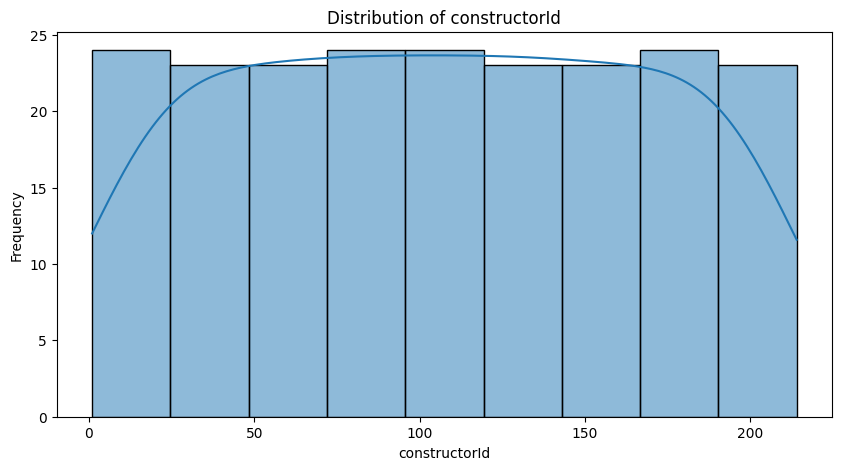



Outlier Analysis


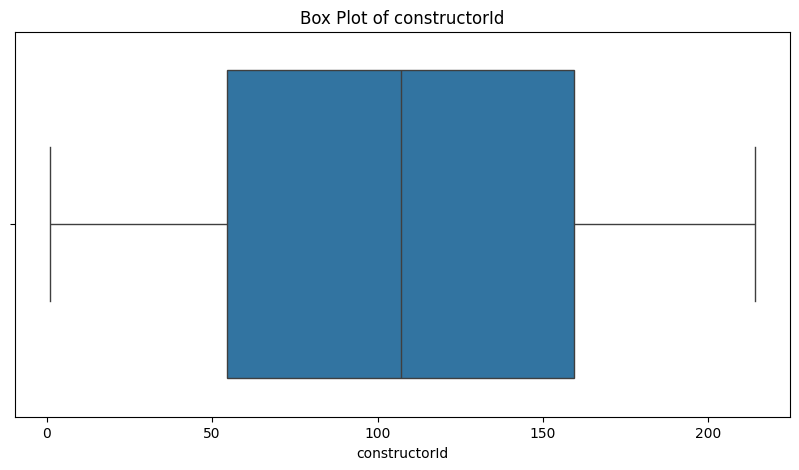



Outliers in constructorId identified using IQR method:
Empty DataFrame
Columns: [constructorId, constructorRef, name, nationality, url]
Index: []







In [ ]:
print('Visualizations:')

# Categorical features
print('Categorical Features')
cat_columns = constructors_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=constructors_df[col], order=constructors_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = constructors_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(constructors_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

# Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=constructors_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = constructors_df[col].quantile(0.25)
    Q3 = constructors_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = constructors_df[(constructors_df[col] < Q1 - 1.5 * IQR) | (constructors_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

###Correlation

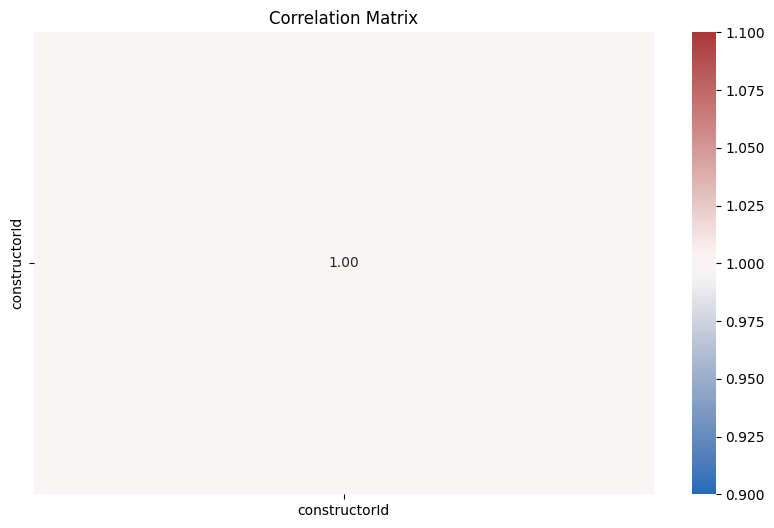

In [ ]:
#Create a correlation matrix visualization
num_columns = constructors_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = constructors_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Constructor Standings Dataset**

###Data Structure Inspection

In [ ]:
print('\nData Dimensions:')
print(driver_standings_df.shape)

print('\n-dataset Columns:\n')
print(constructor_standings_df.columns)

print('\n-First few rows:')
print(constructor_standings_df.head(4))

print('\n-Basic Information:\n')
constructor_standings_df.info()

# Check for missing values
print('\nMissing values:')
print(constructor_standings_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(constructor_standings_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(constructor_standings_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(constructor_standings_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(constructor_standings_df.duplicated().sum())


Data Dimensions:
(34124, 7)

-dataset Columns:

Index(['constructorStandingsId', 'raceId', 'constructorId', 'points',
       'position', 'positionText', 'wins'],
      dtype='object')

-First few rows:
   constructorStandingsId  raceId  constructorId  points  position  \
0                       1      18              1    14.0         1   
1                       2      18              2     8.0         3   
2                       3      18              3     9.0         2   
3                       4      18              4     5.0         4   

  positionText  wins  
0            1     1  
1            3     0  
2            2     0  
3            4     0  

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13051 entries, 0 to 13050
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   constructorStandingsId  13051 non-null  int64  
 1   raceId                  13051 non-nul

###Summary statistics

In [ ]:
print('Summary Statistics:\n')
constructor_standings_df.describe(include='all')

Summary Statistics:



,constructorStandingsId,raceId,constructorId,points,position,positionText,wins
count,13051.000000,13051.000000,13051.000000,13051.000000,13051.000000,13051,13051.000000
unique,NaN,NaN,NaN,NaN,NaN,23,NaN
top,NaN,NaN,NaN,NaN,NaN,1,NaN
freq,NaN,NaN,NaN,NaN,NaN,1027,NaN
mean,16674.407785,519.974638,48.470232,34.139108,7.271014,NaN,0.679182
std,8773.183393,296.269063,59.857491,77.227726,4.378793,NaN,1.823594
min,1.000000,1.000000,1.000000,0.000000,1.000000,NaN,0.000000
25%,8798.500000,296.000000,6.000000,0.000000,4.000000,NaN,0.000000
50%,20348.000000,497.000000,25.000000,7.000000,7.000000,NaN,0.000000
75%,24674.500000,721.000000,57.000000,31.000000,10.000000,NaN,0.000000


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


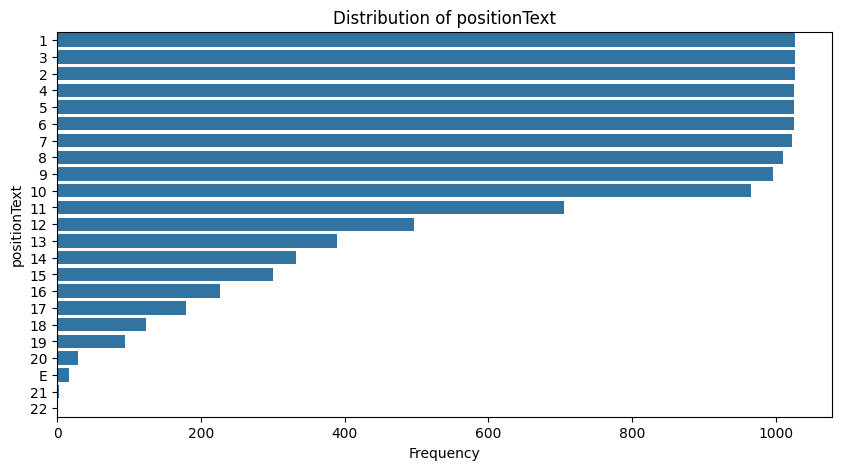





Numerical Feature


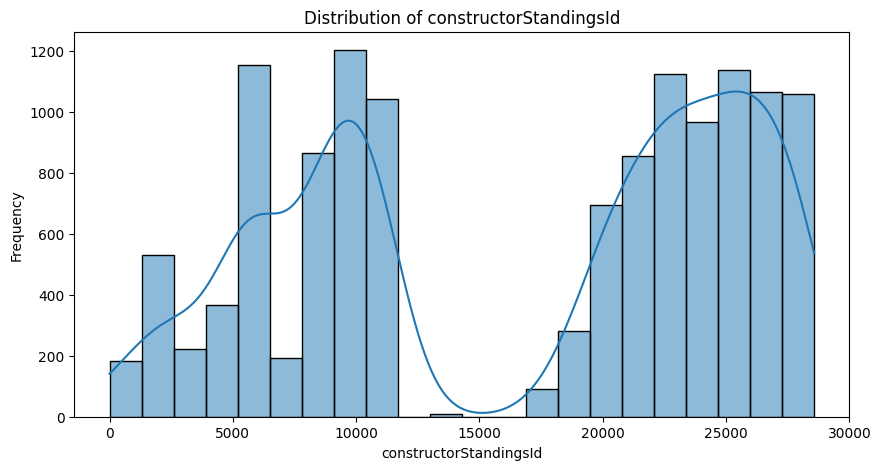



Outlier Analysis


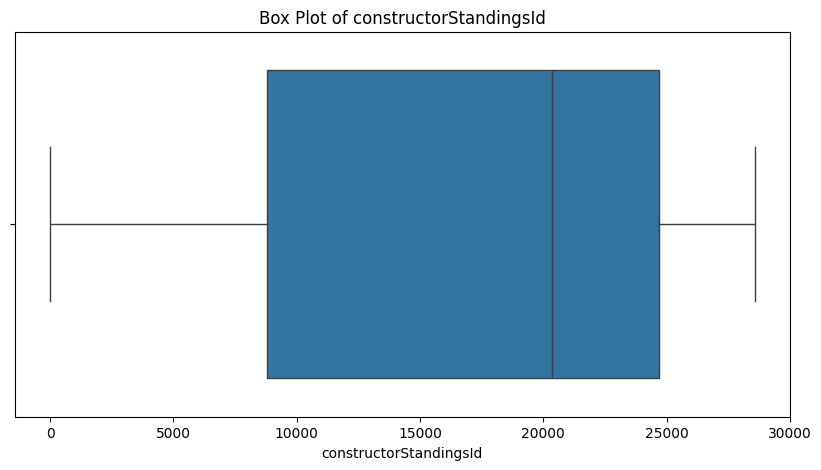



Outliers in constructorStandingsId identified using IQR method:
Empty DataFrame
Columns: [constructorStandingsId, raceId, constructorId, points, position, positionText, wins]
Index: []





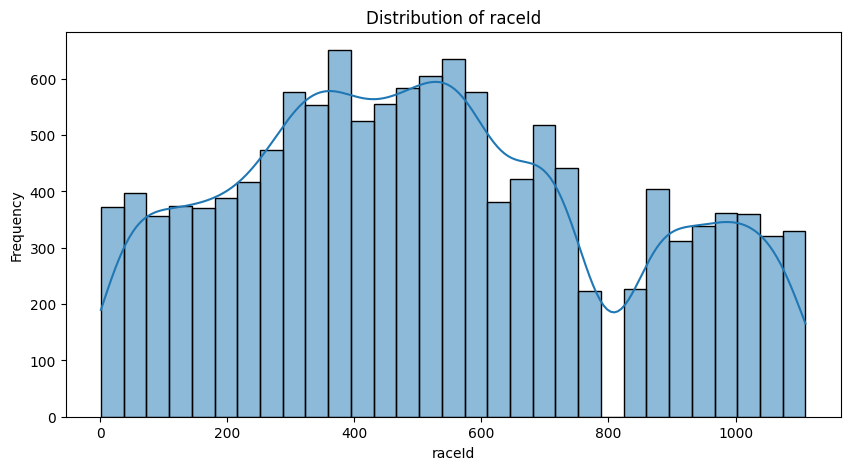



Outlier Analysis


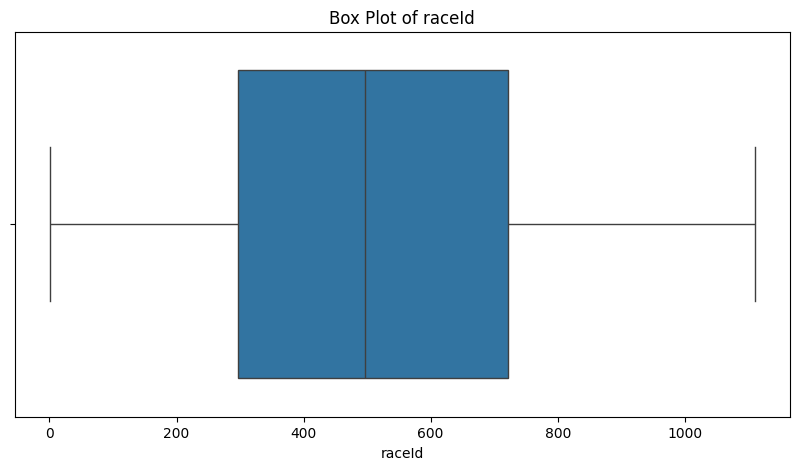



Outliers in raceId identified using IQR method:
Empty DataFrame
Columns: [constructorStandingsId, raceId, constructorId, points, position, positionText, wins]
Index: []





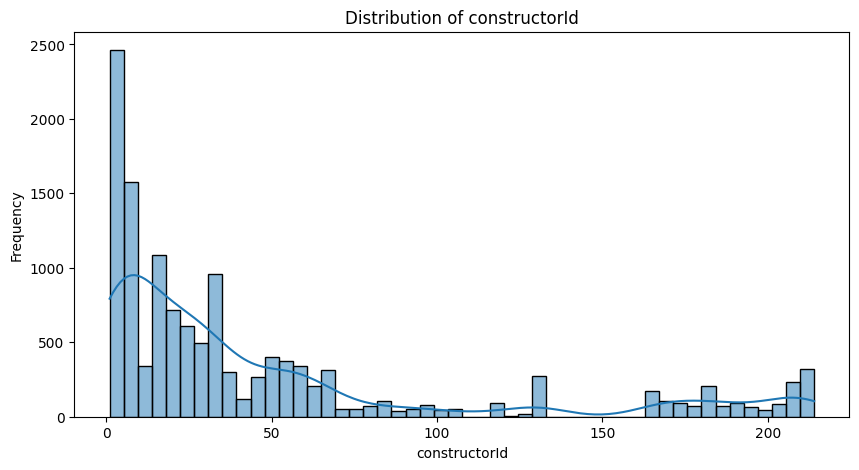



Outlier Analysis


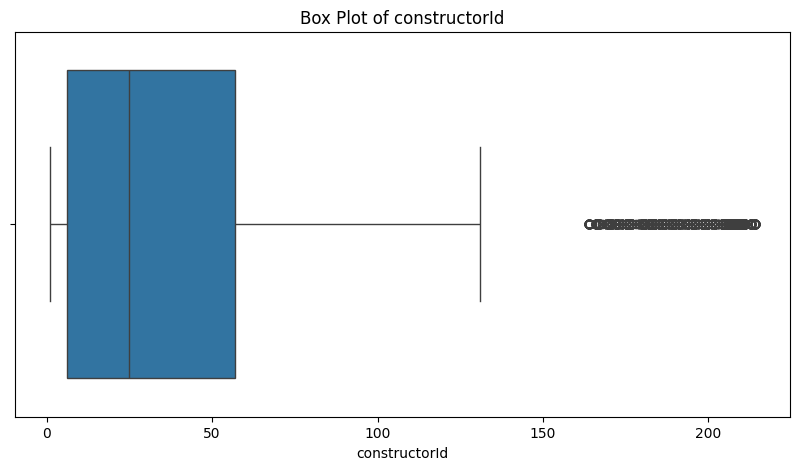



Outliers in constructorId identified using IQR method:
       constructorStandingsId  raceId  constructorId  points  position  \
6498                    24011     514            204     1.0         6   
6510                    24026     515            204     1.0         7   
6522                    24041     516            204     1.0         7   
6537                    24057     517            204     1.0         8   
6552                    24074     518            204     1.0         8   
...                       ...     ...            ...     ...       ...   
13038                   28560    1109            213     2.0        10   
13039                   28561    1109            210    11.0         8   
13046                   28568    1110            214    57.0         6   
13048                   28570    1110            213     3.0        10   
13049                   28571    1110            210    11.0         8   

      positionText  wins  
6498             6     0  


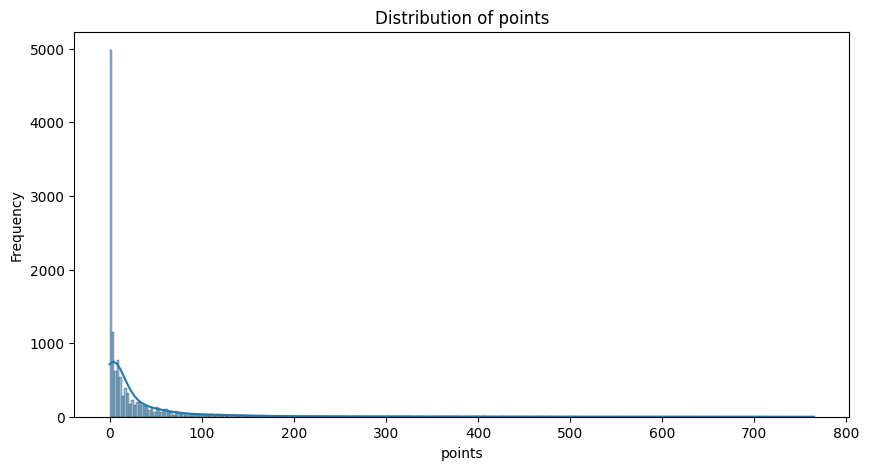



Outlier Analysis


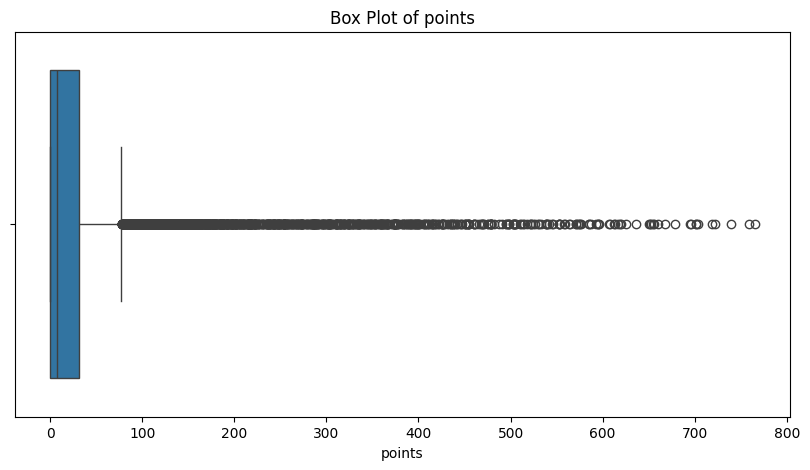



Outliers in points identified using IQR method:
       constructorStandingsId  raceId  constructorId  points  position  \
77                         78      25              6    91.0         1   
84                         85      26              2    82.0         2   
88                         89      26              6    96.0         1   
94                         95      27              1    86.0         3   
95                         96      27              2    89.0         2   
...                       ...     ...            ...     ...       ...   
13041                   28563    1110              9   503.0         1   
13042                   28564    1110            117   196.0         3   
13043                   28565    1110              6   191.0         4   
13044                   28566    1110            131   247.0         2   
13050                   28572    1110              1   103.0         5   

      positionText  wins  
77               1     5  
84     

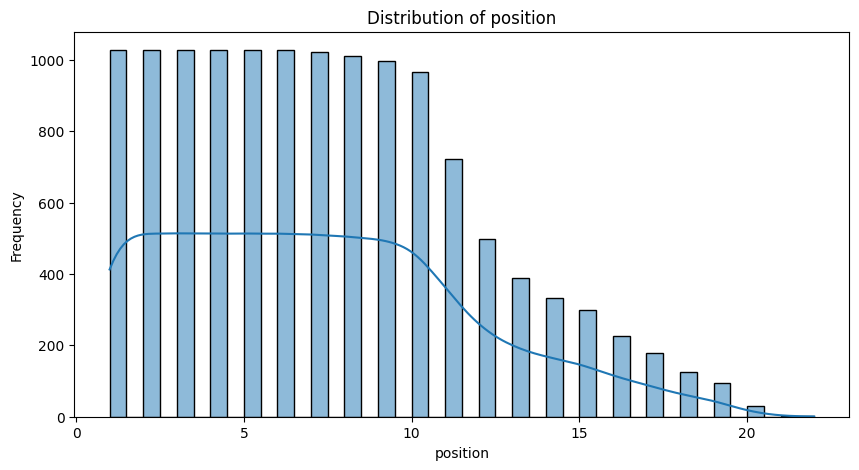



Outlier Analysis


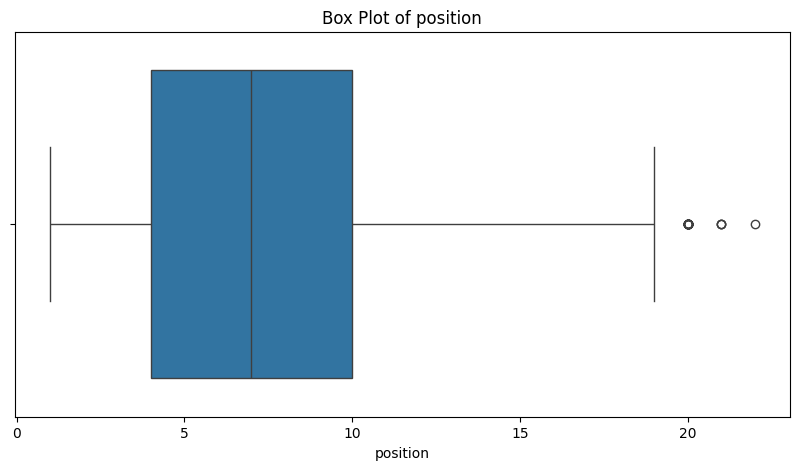



Outliers in position identified using IQR method:
       constructorStandingsId  raceId  constructorId  points  position  \
3957                     8791     356             46     0.0        20   
3977                     8811     357             46     0.0        20   
3997                     8831     358             46     0.0        20   
4014                     8848     359             44     0.0        20   
4034                     8868     360             44     0.0        20   
4054                     8888     361             44     0.0        20   
4074                     8908     362             44     0.0        20   
4094                     8928     363             44     0.0        20   
4114                     8948     364             44     0.0        20   
4134                     8968     365             44     0.0        20   
4154                     8988     366             44     0.0        20   
4174                     9008     367             44     0.0

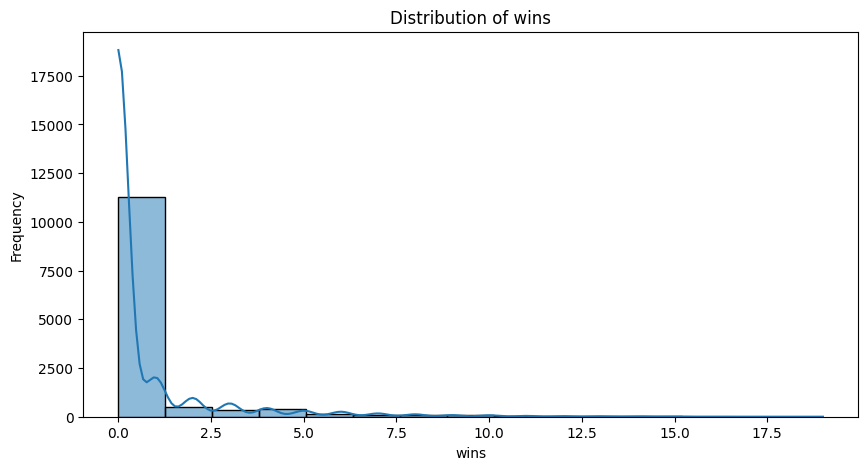



Outlier Analysis


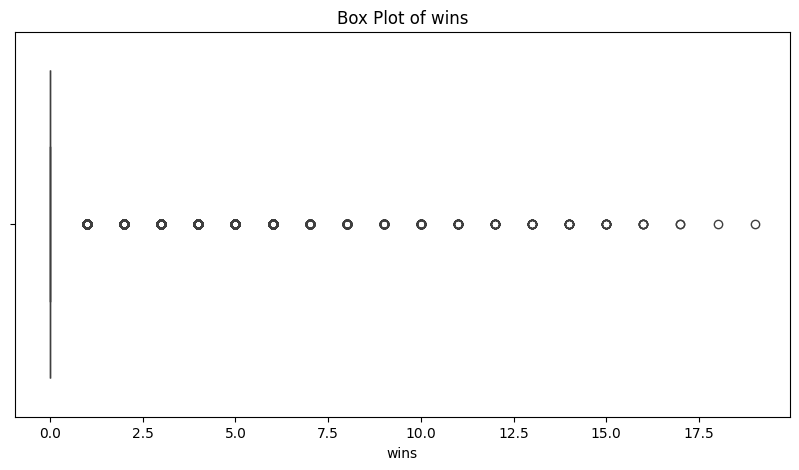



Outliers in wins identified using IQR method:
       constructorStandingsId  raceId  constructorId  points  position  \
0                           1      18              1    14.0         1   
6                           7      19              1    24.0         1   
11                         12      19              6    11.0         3   
17                         18      20              1    28.0         3   
22                         23      20              6    29.0         2   
...                       ...     ...            ...     ...       ...   
13010                   28513    1106              9   321.0         1   
13018                   28533    1107              9   377.0         1   
13021                   28543    1108              9   411.0         1   
13031                   28553    1109              9   452.0         1   
13041                   28563    1110              9   503.0         1   

      positionText  wins  
0                1     1  
6        

In [ ]:
print('Visualizations:')

#Categorical features
print('Categorical Features')
cat_columns = constructor_standings_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=constructor_standings_df[col], order=constructor_standings_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = constructor_standings_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(constructor_standings_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

# Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=constructor_standings_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = constructor_standings_df[col].quantile(0.25)
    Q3 = constructor_standings_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = constructor_standings_df[(constructor_standings_df[col] < Q1 - 1.5 * IQR) | (constructor_standings_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

###Correlation Matrix Visualization

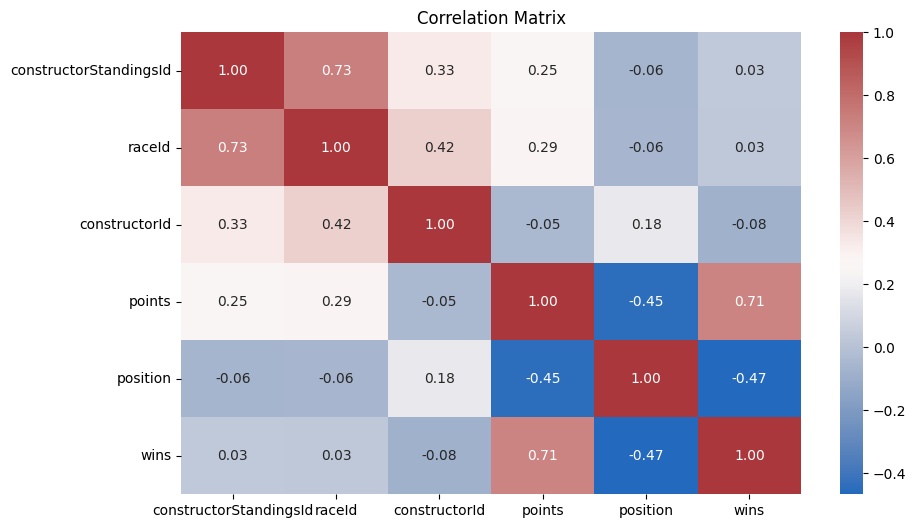

In [ ]:
num_columns = constructor_standings_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = constructor_standings_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Constructor Results Datasets**

###Data Structure Inspection

In [ ]:
print('\nData Dimensions:')
print(constructor_results_df.shape)

print('\n-dataset Columns:\n')
print(constructor_results_df.columns)

print('\n-First few rows:')
print(constructor_results_df.head(4))

print('\n-Basic Information:\n')
constructor_results_df.info()

# Check for missing values
print('\nMissing values:')
print(constructor_results_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(constructor_results_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(constructor_results_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(constructor_results_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(constructor_results_df.duplicated().sum())


Data Dimensions:
(12290, 5)

-dataset Columns:

Index(['constructorResultsId', 'raceId', 'constructorId', 'points', 'status'], dtype='object')

-First few rows:
   constructorResultsId  raceId  constructorId  points status
0                     1      18              1    14.0     \N
1                     2      18              2     8.0     \N
2                     3      18              3     9.0     \N
3                     4      18              4     5.0     \N

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12290 entries, 0 to 12289
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   constructorResultsId  12290 non-null  int64  
 1   raceId                12290 non-null  int64  
 2   constructorId         12290 non-null  int64  
 3   points                12290 non-null  float64
 4   status                12290 non-null  object 
dtypes: float64(1), int64(3), object(1)
m

###Summary statistics

In [ ]:
print('Summary Statistics:\n')
constructor_results_df.describe(include='all')

Summary Statistics:



,constructorResultsId,raceId,constructorId,points,status
count,12290.000000,12290.000000,12290.000000,12290.000000,12290
unique,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,\N
freq,NaN,NaN,NaN,NaN,12273
mean,8191.007242,511.762815,44.661676,3.859967,NaN
std,5561.388146,302.677952,57.851043,7.555135,NaN
min,1.000000,1.000000,1.000000,0.000000,NaN
25%,3073.250000,281.000000,6.000000,0.000000,NaN
50%,6145.500000,477.000000,22.000000,0.000000,NaN
75%,13698.750000,722.000000,53.000000,4.000000,NaN


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


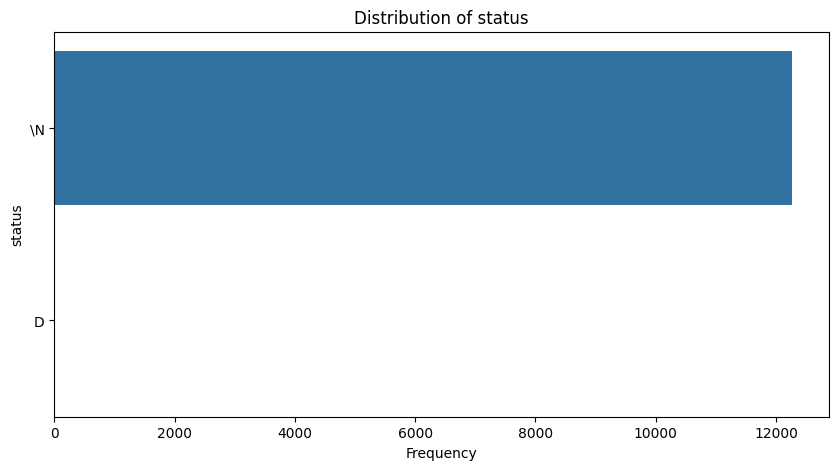





Numerical Feature


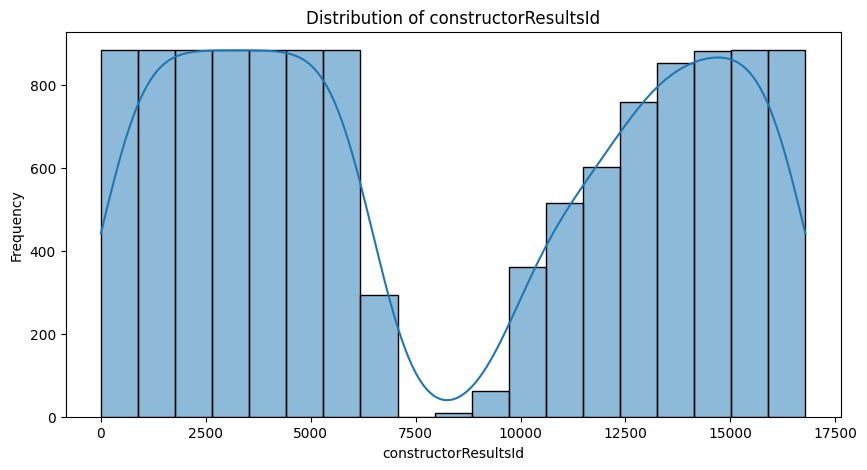

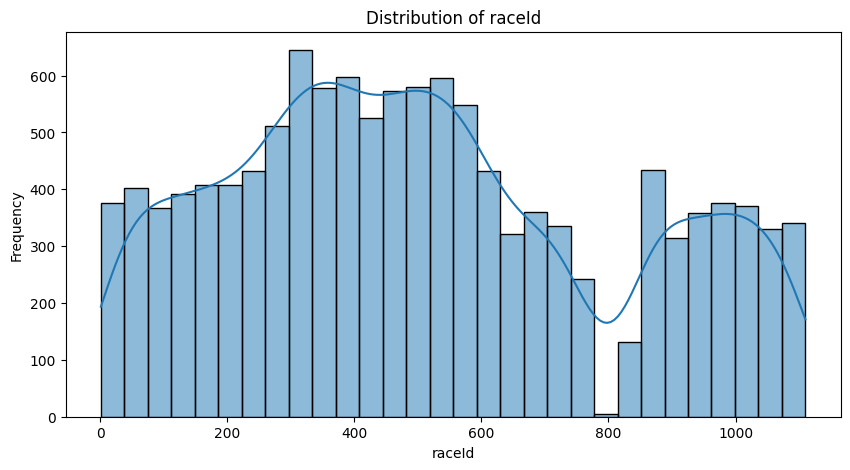

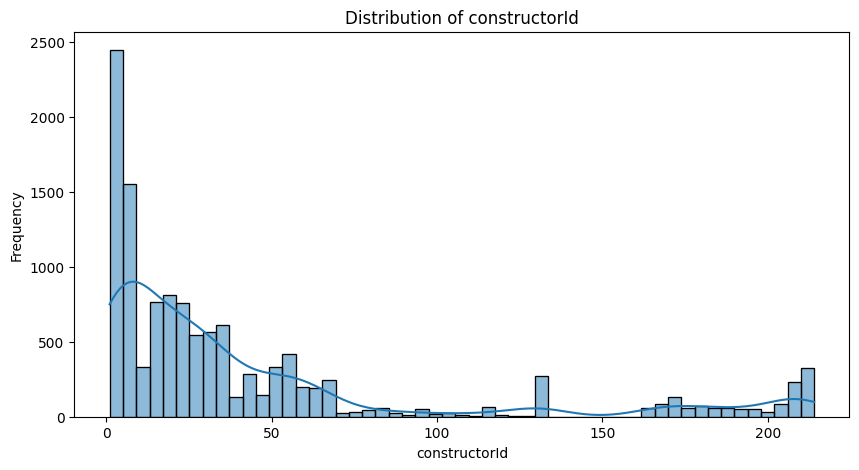

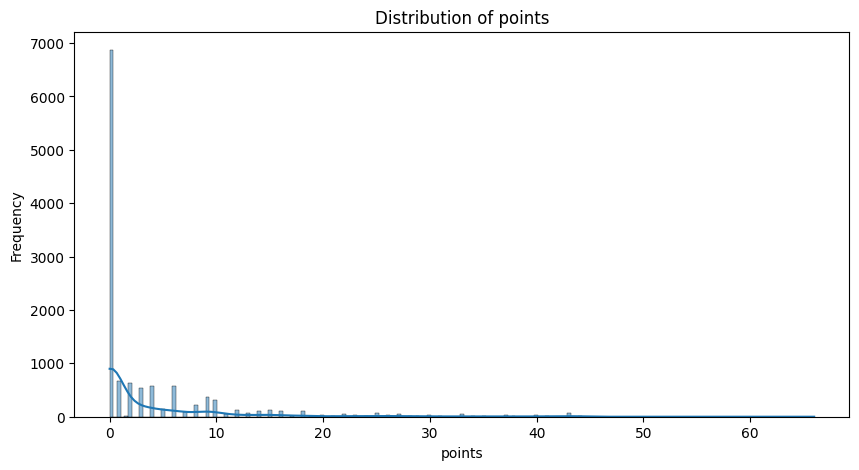

In [ ]:
print('Visualizations:')

#Categorical features
print('Categorical Features')
cat_columns = constructor_results_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=constructor_results_df[col], order=constructor_results_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = constructor_results_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(constructor_results_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

###Correlation Matrix Visualization

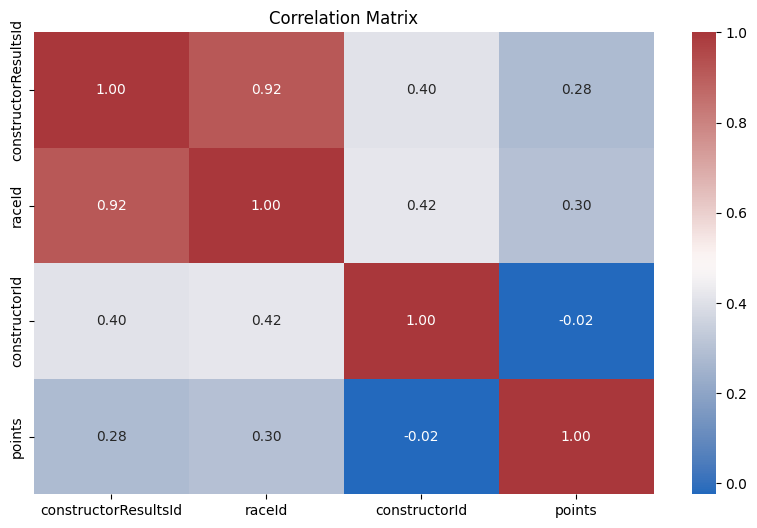

In [ ]:
#Create a correlation matrix visualization
num_columns = constructor_results_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = constructor_results_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Lap Times**

###Data Structure Inspection

In [ ]:
print('\nData Dimensions:')
print(lap_times_df.shape)

print('\n-dataset Columns:\n')
print(lap_times_df.columns)

print('\n-First few rows:')
print(lap_times_df.head(4))

print('\n-Basic Information:\n')
lap_times_df.info()

# Check for missing values
print('\nMissing values:')
print(lap_times_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(lap_times_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(lap_times_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(lap_times_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(lap_times_df.duplicated().sum())


Data Dimensions:
(551742, 6)

-dataset Columns:

Index(['raceId', 'driverId', 'lap', 'position', 'time', 'milliseconds'], dtype='object')

-First few rows:
   raceId  driverId  lap  position      time  milliseconds
0     841        20    1         1  1:38.109         98109
1     841        20    2         1  1:33.006         93006
2     841        20    3         1  1:32.713         92713
3     841        20    4         1  1:32.803         92803

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551742 entries, 0 to 551741
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   raceId        551742 non-null  int64 
 1   driverId      551742 non-null  int64 
 2   lap           551742 non-null  int64 
 3   position      551742 non-null  int64 
 4   time          551742 non-null  object
 5   milliseconds  551742 non-null  int64 
dtypes: int64(5), object(1)
memory usage: 25.3+ MB

Missing values:
race

###Summary statistics

In [ ]:
print('Summary Statistics:\n')
lap_times_df.describe(include='all')

Summary Statistics:



,raceId,driverId,lap,position,time,milliseconds
count,551742.000000,551742.000000,551742.000000,551742.000000,551742,5.517420e+05
unique,NaN,NaN,NaN,NaN,74802,NaN
top,NaN,NaN,NaN,NaN,1:21.571,NaN
freq,NaN,NaN,NaN,NaN,43,NaN
mean,564.878467,296.918785,29.990193,9.658699,NaN,9.570621e+04
std,425.883069,377.935897,18.420399,5.538011,NaN,7.478605e+04
min,1.000000,1.000000,1.000000,1.000000,NaN,5.540400e+04
25%,131.000000,15.000000,14.000000,5.000000,NaN,8.199300e+04
50%,846.000000,39.000000,29.000000,9.000000,NaN,9.067300e+04
75%,976.000000,817.000000,44.000000,14.000000,NaN,1.022430e+05


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


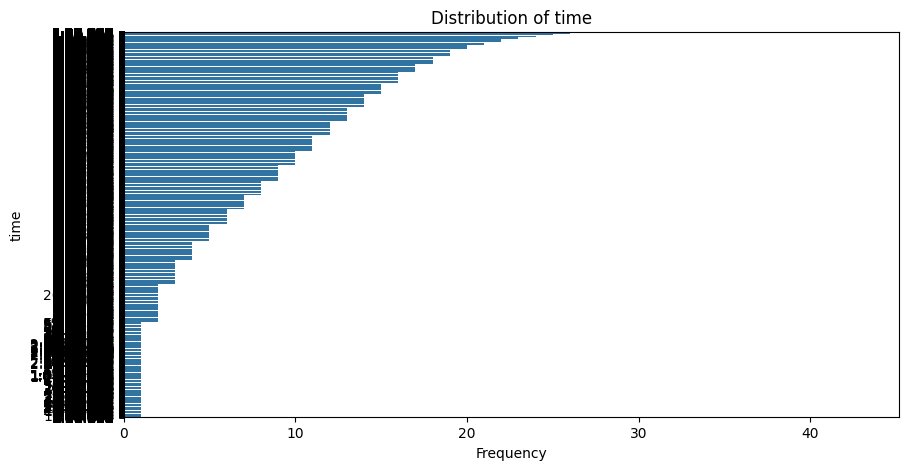





Numerical Feature


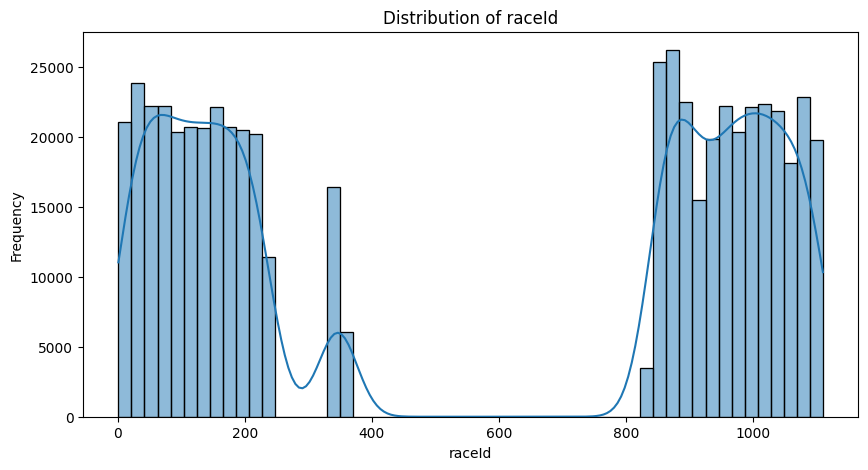



Outlier Analysis


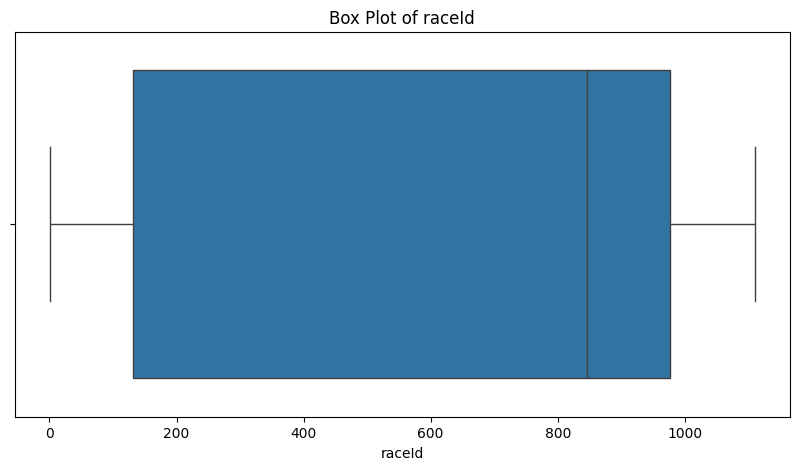



Outliers in raceId identified using IQR method:
Empty DataFrame
Columns: [raceId, driverId, lap, position, time, milliseconds]
Index: []





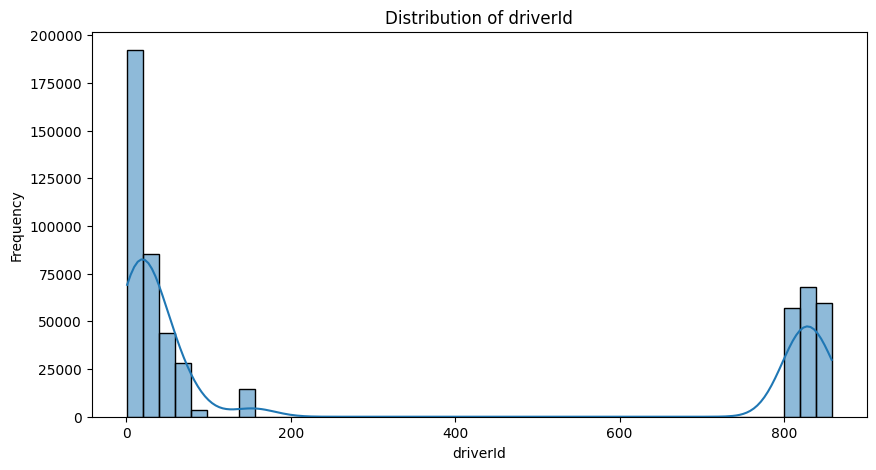



Outlier Analysis


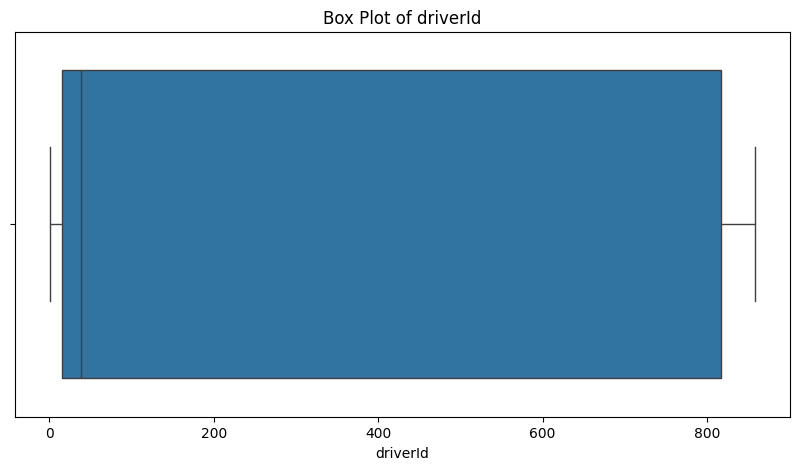



Outliers in driverId identified using IQR method:
Empty DataFrame
Columns: [raceId, driverId, lap, position, time, milliseconds]
Index: []





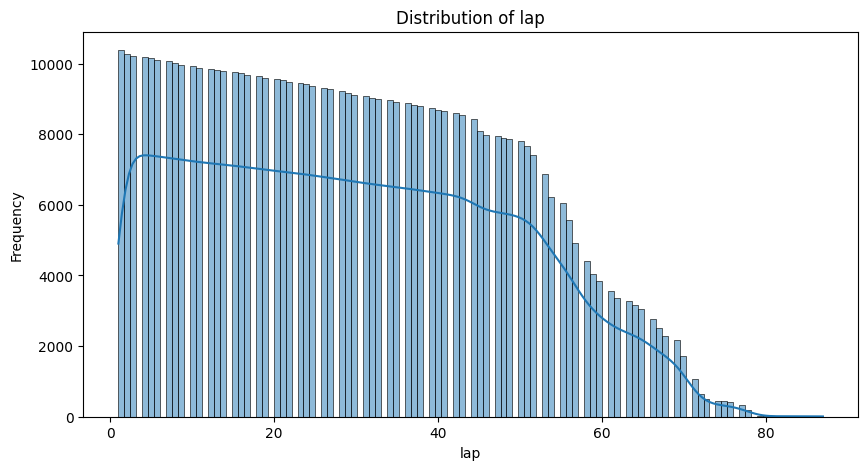



Outlier Analysis


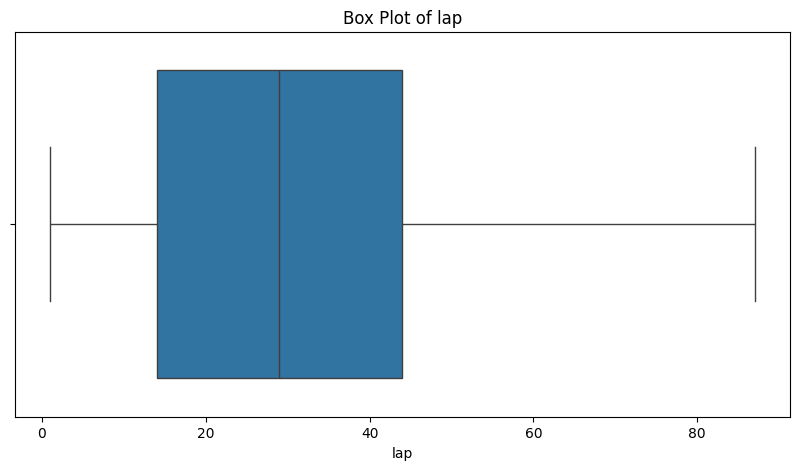



Outliers in lap identified using IQR method:
Empty DataFrame
Columns: [raceId, driverId, lap, position, time, milliseconds]
Index: []





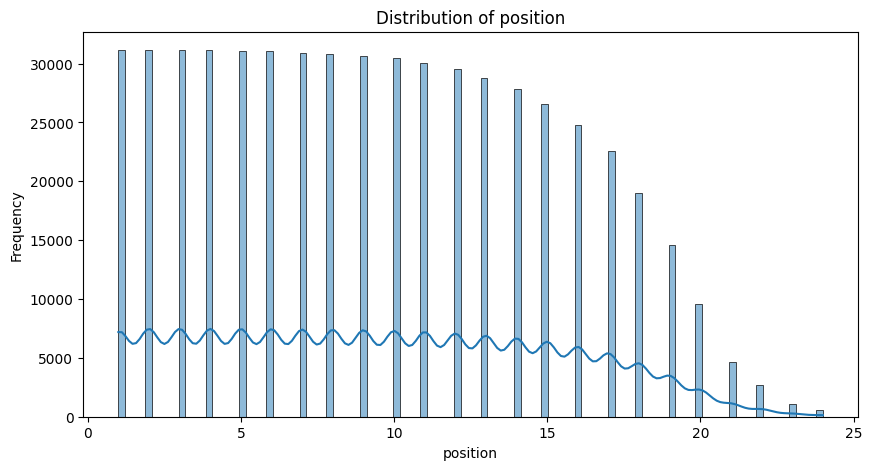



Outlier Analysis


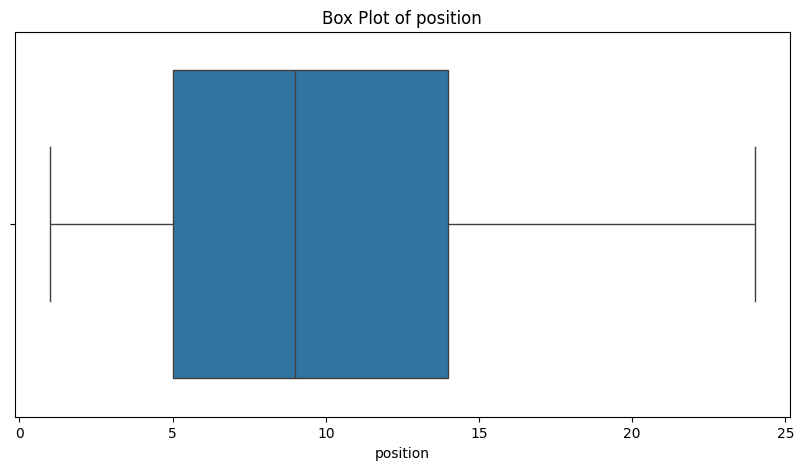



Outliers in position identified using IQR method:
Empty DataFrame
Columns: [raceId, driverId, lap, position, time, milliseconds]
Index: []





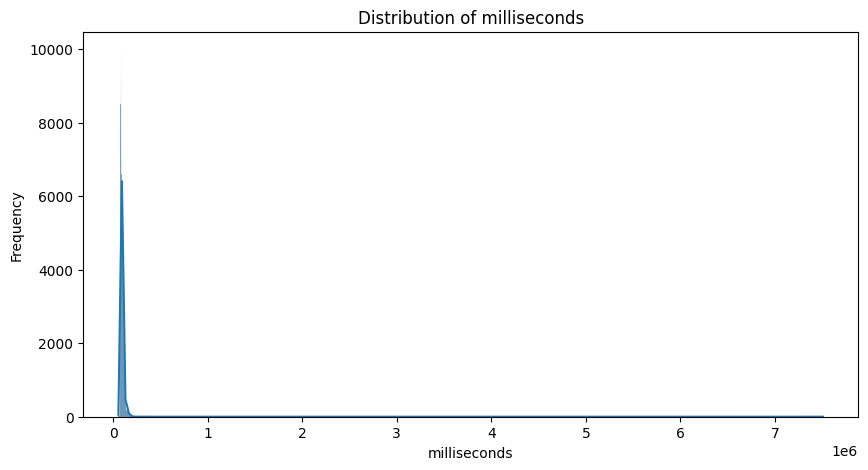



Outlier Analysis


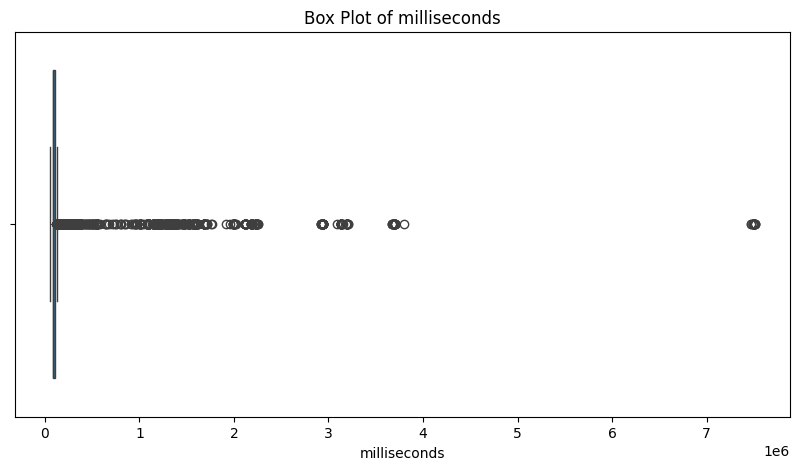



Outliers in milliseconds identified using IQR method:
        raceId  driverId  lap  position       time  milliseconds
928        841        10   19        21  11:48.170        708170
981        841        22   23        15   2:24.606        144606
1007       841       153    1        21   2:13.879        133879
1064       841        30    1        22   2:41.428        161428
1862       842        22    3        24   2:51.696        171696
...        ...       ...  ...       ...        ...           ...
549576    1108       822   37        14   2:25.027        145027
549625    1108       855   34        17   2:22.914        142914
549627    1108       855   36        15   2:20.527        140527
549628    1108       855   37        18   2:28.721        148721
551278    1110       840   21        18   2:13.650        133650

[16096 rows x 6 columns]







In [ ]:
print('Visualizations:')

#Categorical features
print('Categorical Features')
cat_columns = lap_times_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=lap_times_df[col], order=lap_times_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = lap_times_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(lap_times_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

# Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=lap_times_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = lap_times_df[col].quantile(0.25)
    Q3 = lap_times_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = lap_times_df[(lap_times_df[col] < Q1 - 1.5 * IQR) | (lap_times_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

###Correlation Matrix Visualization

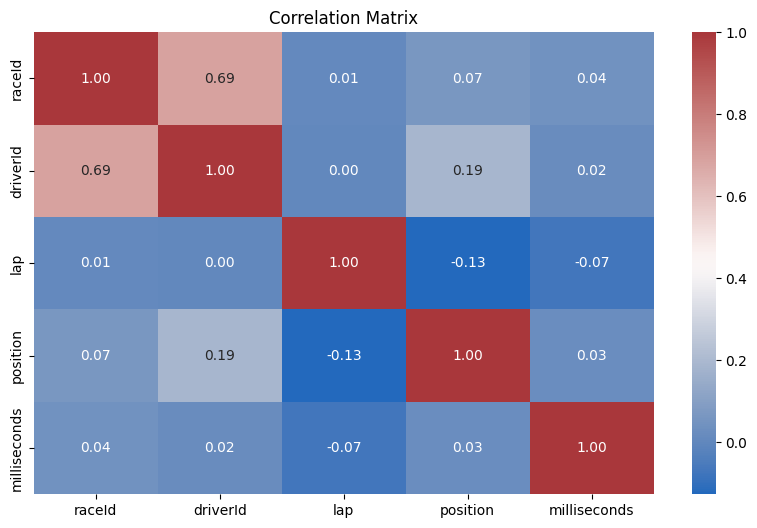

In [ ]:
#Create a correlation matrix visualization
num_columns = lap_times_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = lap_times_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Sprint Results Dataset**

###Data Structure Inspection

In [ ]:

print('\nData Dimensions:')
print(sprint_results_df.shape)

print('\n-dataset Columns:\n')
print(sprint_results_df.columns)

print('\n-First few rows:')
print(sprint_results_df.head(4))

print('\n-Basic Information:\n')
sprint_results_df.info()

# Check for missing values
print('\nMissing values:')
print(sprint_results_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(sprint_results_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(sprint_results_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(sprint_results_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(sprint_results_df.duplicated().sum())


Data Dimensions:
(180, 16)

-dataset Columns:

Index(['resultId', 'raceId', 'driverId', 'constructorId', 'number', 'grid',
       'position', 'positionText', 'positionOrder', 'points', 'laps', 'time',
       'milliseconds', 'fastestLap', 'fastestLapTime', 'statusId'],
      dtype='object')

-First few rows:
   resultId  raceId  driverId  constructorId  number  grid position  \
0         1    1061       830              9      33     2        1   
1         2    1061         1            131      44     1        2   
2         3    1061       822            131      77     3        3   
3         4    1061       844              6      16     4        4   

  positionText  positionOrder  points  laps       time milliseconds  \
0            1              1       3    17  25:38.426      1538426   
1            2              2       2    17     +1.430      1539856   
2            3              3       1    17     +7.502      1545928   
3            4              4       0    17    +11

###Summary statistics

In [ ]:
print('Summary Statistics:\n')
sprint_results_df.describe(include='all')

Summary Statistics:



,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,fastestLapTime,statusId
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180,180,180.000000,180.000000,180.000000,180,180,180,180,180.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,21,23,NaN,NaN,NaN,171,171,24,175,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,\N,\N,4,\N,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,9,9,NaN,NaN,NaN,10,10,23,6,NaN
mean,90.500000,1085.666667,714.088889,95.500000,27.550000,10.100000,NaN,NaN,10.500000,1.300000,19.216667,NaN,NaN,NaN,NaN,3.983333
std,52.105662,17.362388,298.112841,88.359632,24.273874,5.861626,NaN,NaN,5.782366,2.318013,5.469341,NaN,NaN,NaN,NaN,17.662091
min,1.000000,1061.000000,1.000000,1.000000,1.000000,0.000000,NaN,NaN,1.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,1.000000
25%,45.750000,1071.000000,817.000000,6.000000,10.000000,5.000000,NaN,NaN,5.750000,0.000000,17.000000,NaN,NaN,NaN,NaN,1.000000
50%,90.500000,1084.000000,840.000000,84.000000,20.000000,10.000000,NaN,NaN,10.500000,0.000000,21.000000,NaN,NaN,NaN,NaN,1.000000
75%,135.250000,1101.000000,847.000000,210.000000,44.000000,15.000000,NaN,NaN,15.250000,2.000000,24.000000,NaN,NaN,NaN,NaN,1.000000


###Visualization: Categorical and Numerical Features

Visualizations:
Categorical Features


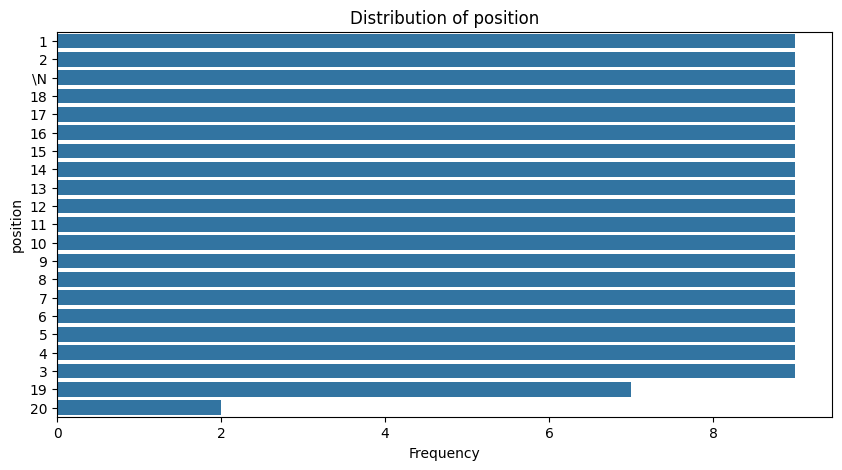

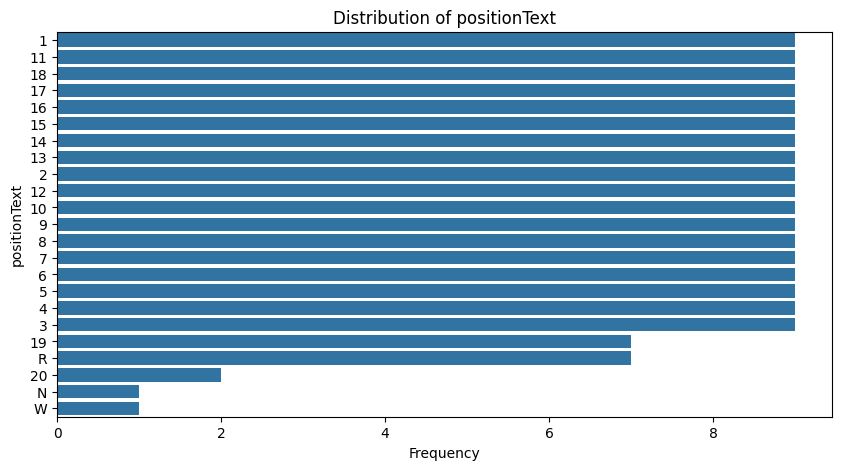

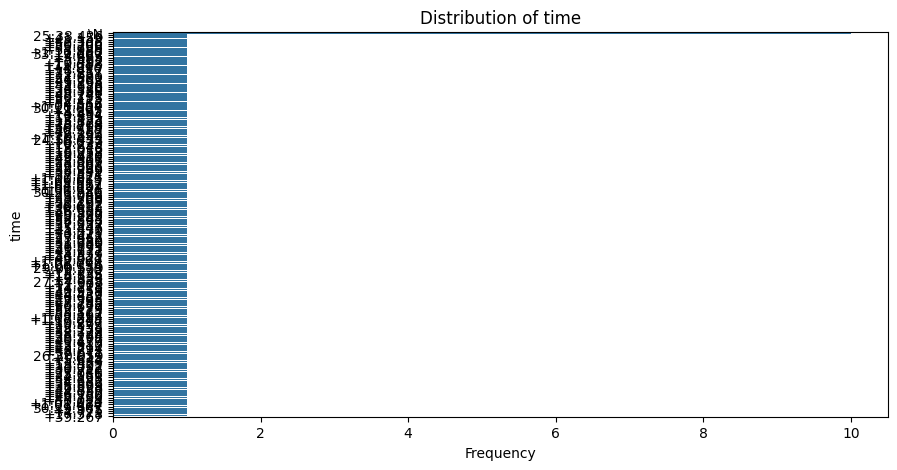

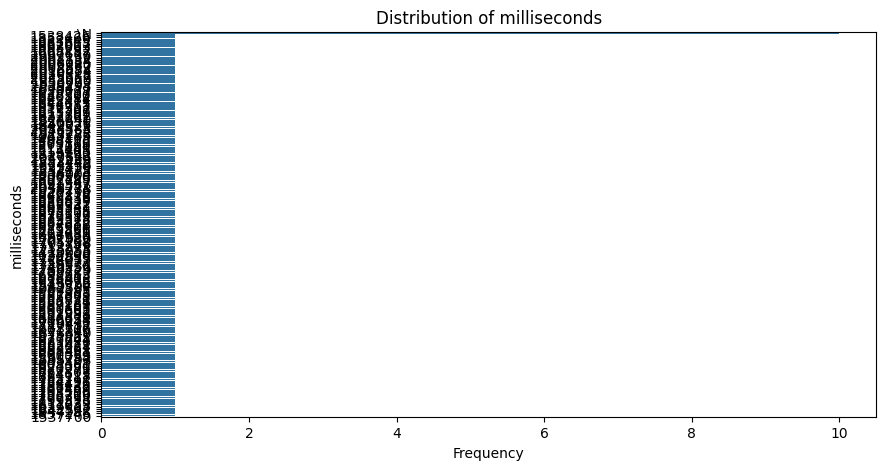

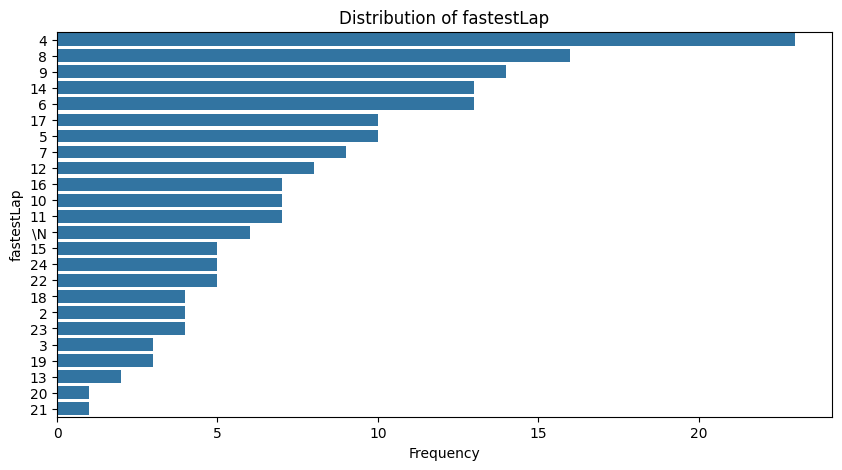

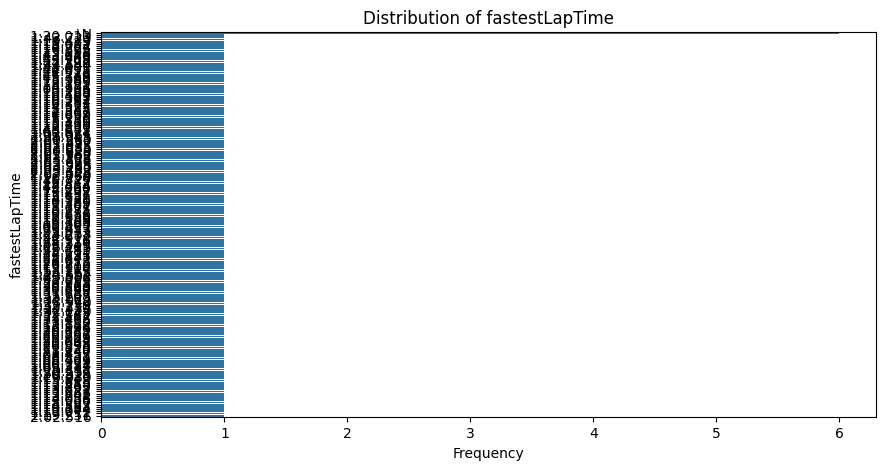





Numerical Feature


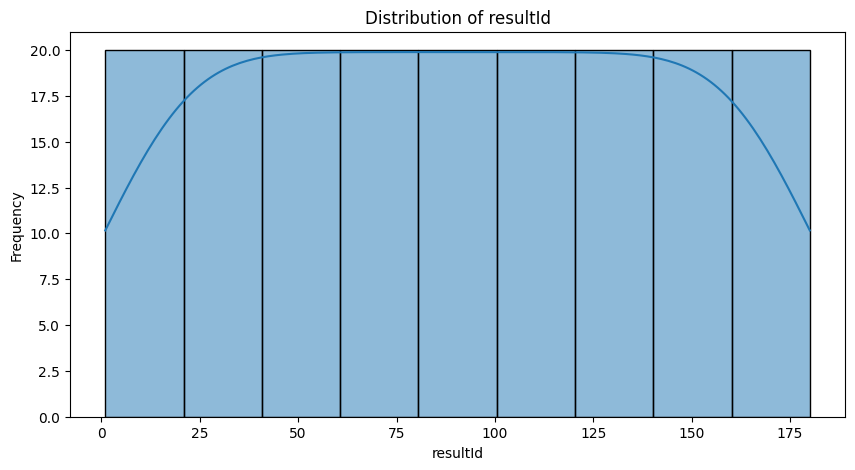



Outlier Analysis


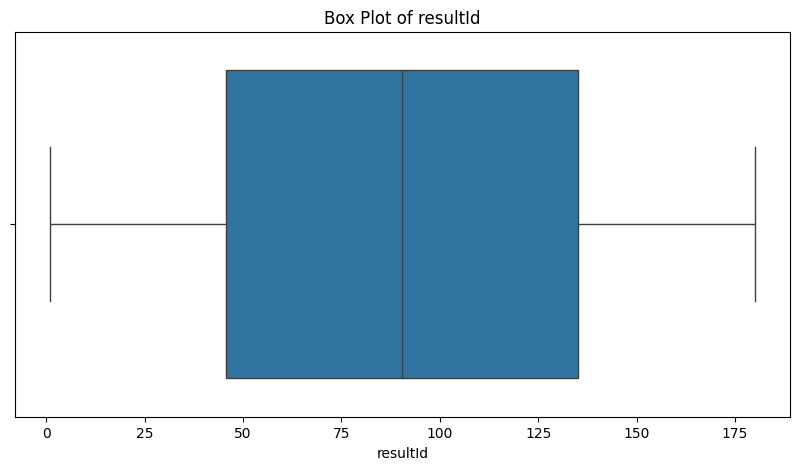



Outliers in resultId identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, fastestLapTime, statusId]
Index: []





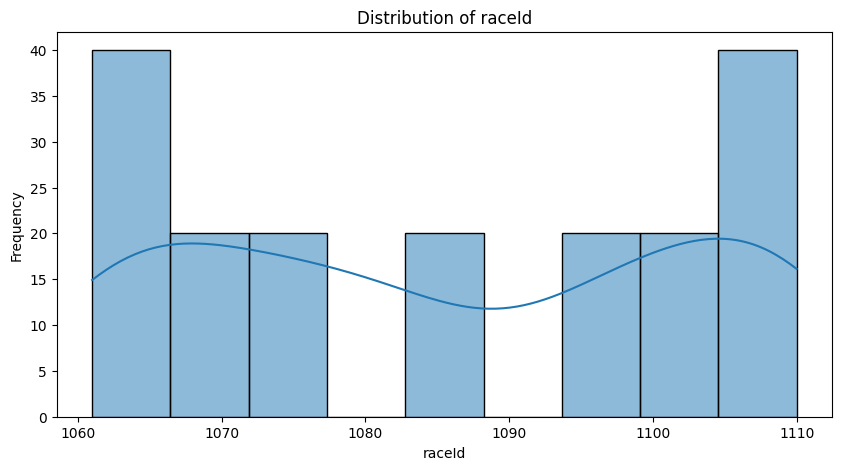



Outlier Analysis


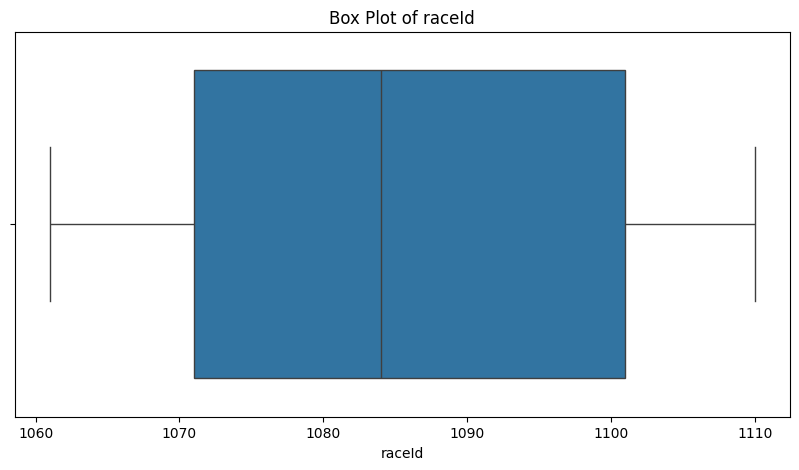



Outliers in raceId identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, fastestLapTime, statusId]
Index: []





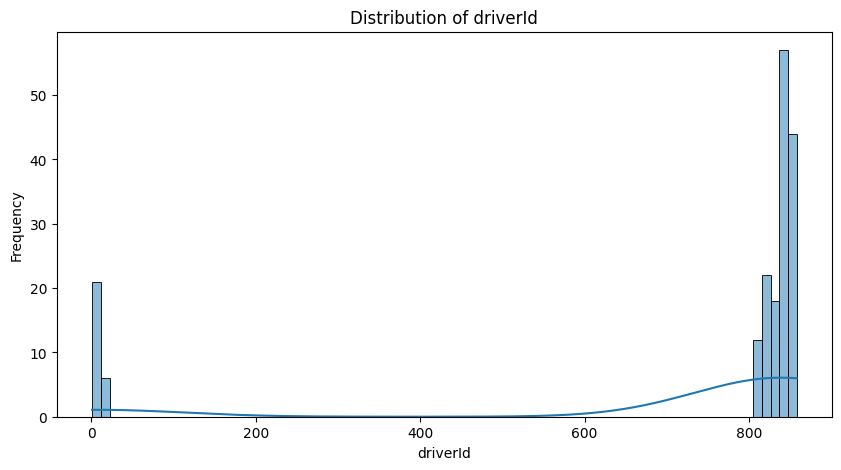



Outlier Analysis


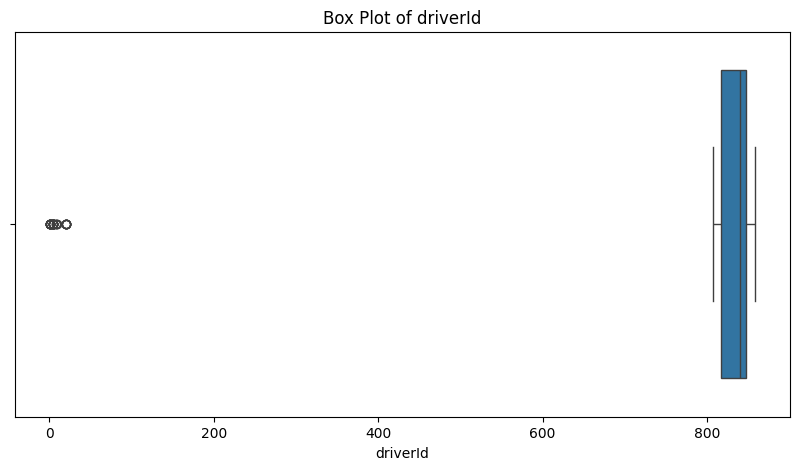



Outliers in driverId identified using IQR method:
     resultId  raceId  driverId  constructorId  number  grid position  \
1           2    1061         1            131      44     1        2   
6           7    1061         4            214      14    11        7   
7           8    1061        20            117       5    10        8   
12         13    1061         8             51       7    17       13   
24         25    1065         1            131      44     2        5   
30         31    1065         4            214      14    13       11   
31         32    1065        20            117       5    11       12   
37         38    1065         9             51      88    19       18   
44         45    1071         1            131      44    20        5   
49         50    1071        20            117       5    11       10   
51         52    1071         4            214      14     9       12   
57         58    1071         8             51       7    13       18   

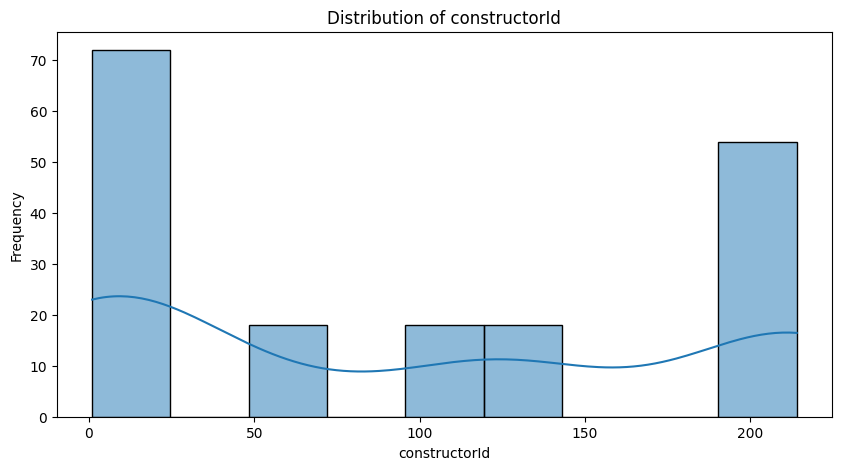



Outlier Analysis


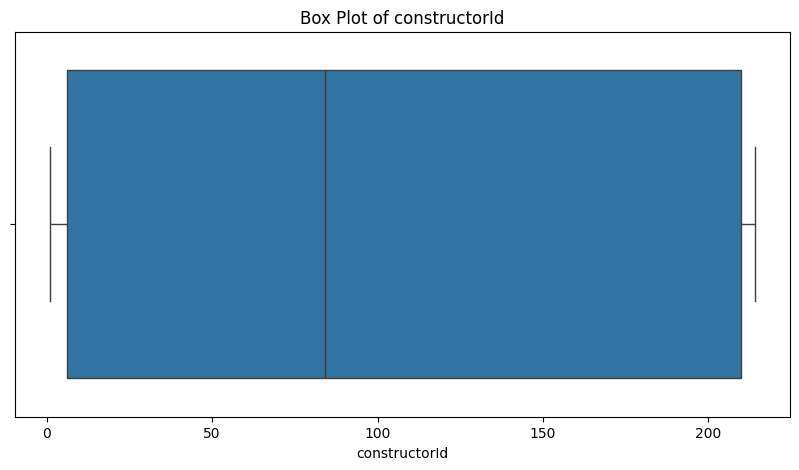



Outliers in constructorId identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, fastestLapTime, statusId]
Index: []





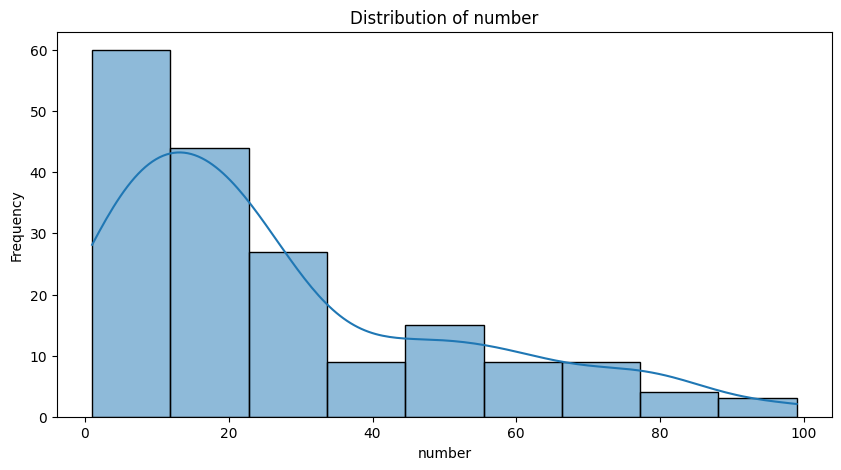



Outlier Analysis


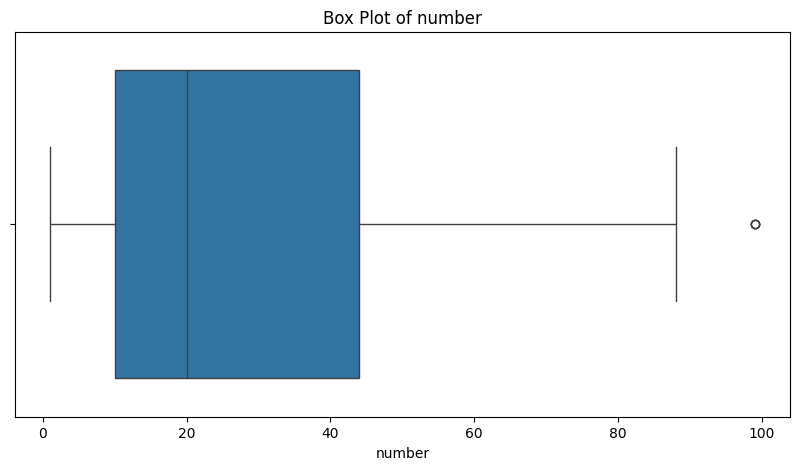



Outliers in number identified using IQR method:
    resultId  raceId  driverId  constructorId  number  grid position  \
14        15    1061       841             51      99    14       15   
27        28    1065       841             51      99    10        8   
52        53    1071       841             51      99    14       13   

   positionText  positionOrder  points  laps     time milliseconds fastestLap  \
14           15             15       0    17  +53.225      1591651         14   
27            8              8       0    18  +31.089      1705167         10   
52           13             13       0    24  +41.880      1791439         11   

   fastestLapTime  statusId  
14       1:32.457         1  
27       1:25.126         1  
52       1:13.627         1  





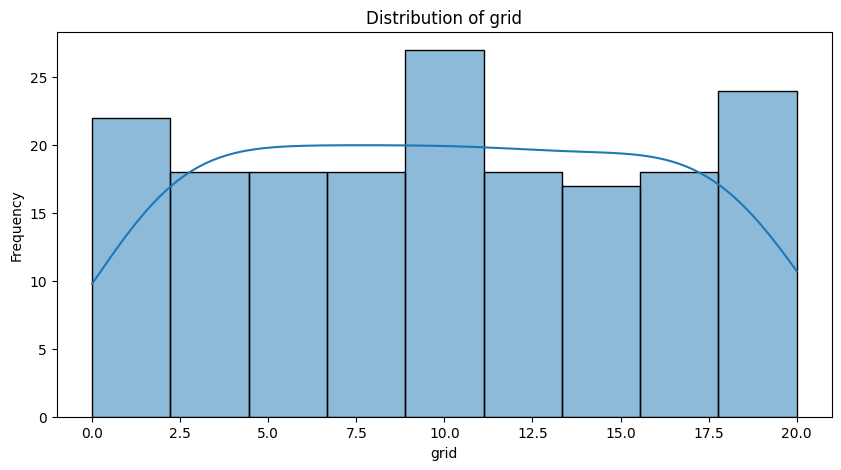



Outlier Analysis


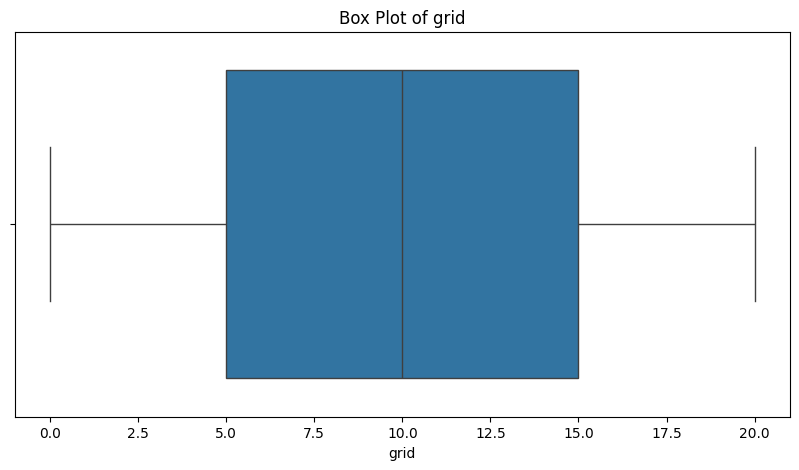



Outliers in grid identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, fastestLapTime, statusId]
Index: []





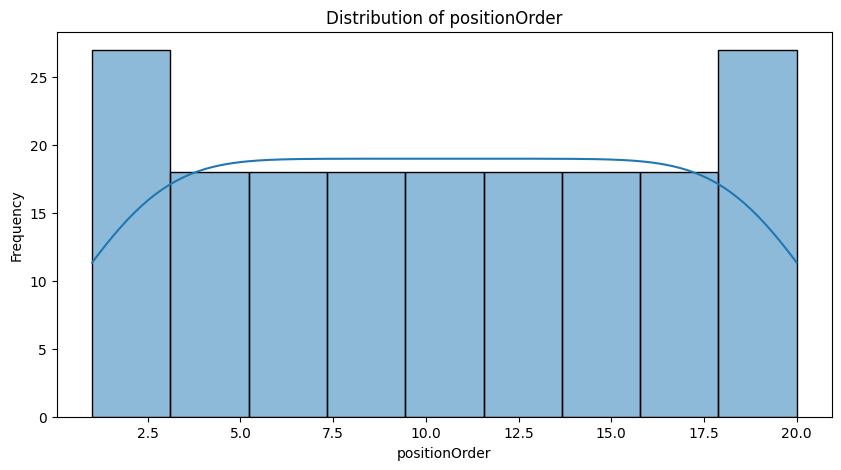



Outlier Analysis


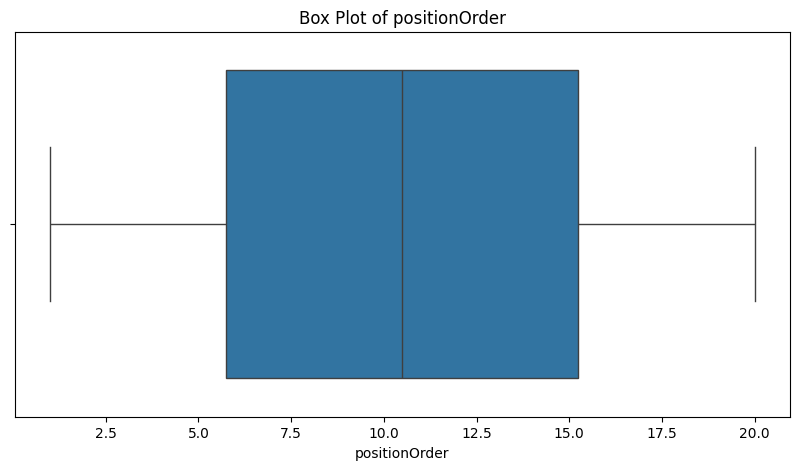



Outliers in positionOrder identified using IQR method:
Empty DataFrame
Columns: [resultId, raceId, driverId, constructorId, number, grid, position, positionText, positionOrder, points, laps, time, milliseconds, fastestLap, fastestLapTime, statusId]
Index: []





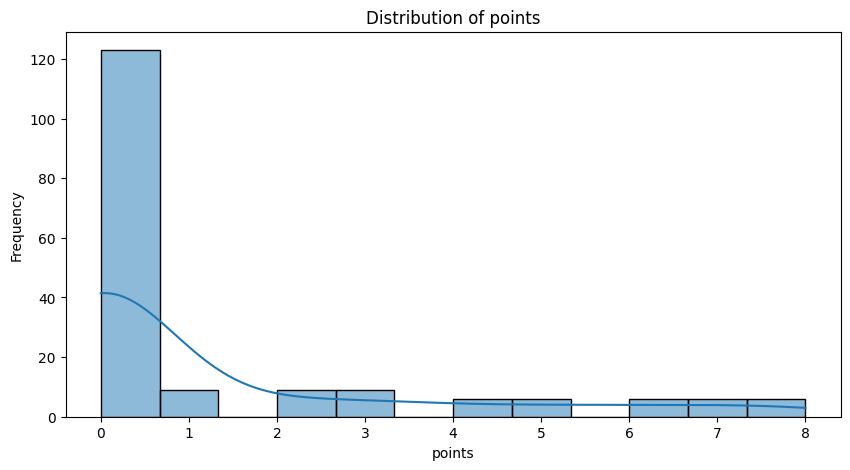



Outlier Analysis


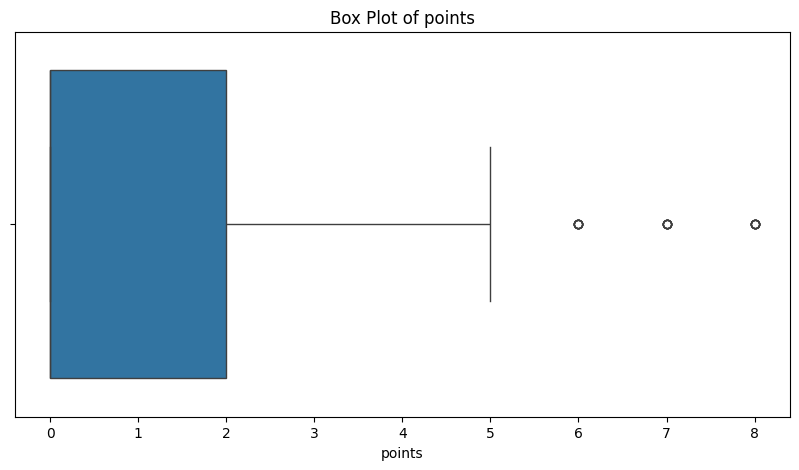



Outliers in points identified using IQR method:
     resultId  raceId  driverId  constructorId  number  grid position  \
60         61    1077       830              9       1     1        1   
61         62    1077       844              6      16     2        2   
62         63    1077       815              9      11     7        3   
80         81    1084       830              9       1     1        1   
81         82    1084       844              6      16     2        2   
82         83    1084       832              6      55     3        3   
100       101    1095       847            131      63     3        1   
101       102    1095       832              6      55     5        2   
102       103    1095         1            131      44     8        3   
120       121    1101       815              9      11     2        1   
121       122    1101       844              6      16     1        2   
122       123    1101       830              9       1     3        3   
1

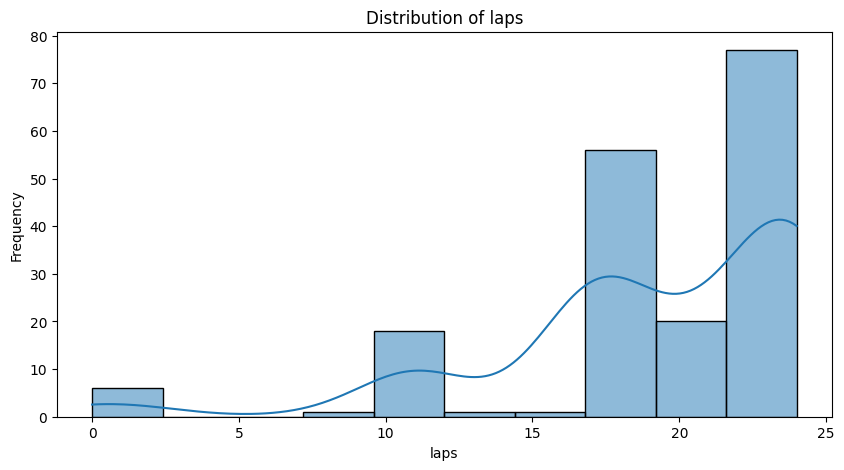



Outlier Analysis


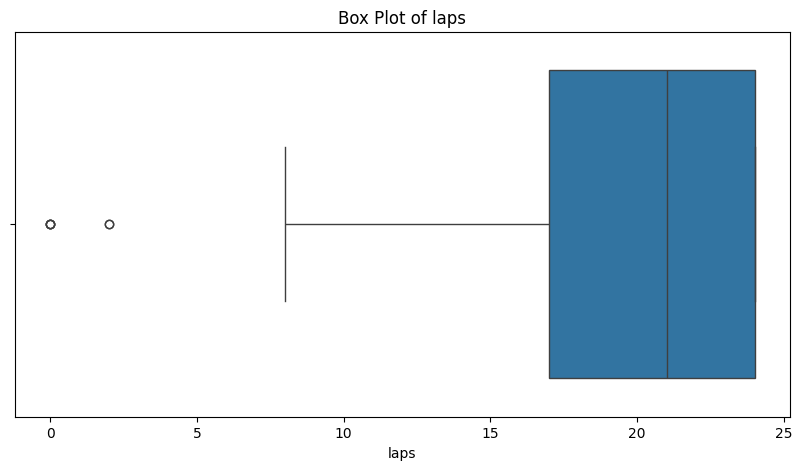



Outliers in laps identified using IQR method:
     resultId  raceId  driverId  constructorId  number  grid position  \
39         40    1065       842            213      10     6       \N   
79         80    1077       855             51      24     0       \N   
99        100    1084         4            214      14     8       \N   
138       139    1101       852            213      22    16       \N   
139       140    1101       858              3       2     0       \N   
179       180    1110         4            117      14    15       \N   

    positionText  positionOrder  points  laps time milliseconds fastestLap  \
39             R             20       0     0   \N           \N         \N   
79             R             20       0     0   \N           \N         \N   
99             N             20       0     0   \N           \N         \N   
138            R             19       0     2   \N           \N         \N   
139            W             20       0     0   \N

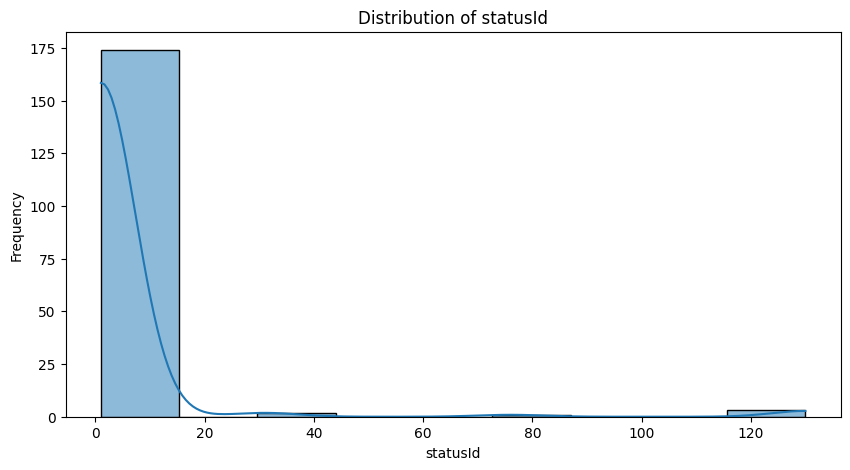



Outlier Analysis


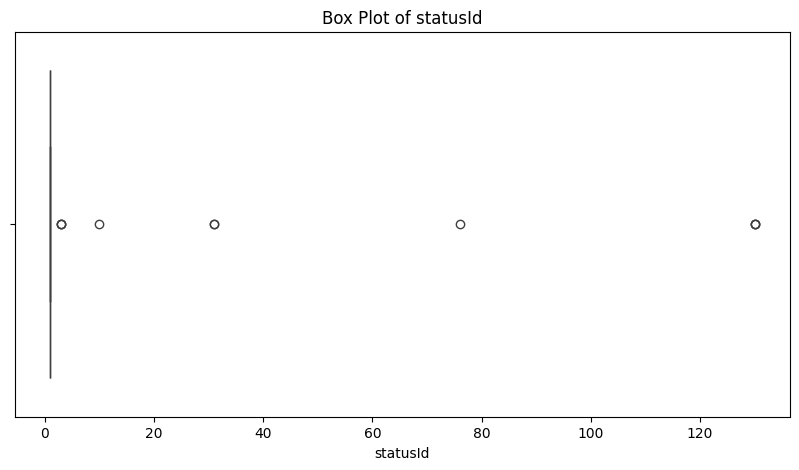



Outliers in statusId identified using IQR method:
     resultId  raceId  driverId  constructorId  number  grid position  \
19         20    1061       815              9      11     5       \N   
39         40    1065       842            213      10     6       \N   
79         80    1077       855             51      24     0       \N   
98         99    1084        20            117       5    20       19   
99        100    1084         4            214      14     8       \N   
119       120    1095       848              3      23    11       \N   
138       139    1101       852            213      22    16       \N   
139       140    1101       858              3       2     0       \N   
178       179    1110       815              9      11     8       \N   
179       180    1110         4            117      14    15       \N   

    positionText  positionOrder  points  laps time milliseconds fastestLap  \
19             R             20       0    16   \N           \N   

In [ ]:
print('Visualizations:')

#Categorical features
print('Categorical Features')
cat_columns = sprint_results_df.select_dtypes(include=['object']).columns
for col in cat_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=sprint_results_df[col], order=sprint_results_df[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

print("\n" + "="*80 + "\n")

# Numerical features
print('Numerical Feature')
num_columns = sprint_results_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(sprint_results_df [col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()
    print("\n")  # Add a space between graphs

# Outlier analysis using box plot
    print('Outlier Analysis')
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=sprint_results_df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()
    print("\n")  # Add a space between graphs

    # Outlier analysis using IQR
    Q1 = sprint_results_df[col].quantile(0.25)
    Q3 = sprint_results_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = sprint_results_df[(sprint_results_df[col] < Q1 - 1.5 * IQR) | (sprint_results_df[col] > Q3 + 1.5 * IQR)]
    print(f"Outliers in {col} identified using IQR method:\n{outliers}\n")
    print("\n")  # Add a space between graphs

# Add space after the last set of graphs
print("\n" + "="*80 + "\n")

###Correlation Matrix Visualization

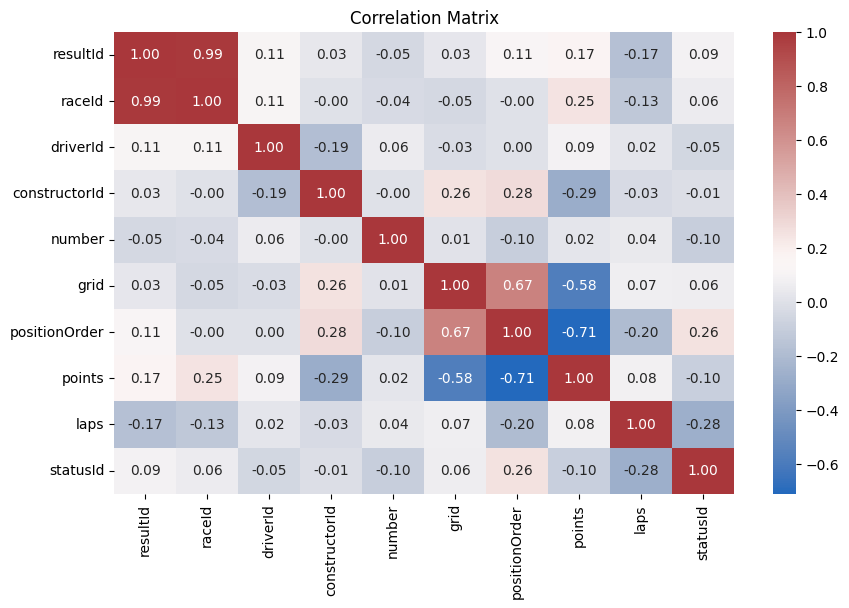

In [ ]:
#Create a correlation matrix visualization
num_columns = sprint_results_df.select_dtypes(include=['int64', 'float64']).columns

corr_matrix = sprint_results_df[num_columns].corr()

corr_matrix

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='vlag', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

##**Weather Dataset**

###Data Structure Inspection

In [ ]:
print('\nData Dimensions:')
print(weather_df.shape)

print('\n-dataset Columns:\n')
print(weather_df.columns)

print('\n-First few rows:')
print(weather_df.head(4))

print('\n-Basic Information:\n')
weather_df.info()

# Check for missing values
print('\nMissing values:')
print(weather_df.isnull().sum())

# Check for unique values
print('\nUnique Values:\n')
print(weather_df.nunique())

#Check for columns that have \N values
print('\n\\N Values:\n')
print(weather_df.applymap(lambda x: x == r'\N').any())

#Check for duplicates in dataset
print('\nDuplicates:')
print(weather_df.duplicated())

#Check for number of duplicated rows in dataset
print('\nDuplicated Rows Number:')
print(weather_df.duplicated().sum())


Data Dimensions:
(18214, 10)

-dataset Columns:

Index(['Time', 'AirTemp', 'Humidity', 'Pressure', 'Rainfall', 'TrackTemp',
       'WindDirection', 'WindSpeed', 'Round Number', 'Year'],
      dtype='object')

-First few rows:
                     Time  AirTemp  Humidity  Pressure  Rainfall  TrackTemp  \
0  0 days 00:00:57.060000     24.1      36.2     997.1     False       38.2   
1  0 days 00:01:57.078000     24.0      36.3     997.1     False       38.6   
2  0 days 00:02:57.090000     24.0      36.3     997.1     False       38.6   
3  0 days 00:03:57.106000     23.9      37.2     997.0     False       38.7   

   WindDirection  WindSpeed  Round Number  Year  
0            294        3.0             1  2018  
1            273        1.4             1  2018  
2            273        1.4             1  2018  
3            287        2.3             1  2018  

-Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18214 entries, 0 to 18213
Data columns (total 10 column

In [ ]:
# Find duplicate rows based on a specific column
duplicate_rows = weather_df[weather_df.duplicated(keep=False)]

# Display duplicate rows
print(duplicate_rows)

                        Time  AirTemp  Humidity  Pressure  Rainfall  \
5060  0 days 00:00:38.669000     27.5      35.1     939.4     False   
5061  0 days 00:01:38.684000     27.1      36.5     939.4     False   
5062  0 days 00:02:38.655000     27.0      36.2     939.3     False   
5063  0 days 00:03:38.669000     26.9      36.1     939.3     False   
5064  0 days 00:04:38.678000     27.2      35.8     939.3     False   
...                      ...      ...       ...       ...       ...   
8669  0 days 01:53:32.188000     26.4      39.5     938.3     False   
8670  0 days 01:54:32.180000     26.3      40.8     938.2     False   
8671  0 days 01:55:32.172000     26.2      42.3     938.3     False   
8672  0 days 01:56:32.171000     26.3      41.7     938.3     False   
8673  0 days 01:57:32.171000     26.2      41.9     938.4     False   

      TrackTemp  WindDirection  WindSpeed  Round Number  Year  
5060       55.6             99        1.7             1  2020  
5061       55.1    

In [ ]:
# Find all duplicate rows
duplicate_rows = weather_df[weather_df.duplicated(keep=False)]

# Group duplicate rows by all columns (to see pairs/triplets/etc.)
grouped_duplicates = duplicate_rows.groupby(list(weather_df.columns))

# Display the grouped duplicates
print("Grouped duplicate rows:")
for group_values, group in grouped_duplicates:
    print(f"Group: {group_values}")
    print(group)
    print("\n" + "="*50 + "\n")

Streaming output truncated to the last 5000 lines.
      TrackTemp  WindDirection  WindSpeed  Round Number  Year  
5091       53.3            345        1.5             1  2020  
5211       53.3            345        1.5             1  2020  


Group: ('0 days 00:32:23.526000', 21.0, 44.0, 998.7, False, 42.3, 222, 4.3, 4, 2020)
                        Time  AirTemp  Humidity  Pressure  Rainfall  \
5466  0 days 00:32:23.526000     21.0      44.0     998.7     False   
5594  0 days 00:32:23.526000     21.0      44.0     998.7     False   

      TrackTemp  WindDirection  WindSpeed  Round Number  Year  
5466       42.3            222        4.3             4  2020  
5594       42.3            222        4.3             4  2020  


Group: ('0 days 00:32:32.047000', 26.4, 34.8, 938.4, False, 51.7, 111, 0.1, 8, 2021)
                        Time  AirTemp  Humidity  Pressure  Rainfall  \
8470  0 days 00:32:32.047000     26.4      34.8     938.4     False   
8588  0 days 00:32:32.047000     26

#**Data Cleansing & Preprocessing**

##**Non-Essential data**

###Drivers

In [ ]:
driver_standings_df.shape


(34124, 7)

In [ ]:
# Drivers
# Dropping the following data 'driverRef', 'number', 'code', 'url' from drivers_df
print('\nDropping columns which are not required:')
drivers_up_df = drivers_df.drop(columns=['driverRef', 'number', 'code', 'url'], axis=1)
print(drivers_up_df.head())


Dropping columns which are not required:
   driverId  forename     surname         dob nationality
0         1     Lewis    Hamilton  1985-01-07     British
1         2      Nick    Heidfeld  1977-05-10      German
2         3      Nico     Rosberg  1985-06-27      German
3         4  Fernando      Alonso  1981-07-29     Spanish
4         5    Heikki  Kovalainen  1981-10-19     Finnish


In [ ]:
drivers_up_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 857 entries, 0 to 856
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   driverId     857 non-null    int64 
 1   forename     857 non-null    object
 2   surname      857 non-null    object
 3   dob          857 non-null    object
 4   nationality  857 non-null    object
dtypes: int64(1), object(4)
memory usage: 33.6+ KB


<ipython-input-7-102bd441ff33>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nationality_counts_grouped.values, y=nationality_counts_grouped.index, palette='viridis')


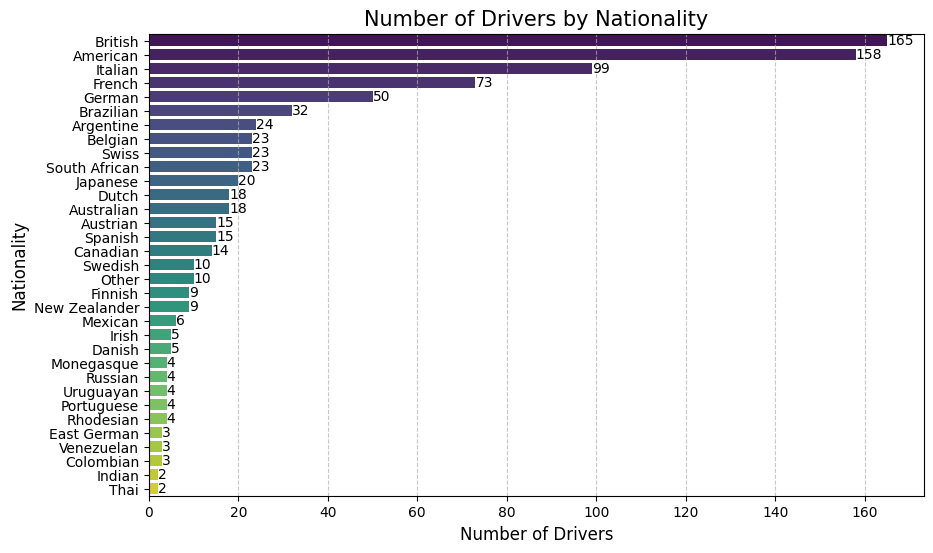

In [ ]:
# Dropping unnecessary columns
df_cleaned = drivers_up_df.drop(columns=['driverId', 'forename', 'surname', 'dob'])

# Grouping by nationality and counting the number of drivers for each nationality
nationality_counts = df_cleaned['nationality'].value_counts()

# Grouping nationalities with only 1 driver into 'Other'
other_threshold = 1
nationality_counts_grouped = nationality_counts.copy()
nationality_counts_grouped[nationality_counts_grouped <= other_threshold] = 0
nationality_counts_grouped = nationality_counts_grouped[nationality_counts_grouped > 0]

# Adding the 'Other' category
other_count = nationality_counts[nationality_counts <= other_threshold].sum()
nationality_counts_grouped['Other'] = other_count

# Sorting the counts
nationality_counts_grouped = nationality_counts_grouped.sort_values(ascending=False)

# Plotting the bar graph with Seaborn for better aesthetics
plt.figure(figsize=(10, 6))
sns.barplot(x=nationality_counts_grouped.values, y=nationality_counts_grouped.index, palette='viridis')

# Adding value annotations
for index, value in enumerate(nationality_counts_grouped.values):
    plt.text(value, index, str(value), va='center')

plt.title('Number of Drivers by Nationality', fontsize=15)
plt.xlabel('Number of Drivers', fontsize=12)
plt.ylabel('Nationality', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-8-8ecd1267f16b>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=nationality_ratios.values, y=nationality_ratios.index, palette='viridis')


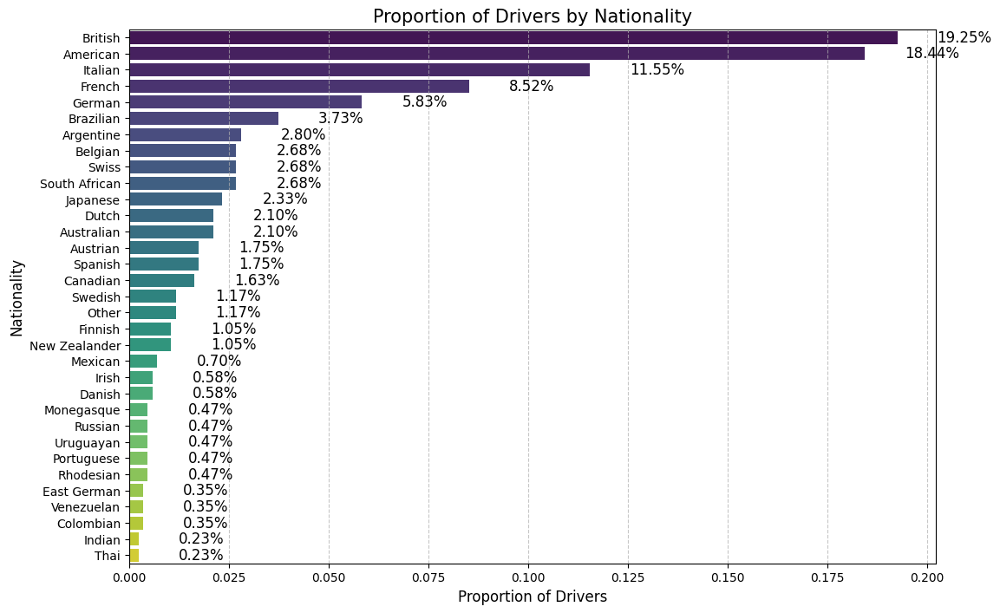

In [ ]:
# Converting counts to ratios
total_drivers = nationality_counts.sum()
nationality_ratios = nationality_counts_grouped / total_drivers

# Enhanced horizontal bar graph
plt.figure(figsize=(12, 8))
bars = sns.barplot(x=nationality_ratios.values, y=nationality_ratios.index, palette='viridis')

# Adding value annotations
for bar in bars.patches:
    plt.text(bar.get_width() + 0.01,
             bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.2%}',
             va='center', ha='left', fontsize=12)

plt.title('Proportion of Drivers by Nationality', fontsize=15)
plt.xlabel('Proportion of Drivers', fontsize=12)
plt.ylabel('Nationality', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Calculate the total number of drivers
total_drivers = drivers_df.shape[0]

print(f"Total number of drivers: {total_drivers}")

Total number of drivers: 857


In [ ]:
driver_standings_df.columns


Index(['driverStandingsId', 'raceId', 'driverId', 'points', 'position',
       'positionText', 'wins'],
      dtype='object')

###Constructiors

In [ ]:
constructors_df.columns

Index(['constructorId', 'constructorRef', 'name', 'nationality', 'url'], dtype='object')

In [ ]:
# Constructors
# Dropping the following data 'constructorRef', 'url' from constructors_df
print('\nDropping columns which are not required:')
constructors_up_df = constructors_df.drop(columns=['constructorRef','url'], axis=1)
print(constructors_up_df.head())


Dropping columns which are not required:
   constructorId        name nationality
0              1     McLaren     British
1              2  BMW Sauber      German
2              3    Williams     British
3              4     Renault      French
4              5  Toro Rosso     Italian


In [ ]:
constructors_up_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   constructorId  211 non-null    int64 
 1   name           211 non-null    object
 2   nationality    211 non-null    object
dtypes: int64(1), object(2)
memory usage: 5.1+ KB


<ipython-input-13-5227cd945044>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=constructor_ratios.values, y=constructor_ratios.index, palette='viridis')


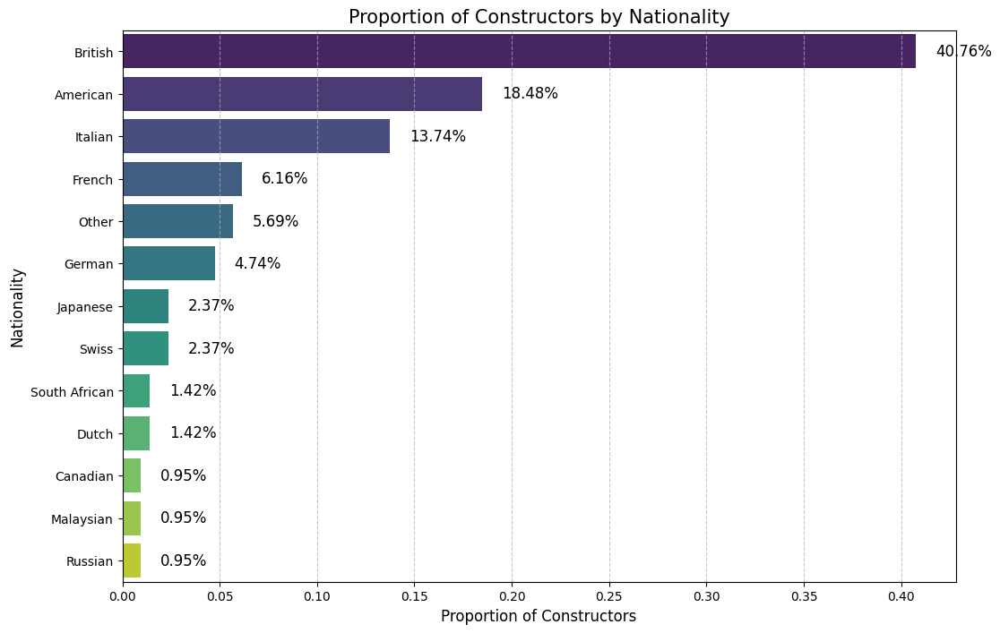

In [ ]:
# Dropping unnecessary columns
constructors_cleaned = constructors_df.drop(columns=['constructorId', 'constructorRef', 'name', 'url'])

# Grouping by nationality and counting the number of constructors for each nationality
constructor_counts = constructors_cleaned['nationality'].value_counts()

# Grouping nationalities with only 1 constructor into 'Other'
other_threshold = 1
constructor_counts_grouped = constructor_counts.copy()
constructor_counts_grouped[constructor_counts_grouped <= other_threshold] = 0
constructor_counts_grouped = constructor_counts_grouped[constructor_counts_grouped > 0]

# Adding the 'Other' category
other_count = constructor_counts[constructor_counts <= other_threshold].sum()
constructor_counts_grouped['Other'] = other_count

# Sorting the counts
constructor_counts_grouped = constructor_counts_grouped.sort_values(ascending=False)

# Converting counts to ratios
total_constructors = constructor_counts.sum()
constructor_ratios = constructor_counts_grouped / total_constructors

# Enhanced horizontal bar graph
plt.figure(figsize=(12, 8))
bars = sns.barplot(x=constructor_ratios.values, y=constructor_ratios.index, palette='viridis')

# Adding value annotations
for bar in bars.patches:
    plt.text(bar.get_width() + 0.01,
             bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.2%}',
             va='center', ha='left', fontsize=12)

plt.title('Proportion of Constructors by Nationality', fontsize=15)
plt.xlabel('Proportion of Constructors', fontsize=12)
plt.ylabel('Nationality', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-14-8153baf042dd>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=constructor_counts_grouped.values, y=constructor_counts_grouped.index, palette='viridis')


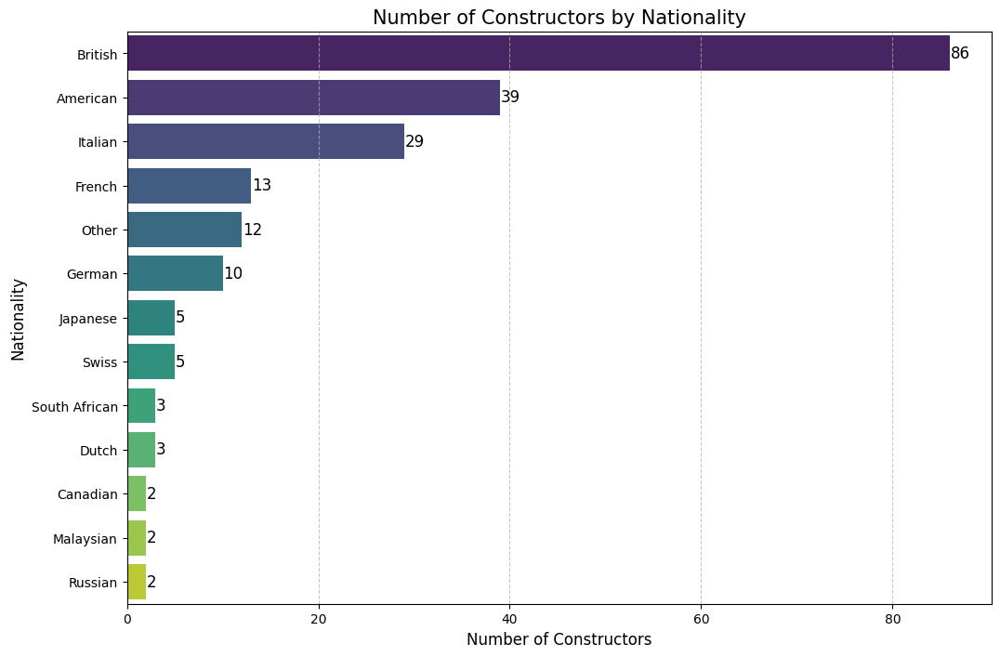

In [ ]:
# Enhanced horizontal bar graph
plt.figure(figsize=(12, 8))
bars = sns.barplot(x=constructor_counts_grouped.values, y=constructor_counts_grouped.index, palette='viridis')

# Adding value annotations
for bar in bars.patches:
    plt.text(bar.get_width() + 0.05,
             bar.get_y() + bar.get_height()/2,
             f'{int(bar.get_width())}',
             va='center', ha='left', fontsize=12)

plt.title('Number of Constructors by Nationality', fontsize=15)
plt.xlabel('Number of Constructors', fontsize=12)
plt.ylabel('Nationality', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Calculate the total number of constructors
total_constructors = constructors_df.shape[0]

print(f"Total number of constructors: {total_constructors}")

Total number of constructors: 211


###Races

In [ ]:
# Races
# Dropping the following data: 'time', 'url','fp1_date', 'fp1_time', 'fp2_date', 'fp2_time', 'fp3_date', 'fp3_time','quali_date', 'quali_time', 'sprint_date', 'sprint_time'
print('\nColumns after dropping: ')
races_up_df = races_df.drop(columns=['time', 'url','fp1_date', 'fp1_time', 'fp2_date', 'fp2_time', 'fp3_date', 'fp3_time','quali_date', 'quali_time', 'sprint_date', 'sprint_time'], axis=1)
print(races_up_df.columns)
print(races_up_df.head(4))

# Filtering for races named 'Monaco Grand Prix'
print('\nFiltering for races named Monaco Grand Prix:')
monaco_races_df = races_up_df[races_up_df['name'] == 'Monaco Grand Prix']


Columns after dropping: 
Index(['raceId', 'year', 'round', 'circuitId', 'name', 'date'], dtype='object')
   raceId  year  round  circuitId                   name        date
0       1  2009      1          1  Australian Grand Prix  2009-03-29
1       2  2009      2          2   Malaysian Grand Prix  2009-04-05
2       3  2009      3         17     Chinese Grand Prix  2009-04-19
3       4  2009      4          3     Bahrain Grand Prix  2009-04-26

Filtering for races named Monaco Grand Prix:


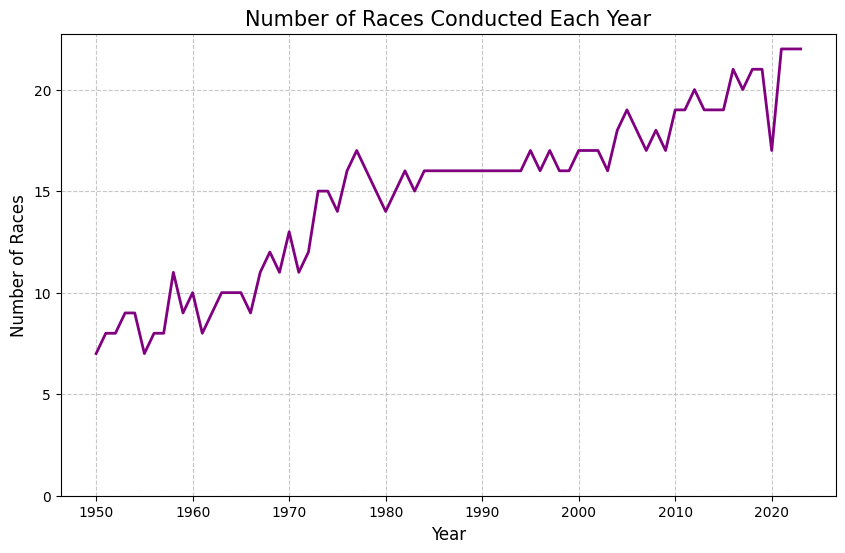

In [ ]:
# Counting the number of races conducted each year
race_counts = races_df['year'].value_counts().sort_index()

# Plotting the line graph with style
plt.figure(figsize=(10, 6))
plt.plot(race_counts.index, race_counts.values, color='purple', linestyle='-', linewidth=2)

# Adding labels and title
plt.title('Number of Races Conducted Each Year', fontsize=15)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Races', fontsize=12)

# Adding gridlines and adjusting limits
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(bottom=0)  # Ensure y-axis starts from 0

plt.show()

<ipython-input-18-4b260d080a63>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=race_counts_per_name.values, y=race_counts_per_name.index, palette='viridis')


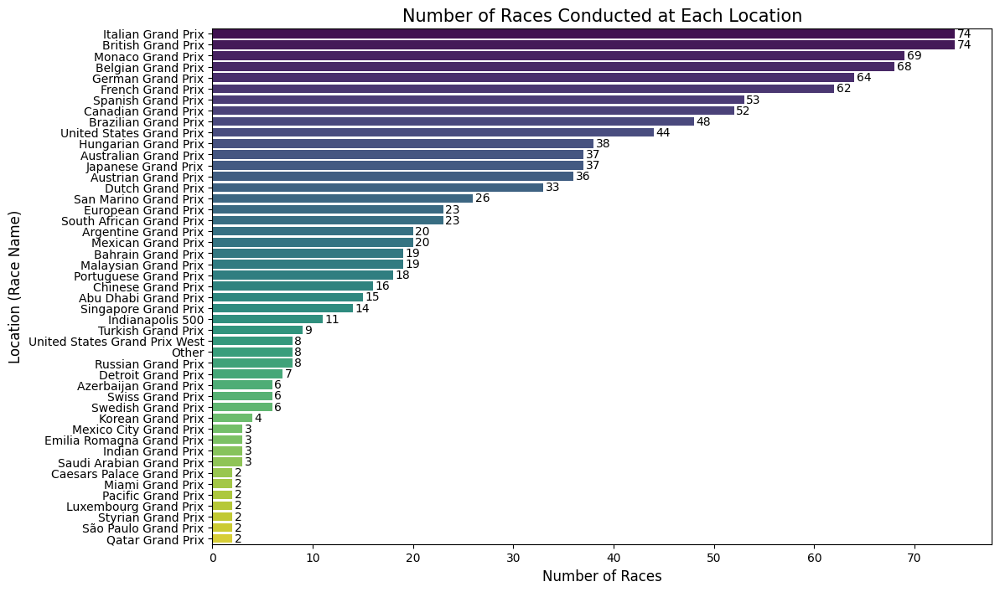

In [ ]:
# Count the number of races conducted at each location
race_counts_per_name = races_df['name'].value_counts()

# Identify races conducted only once
races_conducted_once = race_counts_per_name[race_counts_per_name == 1]
# Group them into "Other" category
race_counts_per_name['Other'] = races_conducted_once.sum()
race_counts_per_name = race_counts_per_name.drop(races_conducted_once.index)

# Sort the values
race_counts_per_name = race_counts_per_name.sort_values(ascending=False)

# Plotting the bar graph with style
plt.figure(figsize=(12, 8))
sns.barplot(x=race_counts_per_name.values, y=race_counts_per_name.index, palette='viridis')

# Adding number labels on the bars
for i, v in enumerate(race_counts_per_name.values):
    plt.text(v + 0.2, i, str(v), ha='left', va='center', fontsize=10)

# Adding labels and title
plt.title('Number of Races Conducted at Each Location', fontsize=15)
plt.xlabel('Number of Races', fontsize=12)
plt.ylabel('Location (Race Name)', fontsize=12)

plt.show()

In [ ]:

# Calculate the total number of races
total_races = races_df.shape[0]

print(f"Total number of races conducted: {total_races}")

Total number of races conducted: 1101


###Results

In [ ]:
results_df.head()

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22,1,1,1,1,10.0,58,1:34:50.616,5690616,39,2,1:27.452,218.300,1
1,2,18,2,2,3,5,2,2,2,8.0,58,+5.478,5696094,41,3,1:27.739,217.586,1
2,3,18,3,3,7,7,3,3,3,6.0,58,+8.163,5698779,41,5,1:28.090,216.719,1
3,4,18,4,4,5,11,4,4,4,5.0,58,+17.181,5707797,58,7,1:28.603,215.464,1
4,5,18,5,1,23,3,5,5,5,4.0,58,+18.014,5708630,43,1,1:27.418,218.385,1


##**Data Transformation**

###Races

In [ ]:
races_up_df.head(4)

,raceId,year,round,circuitId,name,date
0,1,2009,1,1,Australian Grand Prix,2009-03-29
1,2,2009,2,2,Malaysian Grand Prix,2009-04-05
2,3,2009,3,17,Chinese Grand Prix,2009-04-19
3,4,2009,4,3,Bahrain Grand Prix,2009-04-26


In [ ]:
# Races

# Filtering for races named 'Monaco Grand Prix'
print('\nFiltering for races named Monaco Grand Prix:')
monaco_races_df = races_up_df[races_up_df['name'] == 'Monaco Grand Prix']
print(monaco_races_df.head())


Filtering for races named Monaco Grand Prix:
    raceId  year  round  circuitId               name        date
5        6  2009      6          6  Monaco Grand Prix  2009-05-24
22      23  2008      6          6  Monaco Grand Prix  2008-05-25
39      40  2007      5          6  Monaco Grand Prix  2007-05-27
58      59  2006      7          6  Monaco Grand Prix  2006-05-28
75      76  2005      6          6  Monaco Grand Prix  2005-05-22


###Results

In [ ]:
# Results
# Replace '\\N' with appropriate default values
results_df['position'] = results_df['position'].replace('\\N', 0)
results_df['milliseconds'] = results_df['milliseconds'].replace('\\N', 0)
results_df['fastestLapTime'] = results_df['fastestLapTime'].replace('\\N', '0:0')
results_df['fastestLapSpeed'] = results_df['fastestLapSpeed'].replace('\\N', 0)
results_df["fastestLap"]= results_df["fastestLap"].replace('\\N', 0)
results_df["rank"]= results_df["rank"].replace('\\N', 0)

# Convert data types to numerical types. fastestLapTime is converted to a string to prepare for final conversion to seconds.
results_df["fastestLap"]= results_df["fastestLap"].astype(np.int64)
results_df["fastestLapTime"]= results_df["fastestLapTime"].astype(str)
results_df["fastestLapSpeed"]= results_df["fastestLapSpeed"].astype(np.float64)
results_df["rank"]= results_df["rank"].astype(np.int64)
results_df["milliseconds"]= results_df["milliseconds"].astype(np.float64)
results_df['position'] = results_df['position'].astype(np.int64)

# Convert the fastest lap time from a string to seconds.
def time_to_seconds(time_str):
    if time_str:
        minutes, seconds = map(float, time_str.split(':'))
        total_seconds = minutes * 60 + seconds
        return total_seconds
    return None

# Apply the conversion function to the 'fastestLapTime' column
results_df['fastestLapTime_in_seconds'] = results_df['fastestLapTime'].apply(time_to_seconds)

# Convert milliseconds to seconds and rename column to
results_df['milliseconds'] = results_df['milliseconds'] / 1000
results_df = results_df.rename(columns={'milliseconds': 'time_in_seconds'})

# Identify the current index position of 'fastestLapTime'
current_index = results_df.columns.get_loc('fastestLapTime')

# Insert 'fastestLapTime_in_seconds' to the right of 'fastestLapTime'
new_order = list(results_df.columns)
new_order.insert(current_index + 1, new_order.pop(new_order.index('fastestLapTime_in_seconds')))
results_df = results_df[new_order]

# Display the DataFrame after reordering
print(results_df.head())

   resultId  raceId  driverId  constructorId number  grid  position  \
0         1      18         1              1     22     1         1   
1         2      18         2              2      3     5         2   
2         3      18         3              3      7     7         3   
3         4      18         4              4      5    11         4   
4         5      18         5              1     23     3         5   

  positionText  positionOrder  points  laps         time  time_in_seconds  \
0            1              1    10.0    58  1:34:50.616         5690.616   
1            2              2     8.0    58       +5.478         5696.094   
2            3              3     6.0    58       +8.163         5698.779   
3            4              4     5.0    58      +17.181         5707.797   
4            5              5     4.0    58      +18.014         5708.630   

   fastestLap  rank fastestLapTime  fastestLapTime_in_seconds  \
0          39     2       1:27.452           

In [ ]:
# Dropping the following data: 'number  ', 'positionText','time', 'fastestLapTime'
print('\nColumns after dropping: ')
results_up_df = results_df.drop(columns=['number', 'positionText','time', 'fastestLapTime'], axis=1)
print(results_up_df.columns)
print(results_up_df.head(4))


Columns after dropping: 
Index(['resultId', 'raceId', 'driverId', 'constructorId', 'grid', 'position',
       'positionOrder', 'points', 'laps', 'time_in_seconds', 'fastestLap',
       'rank', 'fastestLapTime_in_seconds', 'fastestLapSpeed', 'statusId'],
      dtype='object')
   resultId  raceId  driverId  constructorId  grid  position  positionOrder  \
0         1      18         1              1     1         1              1   
1         2      18         2              2     5         2              2   
2         3      18         3              3     7         3              3   
3         4      18         4              4    11         4              4   

   points  laps  time_in_seconds  fastestLap  rank  fastestLapTime_in_seconds  \
0    10.0    58         5690.616          39     2                     87.452   
1     8.0    58         5696.094          41     3                     87.739   
2     6.0    58         5698.779          41     5                     88.090   
3  

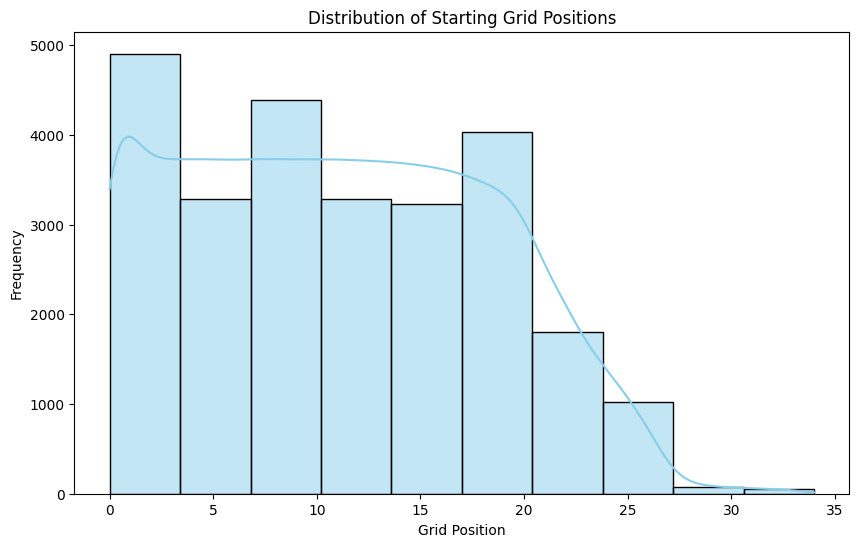

<ipython-input-26-3d603e0ff526>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='constructorId', y='points', data=results_up_df, palette='pastel')


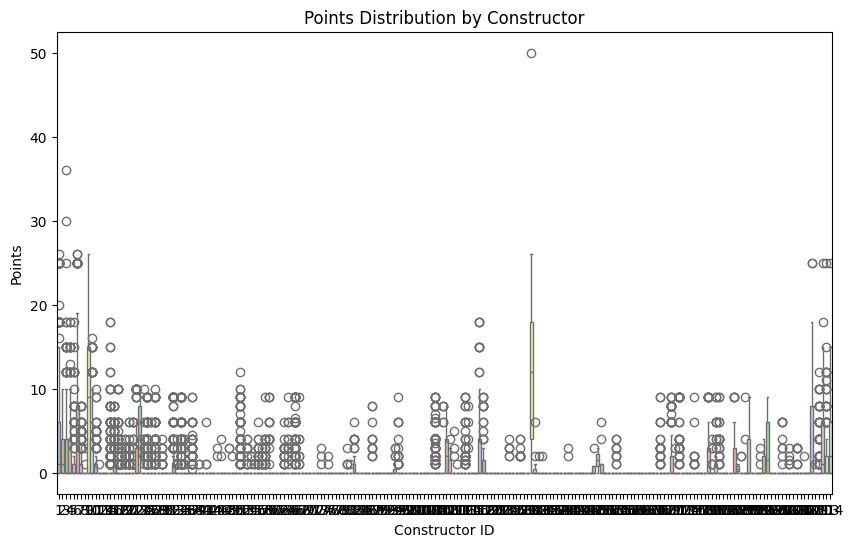

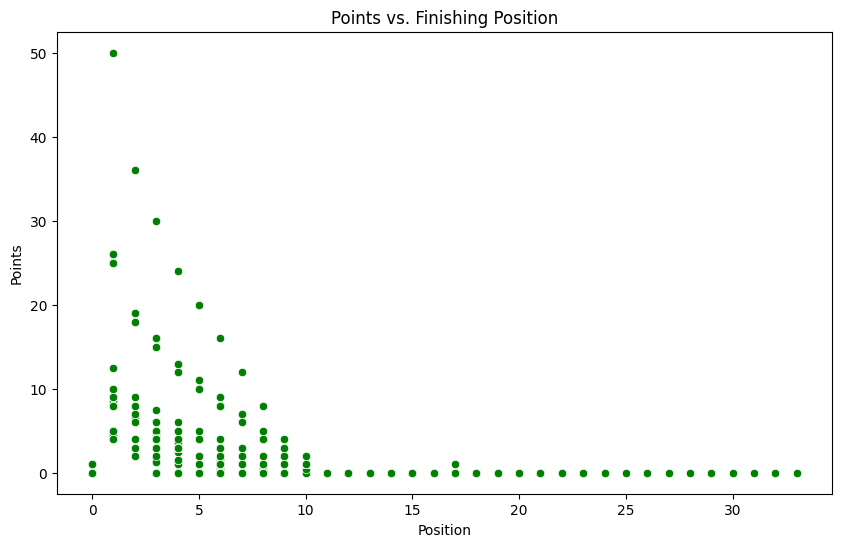

<ipython-input-26-3d603e0ff526>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='constructorId', data=results_up_df, palette='Set2')


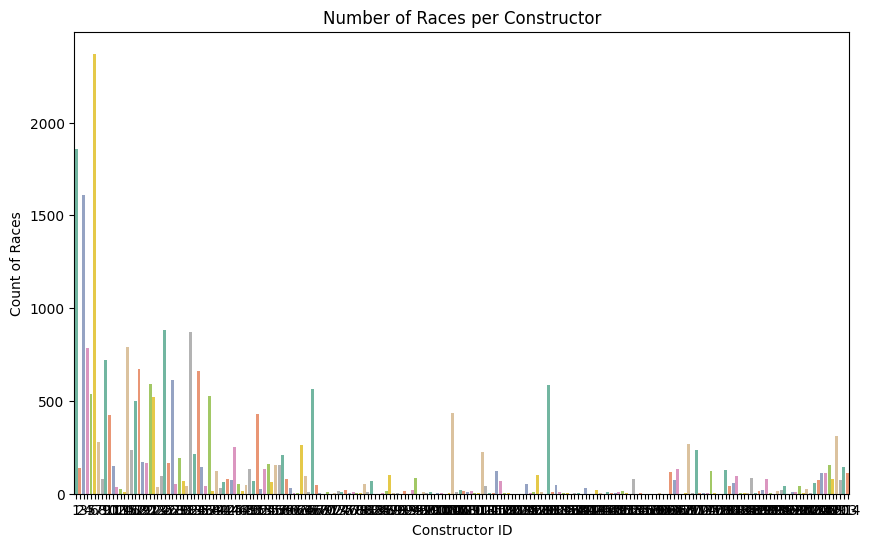

<Figure size 1200x800 with 0 Axes>

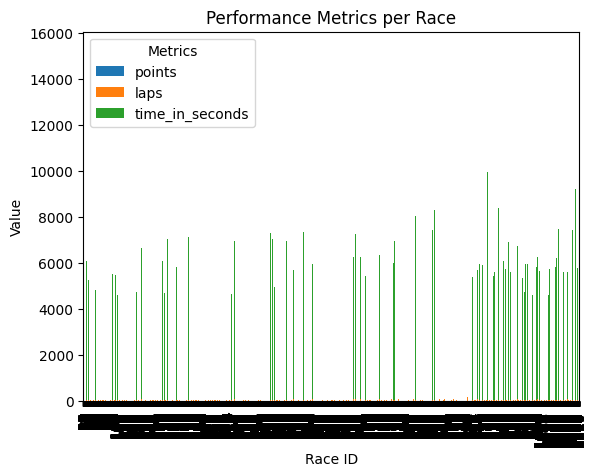

In [ ]:
# Histogram/Distribution Plot for 'grid'
plt.figure(figsize=(10, 6))
sns.histplot(results_up_df['grid'], bins=10, kde=True, color='skyblue')
plt.title('Distribution of Starting Grid Positions')
plt.xlabel('Grid Position')
plt.ylabel('Frequency')
plt.show()

# Box Plot for 'points' by 'constructorId'
plt.figure(figsize=(10, 6))
sns.boxplot(x='constructorId', y='points', data=results_up_df, palette='pastel')
plt.title('Points Distribution by Constructor')
plt.xlabel('Constructor ID')
plt.ylabel('Points')
plt.show()

# Scatter Plot for 'points' against 'position'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='position', y='points', data=results_up_df, color='green')
plt.title('Points vs. Finishing Position')
plt.xlabel('Position')
plt.ylabel('Points')
plt.show()

# Bar Chart for count of races per constructor
plt.figure(figsize=(10, 6))
sns.countplot(x='constructorId', data=results_up_df, palette='Set2')
plt.title('Number of Races per Constructor')
plt.xlabel('Constructor ID')
plt.ylabel('Count of Races')
plt.show()

# Stacked Bar Chart for performance metrics per race
metrics = ['points', 'laps', 'time_in_seconds']
plt.figure(figsize=(12, 8))
results_up_df.set_index('raceId')[metrics].plot(kind='bar', stacked=True)
plt.title('Performance Metrics per Race')
plt.xlabel('Race ID')
plt.ylabel('Value')
plt.legend(title='Metrics')
plt.show()

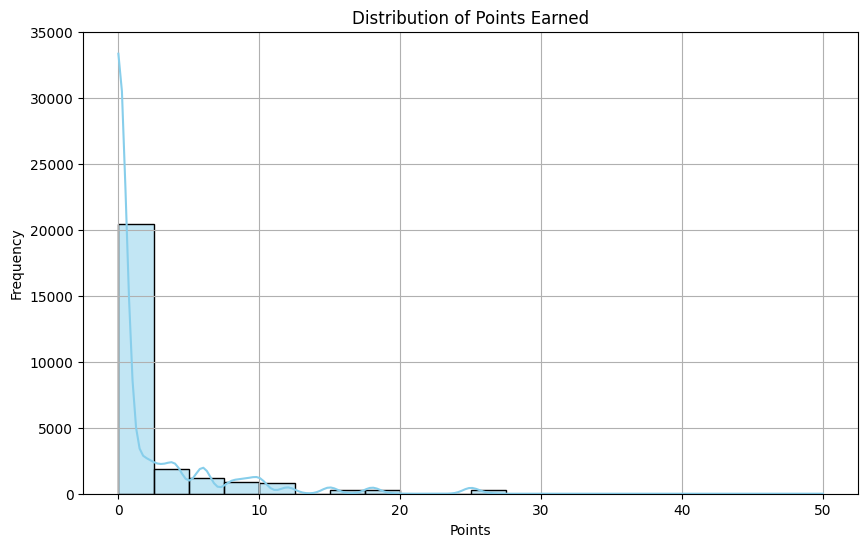

In [ ]:
# Plotting histogram for 'points'
plt.figure(figsize=(10, 6))
sns.histplot(results_up_df['points'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Points Earned')
plt.xlabel('Points')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

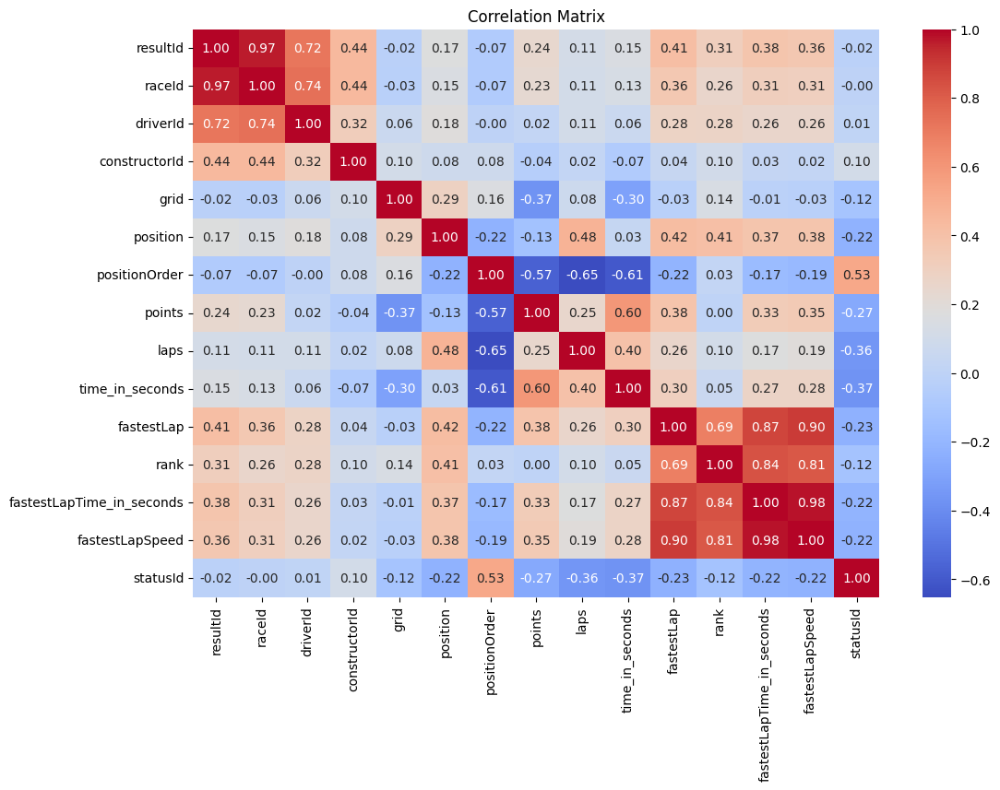

In [ ]:
# Calculate correlation matrix
corr_matrix = results_up_df.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

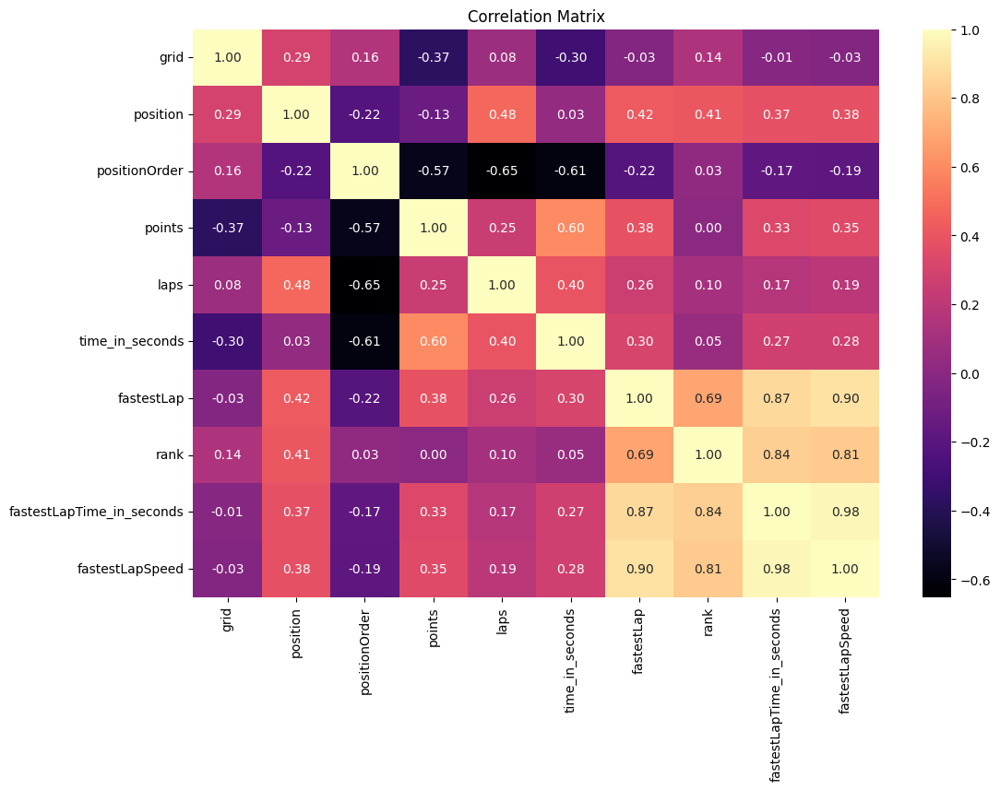

In [ ]:
# Drop the specified columns
columns_to_drop = ['resultId', 'raceId', 'driverId', 'constructorId','statusId']
results_up_corr_df = results_up_df.drop(columns=columns_to_drop)

# Calculate correlation matrix
corr_matrix = results_up_corr_df.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='magma', fmt=".2f")  # 'magma' is a vibrant color palette
plt.title('Correlation Matrix')
plt.show()











In [ ]:
# Print correlation coefficients
print("Correlation coefficients:")
print(corr_matrix)

Correlation coefficients:


NameError: name 'corr_matrix' is not defined

In [ ]:
# Calculate descriptive statistics for the DataFrame
descriptive_stats = results_up_corr_df.describe()

transposed_stats=descriptive_stats.T
transposed_stats

,count,mean,std,min,25%,50%,75%,max
grid,26080.0,11.167561,7.232797,0.0,5.0,11.0,17.0000,34.00
position,26080.0,4.645169,5.381466,0.0,0.0,2.0,8.0000,33.00
positionOrder,26080.0,12.854141,7.700068,1.0,6.0,12.0,18.0000,39.00
points,26080.0,1.906635,4.219715,0.0,0.0,0.0,2.0000,50.00
laps,26080.0,46.076687,29.726058,0.0,22.0,53.0,66.0000,200.00
time_in_seconds,26080.0,1728.963770,2922.157389,0.0,0.0,0.0,5061.8965,15090.54
fastestLap,26080.0,12.430023,21.365583,0.0,0.0,0.0,22.0000,85.00
rank,26080.0,3.123581,5.839444,0.0,0.0,0.0,3.0000,24.00
fastestLapTime_in_seconds,26080.0,26.574067,41.929368,0.0,0.0,0.0,77.2110,202.30
fastestLapSpeed,26080.0,59.377854,93.186184,0.0,0.0,0.0,185.5590,257.32


###Lap Times

In [ ]:
lap_times_df.dtypes

raceId           int64
driverId         int64
lap              int64
position         int64
time            object
milliseconds     int64
dtype: object

In [ ]:
# Convert milliseconds to seconds and rename column to
lap_times_df['milliseconds'] = lap_times_df['milliseconds'] / 1000
lap_times_df = lap_times_df.rename(columns={'milliseconds': 'time_in_seconds'})
lap_times_df

,raceId,driverId,lap,position,time,time_in_seconds
0,841,20,1,1,1:38.109,98.109
1,841,20,2,1,1:33.006,93.006
2,841,20,3,1,1:32.713,92.713
3,841,20,4,1,1:32.803,92.803
4,841,20,5,1,1:32.342,92.342
...,...,...,...,...,...,...
551737,1110,817,40,17,1:54.361,114.361
551738,1110,817,41,17,1:53.367,113.367
551739,1110,817,42,16,1:55.247,115.247
551740,1110,817,43,16,1:52.115,112.115


In [ ]:
# Drop the specified columns
columns_to_drop = ['time']
lap_times_df = lap_times_df.drop(columns=columns_to_drop)

In [ ]:
lap_times_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551742 entries, 0 to 551741
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   raceId           551742 non-null  int64  
 1   driverId         551742 non-null  int64  
 2   lap              551742 non-null  int64  
 3   position         551742 non-null  int64  
 4   time_in_seconds  551742 non-null  float64
dtypes: float64(1), int64(4)
memory usage: 21.0 MB


In [ ]:
columns_to_drop = ['raceId','driverId']
lap_times_df_cr = lap_times_df.drop(columns=columns_to_drop)

In [ ]:
lap_times_df_cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551742 entries, 0 to 551741
Data columns (total 3 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   lap              551742 non-null  int64  
 1   position         551742 non-null  int64  
 2   time_in_seconds  551742 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 12.6 MB


In [ ]:
# Calculate descriptive statistics for the DataFrame
descriptive_stats_l = lap_times_df_cr.describe()

# Display the descriptive statistics
print(descriptive_stats_l)

                 lap       position  time_in_seconds
count  551742.000000  551742.000000    551742.000000
mean       29.990193       9.658699        95.706206
std        18.420399       5.538011        74.786046
min         1.000000       1.000000        55.404000
25%        14.000000       5.000000        81.993000
50%        29.000000       9.000000        90.673000
75%        44.000000      14.000000       102.243000
max        87.000000      24.000000      7507.547000


In [ ]:
transposed_stats_l=descriptive_stats_l.T
transposed_stats_l

,count,mean,std,min,25%,50%,75%,max
lap,551742.0,29.990193,18.420399,1.000,14.000,29.000,44.000,87.000
position,551742.0,9.658699,5.538011,1.000,5.000,9.000,14.000,24.000
time_in_seconds,551742.0,95.706206,74.786046,55.404,81.993,90.673,102.243,7507.547


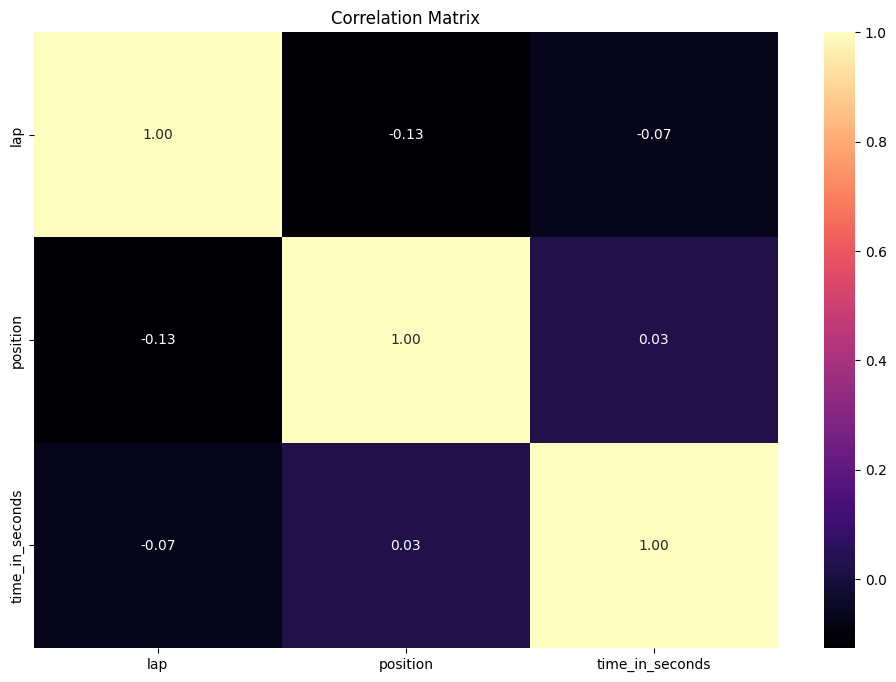

In [ ]:


# Calculate correlation matrix
corr_matrix = lap_times_df_cr.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='magma', fmt=".2f")  # 'magma' is a vibrant color palette
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Print correlation coefficients
print("Correlation coefficients:")
print(corr_matrix)

Correlation coefficients:


NameError: name 'corr_matrix' is not defined

###Pit Stops

In [ ]:
# Convert milliseconds to seconds and rename column to
pit_stops_df['milliseconds'] = pit_stops_df['milliseconds'] / 1000
pit_stops_df = pit_stops_df.rename(columns={'milliseconds': 'time_in_seconds'})
# Replace '\\N' with appropriate default values
pit_stops_df['stop'] = pit_stops_df['stop'].replace('NC', 0)
# Convert data types to numerical types.
pit_stops_df["stop"]= pit_stops_df["stop"].astype(np.int64)

pit_stops_df.dtypes

raceId               int64
driverId             int64
stop                 int64
lap                  int64
time                object
duration           float64
time_in_seconds    float64
dtype: object

In [ ]:
# Drop the specified columns
columns_to_drop = ['time']
pit_stops_up_df = pit_stops_df.drop(columns=columns_to_drop)

In [ ]:
pit_stops_up_df.columns

Index(['raceId', 'driverId', 'stop', 'lap', 'duration', 'time_in_seconds'], dtype='object')

In [ ]:
# Drop the specified columns
columns_to_drop = ['raceId','driverId']
pit_stops_up2_df = pit_stops_up_df.drop(columns=columns_to_drop)
pit_stops_up2_df

,stop,lap,duration,time_in_seconds
0,1,1,26.90,26.898
1,1,1,25.02,25.021
2,1,11,23.43,23.426
3,1,12,23.25,23.251
4,1,13,23.84,23.842
...,...,...,...,...
10438,3,60,50.46,50.460
10439,3,67,24.33,24.330
10440,0,0,0.00,0.000
10441,0,0,0.00,0.000


In [ ]:
pit_stops_up2_df.columns

Index(['stop', 'lap', 'duration', 'time_in_seconds'], dtype='object')

In [ ]:
# Calculate descriptive statistics for the DataFrame
descriptive_stats_p = pit_stops_up2_df.describe()

# Display the descriptive statistics
print(descriptive_stats_p)

               stop           lap      duration  time_in_seconds
count  10443.000000  10443.000000  10443.000000     10443.000000
mean       1.746242     25.711098     23.503924        73.692751
std        0.910238     14.939998      6.610224       274.237117
min        0.000000      0.000000      0.000000         0.000000
25%        1.000000     13.000000     21.660000        21.964000
50%        2.000000     25.000000     23.350000        23.676000
75%        2.000000     37.000000     25.660000        26.554000
max        6.000000     78.000000     59.560000      3069.017000


In [ ]:
pit_stops_up2_df

,stop,lap,duration,time_in_seconds
0,1,1,26.90,26.898
1,1,1,25.02,25.021
2,1,11,23.43,23.426
3,1,12,23.25,23.251
4,1,13,23.84,23.842
...,...,...,...,...
10438,3,60,50.46,50.460
10439,3,67,24.33,24.330
10440,0,0,0.00,0.000
10441,0,0,0.00,0.000


In [ ]:
#Calculate correlation matrix for all variables
correlation_matrix = pit_stops_up2_df.corr()

# Display the correlation matrix
print(correlation_matrix)

                     stop       lap  duration  time_in_seconds
stop             1.000000  0.576030 -0.106559         0.061388
lap              0.576030  1.000000  0.008872        -0.079239
duration        -0.106559  0.008872  1.000000        -0.626203
time_in_seconds  0.061388 -0.079239 -0.626203         1.000000


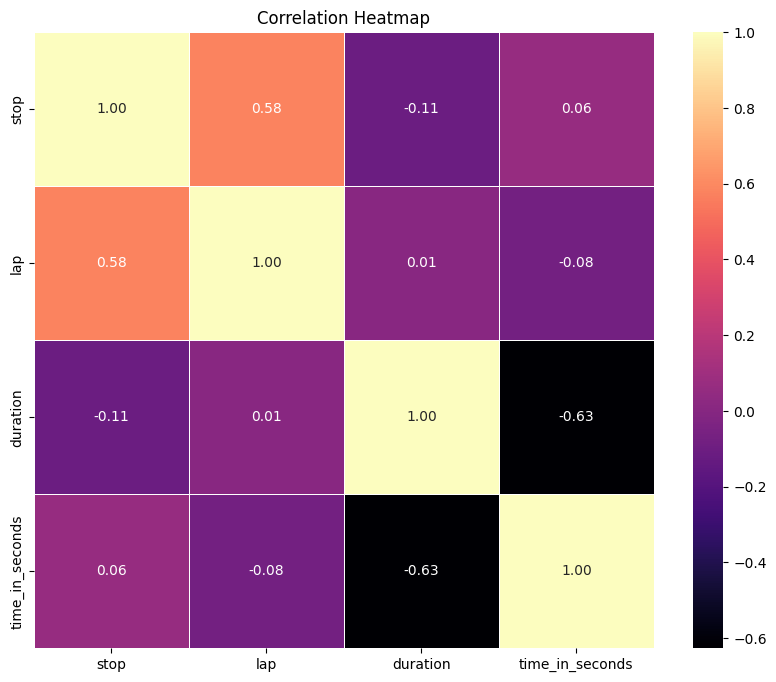

In [ ]:
# Create heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='magma', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()



In [ ]:
pit_stops_up_df

,raceId,driverId,stop,lap,duration,time_in_seconds
0,841,153,1,1,26.90,26.898
1,841,30,1,1,25.02,25.021
2,841,17,1,11,23.43,23.426
3,841,4,1,12,23.25,23.251
4,841,13,1,13,23.84,23.842
...,...,...,...,...,...,...
10438,229,55,3,60,50.46,50.460
10439,229,56,3,67,24.33,24.330
10440,229,22,0,0,0.00,0.000
10441,229,83,0,0,0.00,0.000


###Driver Standings

In [ ]:
driver_standings_df.columns

Index(['driverStandingsId', 'raceId', 'driverId', 'points', 'position',
       'positionText', 'wins'],
      dtype='object')

In [ ]:
driver_standings_df.dtypes

driverStandingsId      int64
raceId                 int64
driverId               int64
points               float64
position               int64
positionText          object
wins                   int64
dtype: object

In [ ]:
# Drop the specified columns
columns_to_drop = ['positionText','driverStandingsId']
driver_standings_up_df = driver_standings_df.drop(columns=columns_to_drop)

In [ ]:
driver_standings_up_df.dtypes

raceId        int64
driverId      int64
points      float64
position      int64
wins          int64
dtype: object

In [ ]:
# Drop the specified columns
columns_to_drop = ['raceId','driverId']
driver_standings_upcrr_df = driver_standings_up_df.drop(columns=columns_to_drop)

# Calculate descriptive statistics for the DataFrame
descriptive_stats_ds = driver_standings_upcrr_df.describe()

# Display the descriptive statistics
print(descriptive_stats_ds)

             points      position          wins
count  34124.000000  34124.000000  34124.000000
mean      13.489987     19.897169      0.269429
std       35.599709     16.396017      0.995681
min        0.000000      1.000000      0.000000
25%        0.000000      8.000000      0.000000
50%        1.000000     16.000000      0.000000
75%       10.000000     26.000000      0.000000
max      454.000000    108.000000     15.000000


In [ ]:
transposed_stats_ds=descriptive_stats_ds.T
transposed_stats_ds

,count,mean,std,min,25%,50%,75%,max
points,34124.0,13.489987,35.599709,0.0,0.0,1.0,10.0,454.0
position,34124.0,19.897169,16.396017,1.0,8.0,16.0,26.0,108.0
wins,34124.0,0.269429,0.995681,0.0,0.0,0.0,0.0,15.0


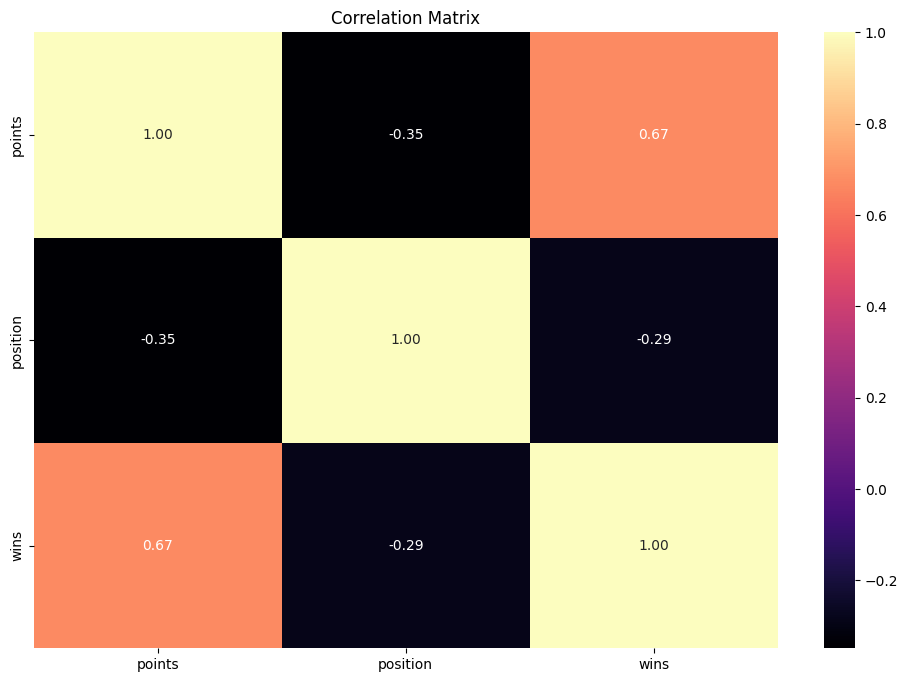

In [ ]:
# Calculate correlation matrix
corr_matrix_ds = driver_standings_upcrr_df.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_ds, annot=True, cmap='magma', fmt=".2f")  # 'magma' is a vibrant color palette
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Print correlation coefficients
print("Correlation coefficients:")
print(corr_matrix_ds)

Correlation coefficients:
            points  position      wins
points    1.000000 -0.348723  0.669278
position -0.348723  1.000000 -0.289495
wins      0.669278 -0.289495  1.000000


###Constructor standings

In [ ]:
constructor_standings_df.dtypes

constructorStandingsId      int64
raceId                      int64
constructorId               int64
points                    float64
position                    int64
positionText               object
wins                        int64
dtype: object

In [ ]:
# Drop the specified columns
drop_columns_cs = ['positionText']
constructor_standings_up_df = constructor_standings_df.drop(columns=drop_columns_cs)
constructor_standings_up_df

,constructorStandingsId,raceId,constructorId,points,position,wins
0,1,18,1,14.0,1,1
1,2,18,2,8.0,3,0
2,3,18,3,9.0,2,0
3,4,18,4,5.0,4,0
4,5,18,5,2.0,5,0
...,...,...,...,...,...,...
13046,28568,1110,214,57.0,6,0
13047,28569,1110,3,11.0,7,0
13048,28570,1110,213,3.0,10,0
13049,28571,1110,210,11.0,8,0


In [ ]:
constructor_results_df.dtypes

constructorResultsId      int64
raceId                    int64
constructorId             int64
points                  float64
status                   object
dtype: object

In [ ]:
# Drop the specified columns
drop_columns_cr = ['status']
constructor_results_up_df = constructor_results_df.drop(columns=drop_columns_cr)
constructor_results_up_df

,constructorResultsId,raceId,constructorId,points
0,1,18,1,14.0
1,2,18,2,8.0
2,3,18,3,9.0
3,4,18,4,5.0
4,5,18,5,2.0
...,...,...,...,...
12285,16785,1110,214,10.0
12286,16786,1110,213,1.0
12287,16787,1110,51,0.0
12288,16788,1110,3,0.0


### Adding Prefoxes to column names to avoid conflicts

In [ ]:
# Add prefixes to column names to avoid conflicts
drivers_up_df = drivers_up_df.add_prefix('drivers_')
driver_standings_up_df = driver_standings_up_df.add_prefix('drivers_s_')
races_up_df = races_up_df.add_prefix('races_')
pit_stops_up_df = pit_stops_up_df.add_prefix('pit_stops_')
results_up_df = results_up_df.add_prefix('results_')
constructors_up_df = constructors_up_df.add_prefix('constructors_')
constructor_standings_df = constructor_standings_df.add_prefix('constructors_s_')
constructor_results_df = constructor_results_df.add_prefix('constructors_r_')
lap_times_df = lap_times_df.add_prefix('lap_times_')
#weather_df = weather_df.add_prefix('weather_')

# Remove the prefixes from the keys
drivers_up_df.rename(columns={'drivers_driverId': 'driverId'}, inplace=True)
driver_standings_up_df.rename(columns={'drivers_s_driverId': 'driverId', 'drivers_s_raceId': 'raceId'}, inplace=True)
races_up_df.rename(columns={'races_raceId': 'raceId', 'races_year': 'year', 'races_round': 'round'}, inplace=True)
pit_stops_up_df.rename(columns={'pit_stops_driverId': 'driverId', 'pit_stops_raceId': 'raceId'}, inplace=True)
results_up_df.rename(columns={'results_resultId': 'resultId', 'results_raceId': 'raceId', 'results_driverId': 'driverId', 'results_constructorId': 'constructorId'}, inplace=True)
constructors_up_df.rename(columns={'constructors_constructorId': 'constructorId'}, inplace=True)
constructor_standings_df.rename(columns={'constructors_s_constructorStandingsId': 'constructorStandingsId','constructors_s_constructorId': 'constructorId','constructors_s_raceId': 'raceId'}, inplace=True)
constructor_results_df.rename(columns={'constructors_r_constructorResultsId': 'constructorResultsId','constructors_r_constructorId': 'constructorId','constructors_r_raceId': 'raceId'}, inplace=True)
lap_times_df.rename(columns={'lap_times_driverId': 'driverId', 'lap_times_raceId': 'raceId'}, inplace=True)
#weather_df.rename(columns={'weather_Round Number': 'round', 'weather_Year': 'year'}, inplace=True)



In [ ]:
results_up_df.head(4)

,resultId,raceId,driverId,constructorId,results_grid,results_position,results_positionOrder,results_points,results_laps,results_time_in_seconds,results_fastestLap,results_rank,results_fastestLapTime_in_seconds,results_fastestLapSpeed,results_statusId
0,1,18,1,1,1,1,1,10.0,58,5690.616,39,2,87.452,218.300,1
1,2,18,2,2,5,2,2,8.0,58,5696.094,41,3,87.739,217.586,1
2,3,18,3,3,7,3,3,6.0,58,5698.779,41,5,88.090,216.719,1
3,4,18,4,4,11,4,4,5.0,58,5707.797,58,7,88.603,215.464,1


###Aggegating Weather Data

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18214 entries, 0 to 18213
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   weather_Time           18214 non-null  object 
 1   weather_AirTemp        18214 non-null  float64
 2   weather_Humidity       18214 non-null  float64
 3   weather_Pressure       18214 non-null  float64
 4   weather_Rainfall       18214 non-null  bool   
 5   weather_TrackTemp      18214 non-null  float64
 6   weather_WindDirection  18214 non-null  int64  
 7   weather_WindSpeed      18214 non-null  float64
 8   round                  18214 non-null  int64  
 9   year                   18214 non-null  int64  
dtypes: bool(1), float64(5), int64(3), object(1)
memory usage: 1.3+ MB


In [ ]:
#Aggregating weather

# Dropping the 'weather_Time' column
weather_df = weather_df.drop(columns=['weather_Time'])

# Aggregating by 'round' and 'year' and calculating the average of the remaining columns
aggregated_weather_df = weather_df.groupby(['round', 'year']).mean().reset_index()

# Rename columns in aggregated_weather_df
aggregated_weather_df = aggregated_weather_df.rename(columns={
    'weather_AirTemp': 'weather_avg_AirTemp',
    'weather_Humidity': 'weather_avg_Humidity',
    'weather_Pressure': 'weather_avg_Pressure',
    'weather_Rainfall': 'weather_avg_Rainfall',
    'weather_TrackTemp': 'weather_avg_TrackTemp',
    'weather_WindDirection': 'weather_avg_WindDirection',
    'weather_WindSpeed': 'weather_avg_WindSpeed'
})

# Display the DataFrame to verify the changes
print(aggregated_weather_df.dtypes)


round                          int64
year                           int64
weather_avg_AirTemp          float64
weather_avg_Humidity         float64
weather_avg_Pressure         float64
weather_avg_Rainfall         float64
weather_avg_TrackTemp        float64
weather_avg_WindDirection    float64
weather_avg_WindSpeed        float64
dtype: object


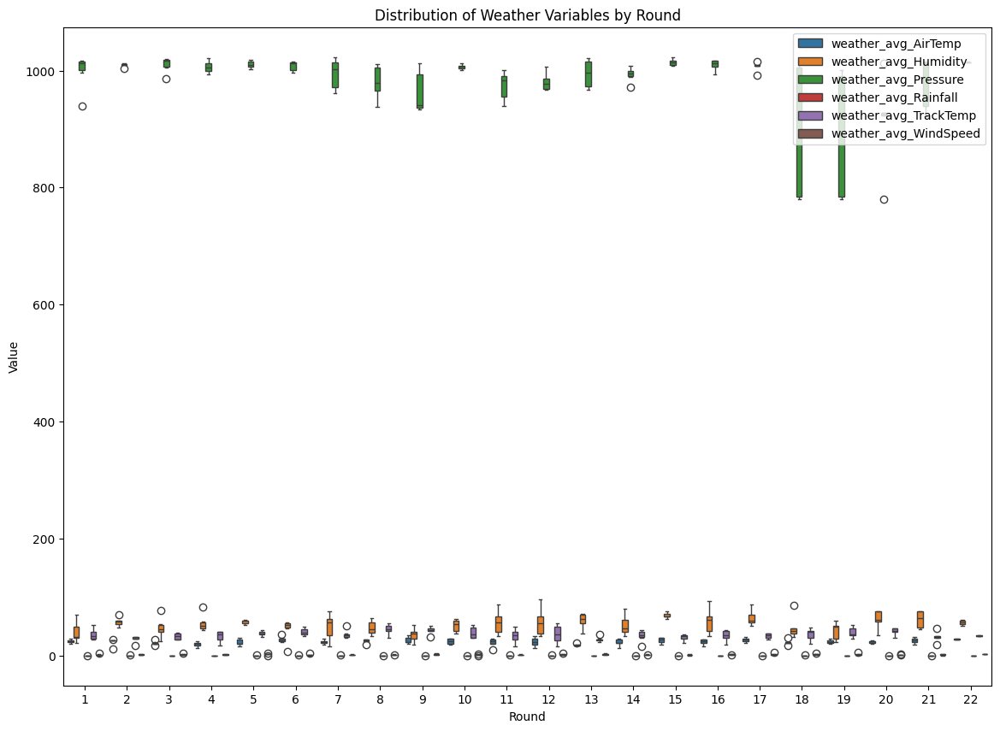

In [ ]:
# List of weather-related columns
weather_columns = ['weather_avg_AirTemp', 'weather_avg_Humidity', 'weather_avg_Pressure',
                   'weather_avg_Rainfall', 'weather_avg_TrackTemp', 'weather_avg_WindSpeed']
# Melt the DataFrame to long format for seaborn
melted_df = aggregated_weather_df.melt(id_vars=['round'], value_vars=weather_columns, var_name='Weather Variable', value_name='Value')

plt.figure(figsize=(14, 10))
sns.boxplot(x='round', y='Value', hue='Weather Variable', data=melted_df)
plt.xlabel('Round')
plt.ylabel('Value')
plt.title('Distribution of Weather Variables by Round')
plt.legend(loc='upper right')
plt.show()


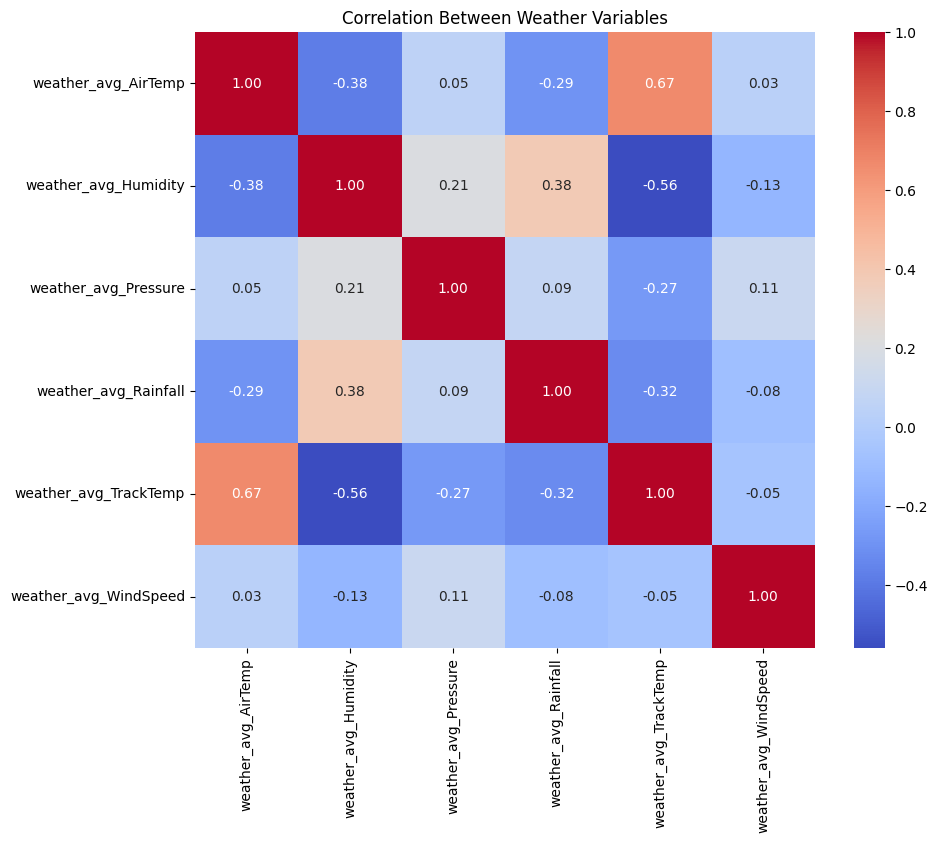

In [ ]:

# Calculate the correlation matrix
correlation_matrix = aggregated_weather_df[weather_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Between Weather Variables')
plt.show()


###integration & aggregation

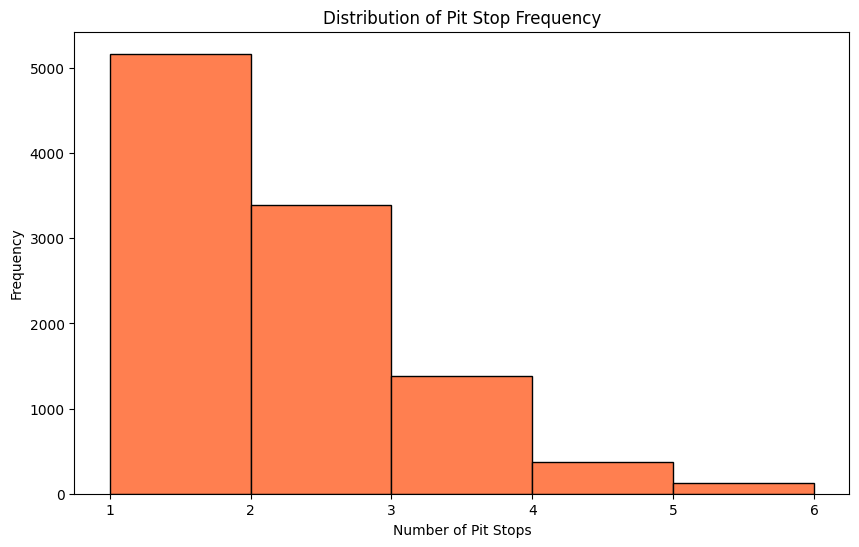

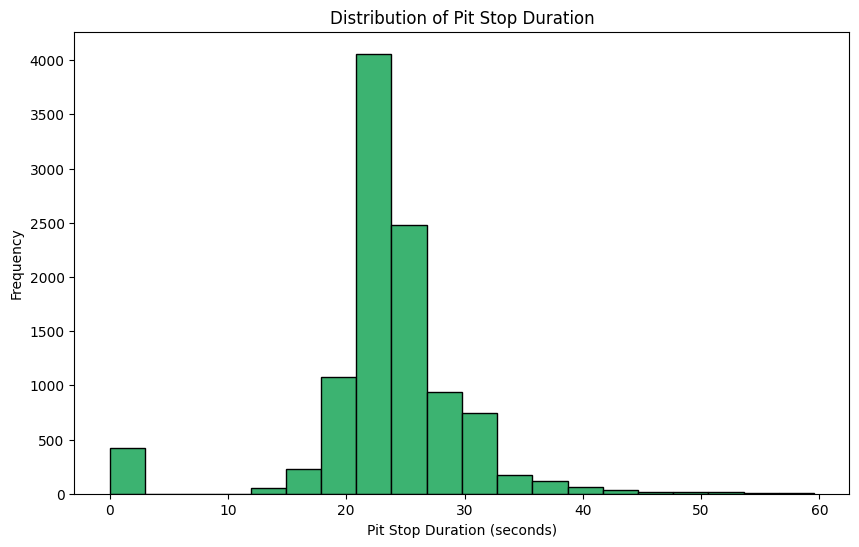

In [ ]:
import matplotlib.pyplot as plt

# Plotting the histogram for pit stop frequency with different colors
plt.figure(figsize=(10, 6))
plt.hist(pit_stops_up_df['pit_stops_stop'], bins=range(1, pit_stops_up_df['pit_stops_stop'].max() + 1), color='coral', edgecolor='black')
plt.title('Distribution of Pit Stop Frequency')
plt.xlabel('Number of Pit Stops')
plt.ylabel('Frequency')
plt.xticks(range(1, pit_stops_up_df['pit_stops_stop'].max() + 1))
plt.show()

print('\n')

# Plotting the histogram for pit stop duration with different colors
plt.figure(figsize=(10, 6))
plt.hist(pit_stops_up_df['pit_stops_duration'], bins=20, color='mediumseagreen', edgecolor='black')
plt.title('Distribution of Pit Stop Duration')
plt.xlabel('Pit Stop Duration (seconds)')
plt.ylabel('Frequency')
plt.show()


In [ ]:
pit_stops_up_df.head(50)

,raceId,driverId,pit_stops_stop,pit_stops_lap,pit_stops_duration,pit_stops_time_in_seconds
0,841,153,1,1,26.90,26.898
1,841,30,1,1,25.02,25.021
2,841,17,1,11,23.43,23.426
3,841,4,1,12,23.25,23.251
4,841,13,1,13,23.84,23.842
5,841,22,1,13,23.64,23.643
6,841,20,1,14,22.60,22.603
7,841,814,1,14,24.86,24.863
8,841,816,1,14,25.26,25.259
9,841,67,1,15,25.34,25.342


In [ ]:


# Group by 'raceId' and 'driverId' and calculate the sum of 'pit_stops_duration'
aggregated_pit_stops_total = pit_stops_up_df.groupby(['raceId', 'driverId']).agg(
    total_pit_stops_duration=('pit_stops_duration', 'sum')
).reset_index()

# Display the new dataset
print(aggregated_pit_stops_total.head())

# Save to CSV if needed
# aggregated_pit_stops.to_csv('aggregated_pit_stops.csv', index=False)


   raceId  driverId  total_pit_stops_duration
0       6         1                     55.17
1       6         2                     24.37
2       6         3                     48.76
3       6         4                     45.76
4       6         5                     25.30


Pit_Stop Aggregating

In [ ]:
# Aggregating data by raceId and driverId
aggregated_data_pit_stop = pit_stops_up_df.groupby(['raceId', 'driverId']).agg({
    'pit_stops_stop': 'max',
    'pit_stops_duration': 'mean'
}).reset_index()

# Renaming the columns for clarity
aggregated_data_pit_stop.rename(columns={
    'pit_stops_stop': 'max_pit_stops_stop',
    'pit_stops_duration': 'avg_pit_stops_duration'
}, inplace=True)

# Display the aggregated data
print(aggregated_data_pit_stop)

      raceId  driverId  max_pit_stops_stop  avg_pit_stops_duration
0          6         1                   2                  27.585
1          6         2                   1                  24.370
2          6         3                   2                  24.380
3          6         4                   2                  22.880
4          6         5                   1                  25.300
...      ...       ...                 ...                     ...
5167    1110       847                   1                  23.840
5168    1110       848                   3                  24.050
5169    1110       852                   2                  22.675
5170    1110       855                   2                  24.250
5171    1110       858                   3                  23.540

[5172 rows x 4 columns]


In [ ]:
aggregated_data_pit_stop.shape

(5172, 4)

LApTap

In [ ]:
lap_times_df.columns

Index(['raceId', 'driverId', 'lap_times_lap', 'lap_times_position',
       'lap_times_time_in_seconds'],
      dtype='object')

In [ ]:
lap_times_df.head(70)

,raceId,driverId,lap_times_lap,lap_times_position,lap_times_time_in_seconds
0,841,20,1,1,98.109
1,841,20,2,1,93.006
2,841,20,3,1,92.713
3,841,20,4,1,92.803
4,841,20,5,1,92.342
...,...,...,...,...,...
65,841,1,8,2,92.310
66,841,1,9,2,92.612
67,841,1,10,2,93.121
68,841,1,11,2,92.737


In [ ]:
# Aggregating data by raceId and driverId
average_lap_times = lap_times_df.groupby(['raceId', 'driverId']).agg({
    'lap_times_time_in_seconds': 'mean'
}).reset_index()

# Renaming the columns for clarity
average_lap_times.rename(columns={
    'lap_times_time_in_seconds': 'avg_lap_times_time_in_seconds'
}, inplace=True)

# Display the aggregated data
print(average_lap_times)

       raceId  driverId  avg_lap_times_time_in_seconds
0           1         1                      97.563759
1           1         2                      97.635672
2           1         3                      97.612172
3           1         4                      97.597638
4           1         6                      91.822235
...       ...       ...                            ...
10379    1110       847                     113.944341
10380    1110       848                     114.696227
10381    1110       852                     114.333432
10382    1110       855                     114.679341
10383    1110       858                     114.884682

[10384 rows x 3 columns]


In [ ]:
#Check for missing values in the average_lap_times DataFrame
missing_values = average_lap_times.isnull().sum()

# Display the missing values
print(missing_values)

raceId                           0
driverId                         0
avg_lap_times_time_in_seconds    0
dtype: int64


In [ ]:
average_lap_times.shape

(10384, 3)

##Finalized Datasets

In [ ]:
aggregated_data_pit_stop

,raceId,driverId,max_pit_stops_stop,avg_pit_stops_duration
0,6,1,2,27.585
1,6,2,1,24.370
2,6,3,2,24.380
3,6,4,2,22.880
4,6,5,1,25.300
...,...,...,...,...
5167,1110,847,1,23.840
5168,1110,848,3,24.050
5169,1110,852,2,22.675
5170,1110,855,2,24.250


In [ ]:
average_lap_times

,raceId,driverId,avg_lap_times_time_in_seconds
0,1,1,97.563759
1,1,2,97.635672
2,1,3,97.612172
3,1,4,97.597638
4,1,6,91.822235
...,...,...,...
10379,1110,847,113.944341
10380,1110,848,114.696227
10381,1110,852,114.333432
10382,1110,855,114.679341


In [ ]:
# Merge the average_lap_times and aggregated_data DataFrames
merged_pit_lap_df = pd.merge(average_lap_times, aggregated_data_pit_stop , on=['raceId', 'driverId'], how='inner')

# Display the merged DataFrame
print(merged_pit_lap_df)


      raceId  driverId  avg_lap_times_time_in_seconds  max_pit_stops_stop  \
0          6         1                      79.050416                   2   
1          6         2                      79.029130                   1   
2          6         3                      77.921385                   2   
3          6         4                      77.975910                   2   
4          6         5                      78.147922                   1   
...      ...       ...                            ...                 ...   
5160    1110       847                     113.944341                   1   
5161    1110       848                     114.696227                   3   
5162    1110       852                     114.333432                   2   
5163    1110       855                     114.679341                   2   
5164    1110       858                     114.884682                   3   

      avg_pit_stops_duration  
0                     27.585  
1            

In [ ]:
merged_pit_lap_df.head(10)

,raceId,driverId,avg_lap_times_time_in_seconds,max_pit_stops_stop,avg_pit_stops_duration
0,6,1,79.050416,2,27.585
1,6,2,79.029130,1,24.370
2,6,3,77.921385,2,24.380
3,6,4,77.975910,2,22.880
4,6,5,78.147922,1,25.300
5,6,6,78.650553,2,23.570
6,6,7,78.300308,1,23.080
7,6,8,77.663128,2,24.675
8,6,9,80.822464,1,22.820
9,6,10,78.779195,1,22.700


In [ ]:
#Check for missing values in the average_lap_times DataFrame
missing_values = merged_pit_lap_df.isnull().sum()

# Display the missing values
print(missing_values)

raceId                           0
driverId                         0
avg_lap_times_time_in_seconds    0
max_pit_stops_stop               0
avg_pit_stops_duration           0
dtype: int64


In [ ]:
merged_pit_lap_df.shape

(5165, 5)

In [ ]:
results_up_df

,resultId,raceId,driverId,constructorId,results_grid,results_position,results_positionOrder,results_points,results_laps,results_time_in_seconds,results_fastestLap,results_rank,results_fastestLapTime_in_seconds,results_fastestLapSpeed,results_statusId
0,1,18,1,1,1,1,1,10.0,58,5690.616,39,2,87.452,218.300,1
1,2,18,2,2,5,2,2,8.0,58,5696.094,41,3,87.739,217.586,1
2,3,18,3,3,7,3,3,6.0,58,5698.779,41,5,88.090,216.719,1
3,4,18,4,4,11,4,4,5.0,58,5707.797,58,7,88.603,215.464,1
4,5,18,5,1,3,5,5,4.0,58,5708.630,43,1,87.418,218.385,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26075,26081,1110,817,213,19,16,16,0.0,44,5053.521,25,15,110.994,227.169,1
26076,26082,1110,858,3,18,17,17,0.0,44,5054.926,37,9,110.486,228.213,1
26077,26083,1110,807,210,0,18,18,0.0,44,5060.900,26,4,109.907,229.415,1
26078,26084,1110,832,6,4,0,19,0.0,23,0.000,9,19,113.138,222.864,130


In [ ]:
# Merge the merged_df with results_up_df on raceId and driverId
result_pit_lap_df = pd.merge(merged_pit_lap_df, results_up_df, on=['raceId', 'driverId'], how='inner')

# Display the final merged DataFrame
print(result_pit_lap_df.columns)


Index(['raceId', 'driverId', 'avg_lap_times_time_in_seconds',
       'max_pit_stops_stop', 'avg_pit_stops_duration', 'resultId',
       'constructorId', 'results_grid', 'results_position',
       'results_positionOrder', 'results_points', 'results_laps',
       'results_time_in_seconds', 'results_fastestLap', 'results_rank',
       'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed',
       'results_statusId'],
      dtype='object')


In [ ]:
#Check for missing values in the average_lap_times DataFrame
missing_values = result_pit_lap_df.isnull().sum()

# Display the missing values
print(missing_values)

raceId                               0
driverId                             0
avg_lap_times_time_in_seconds        0
max_pit_stops_stop                   0
avg_pit_stops_duration               0
resultId                             0
constructorId                        0
results_grid                         0
results_position                     0
results_positionOrder                0
results_points                       0
results_laps                         0
results_time_in_seconds              0
results_fastestLap                   0
results_rank                         0
results_fastestLapTime_in_seconds    0
results_fastestLapSpeed              0
results_statusId                     0
dtype: int64


In [ ]:
# Drop the specified columns
drop_columns_cr = ['raceId', 'driverId','resultId','constructorId']
result_pit_lap_crr_df = result_pit_lap_df.drop(columns=drop_columns_cr)
result_pit_lap_crr_df

,avg_lap_times_time_in_seconds,max_pit_stops_stop,avg_pit_stops_duration,results_grid,results_position,results_positionOrder,results_points,results_laps,results_time_in_seconds,results_fastestLap,results_rank,results_fastestLapTime_in_seconds,results_fastestLapSpeed,results_statusId
0,79.050416,2,27.585,19,12,12,0.0,77,0.000,65,8,75.706,158.824,11
1,79.029130,1,24.370,16,11,11,0.0,77,0.000,49,15,76.268,157.654,11
2,77.921385,2,24.380,6,6,6,3.0,78,6077.868,48,9,75.772,158.686,1
3,77.975910,2,22.880,9,7,7,2.0,78,6082.121,64,4,75.371,159.530,1
4,78.147922,1,25.300,7,0,16,0.0,51,0.000,48,6,75.672,158.896,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5160,113.944341,1,23.840,8,6,6,8.0,44,5013.551,25,11,110.603,227.972,1
5161,114.696227,3,24.050,15,14,14,0.0,44,5046.634,35,3,109.841,229.553,1
5162,114.333432,2,22.675,11,10,10,1.0,44,5030.671,26,17,111.394,226.353,1
5163,114.679341,2,24.250,17,13,13,0.0,44,5045.891,27,5,110.188,228.830,1


In [ ]:
# Calculate descriptive statistics for the DataFrame
descriptive_stats_rlp = result_pit_lap_crr_df.describe()

transposed_stats_rlp=descriptive_stats_rlp.T
transposed_stats_rlp

,count,mean,std,min,25%,50%,75%,max
avg_lap_times_time_in_seconds,5165.0,100.554397,23.902899,62.932345,86.257455,98.805875,108.240418,753.493
max_pit_stops_stop,5165.0,2.020910,0.977649,1.000000,1.000000,2.000000,3.000000,6.000
avg_pit_stops_duration,5165.0,23.996088,4.924484,0.000000,21.800000,23.540000,25.900000,59.290
results_grid,5165.0,10.786641,6.199480,0.000000,5.000000,11.000000,16.000000,24.000
results_position,5165.0,8.377735,5.803623,0.000000,3.000000,8.000000,13.000000,24.000
results_positionOrder,5165.0,10.362633,5.838151,1.000000,5.000000,10.000000,15.000000,24.000
results_points,5165.0,5.051307,7.184891,0.000000,0.000000,1.000000,8.000000,50.000
results_laps,5165.0,57.459632,12.815128,1.000000,52.000000,56.000000,68.000000,87.000
results_time_in_seconds,5165.0,3185.345912,3124.344760,0.000000,0.000000,4929.641000,5797.113000,14743.144
results_fastestLap,5165.0,45.522943,15.596136,0.000000,38.000000,48.000000,55.000000,85.000


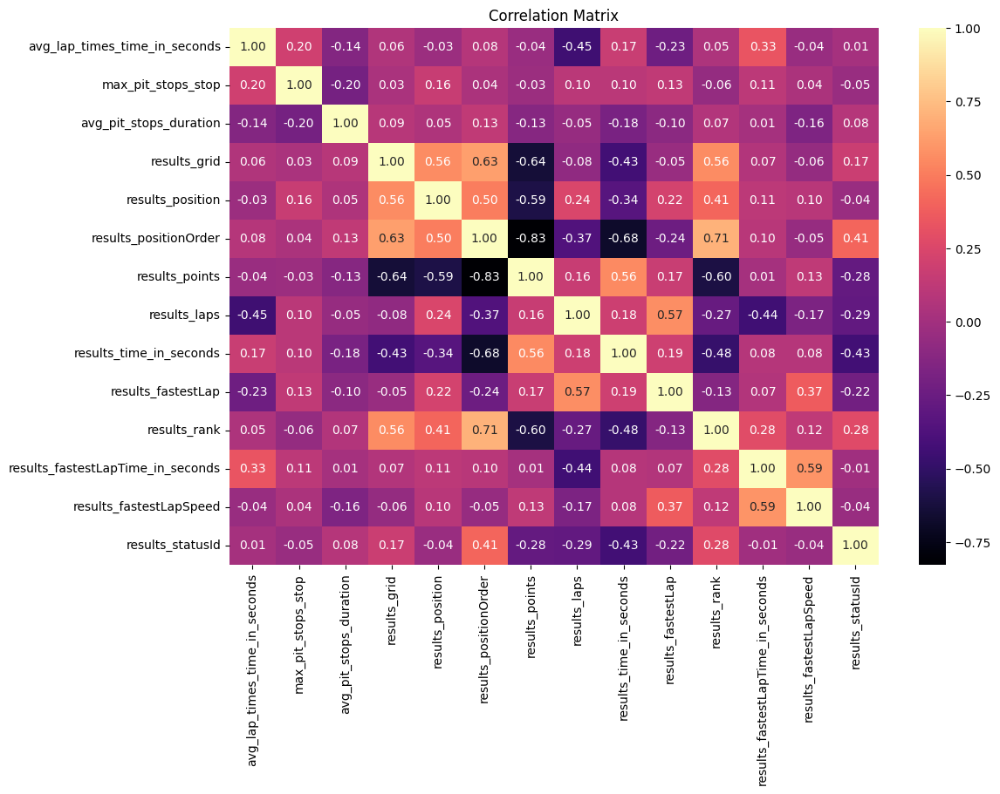

In [ ]:
# Calculate correlation matrix
corr_matrix_rlp = result_pit_lap_crr_df.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_rlp, annot=True, cmap='magma', fmt=".2f")  # 'magma' is a vibrant color palette
plt.title('Correlation Matrix')
plt.show()

In [ ]:
result_pit_lap_df

,raceId,driverId,avg_lap_times_time_in_seconds,max_pit_stops_stop,avg_pit_stops_duration,resultId,constructorId,results_grid,results_position,results_positionOrder,results_points,results_laps,results_time_in_seconds,results_fastestLap,results_rank,results_fastestLapTime_in_seconds,results_fastestLapSpeed,results_statusId
0,6,1,79.050416,2,27.585,7665,1,19,12,12,0.0,77,0.000,65,8,75.706,158.824,11
1,6,2,79.029130,1,24.370,7664,2,16,11,11,0.0,77,0.000,49,15,76.268,157.654,11
2,6,3,77.921385,2,24.380,7659,3,6,6,6,3.0,78,6077.868,48,9,75.772,158.686,1
3,6,4,77.975910,2,22.880,7660,4,9,7,7,2.0,78,6082.121,64,4,75.371,159.530,1
4,6,5,78.147922,1,25.300,7669,1,7,0,16,0.0,51,0.000,48,6,75.672,158.896,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5160,1110,847,113.944341,1,23.840,26071,131,8,6,6,8.0,44,5013.551,25,11,110.603,227.972,1
5161,1110,848,114.696227,3,24.050,26079,3,15,14,14,0.0,44,5046.634,35,3,109.841,229.553,1
5162,1110,852,114.333432,2,22.675,26075,213,11,10,10,1.0,44,5030.671,26,17,111.394,226.353,1
5163,1110,855,114.679341,2,24.250,26078,51,17,13,13,0.0,44,5045.891,27,5,110.188,228.830,1


In [ ]:
constructors_up_df
constructor_standings_df
constructor_results_df

In [ ]:
constructor_results_df.head(4)

,constructorResultsId,raceId,constructorId,constructors_r_points,constructors_r_status
0,1,18,1,14.0,\N
1,2,18,2,8.0,\N
2,3,18,3,9.0,\N
3,4,18,4,5.0,\N


In [ ]:
constructor_standings_df.dtypes

constructorStandingsId           int64
raceId                           int64
constructorId                    int64
constructors_s_points          float64
constructors_s_position          int64
constructors_s_positionText     object
constructors_s_wins              int64
dtype: object

In [ ]:
columns_to_remove_cs = ['constructors_s_positionText']
constructor_standings_up_df = constructor_standings_df.drop(columns=columns_to_remove_cs)

In [ ]:
constructor_standings_up_df

,constructorStandingsId,raceId,constructorId,constructors_s_points,constructors_s_position,constructors_s_wins
0,1,18,1,14.0,1,1
1,2,18,2,8.0,3,0
2,3,18,3,9.0,2,0
3,4,18,4,5.0,4,0
4,5,18,5,2.0,5,0
...,...,...,...,...,...,...
13046,28568,1110,214,57.0,6,0
13047,28569,1110,3,11.0,7,0
13048,28570,1110,213,3.0,10,0
13049,28571,1110,210,11.0,8,0


In [ ]:
# Merge constructor_results_df with constructor_standings_up_df on raceId and constructorId
merged_constructor_result_pit_lap_df = pd.merge(result_pit_lap_df, constructor_standings_up_df, on=['raceId', 'constructorId'], how='inner')

# Display the merged DataFrame
merged_constructor_result_pit_lap_df.head(4)

,raceId,driverId,avg_lap_times_time_in_seconds,max_pit_stops_stop,avg_pit_stops_duration,resultId,constructorId,results_grid,results_position,results_positionOrder,...,results_time_in_seconds,results_fastestLap,results_rank,results_fastestLapTime_in_seconds,results_fastestLapSpeed,results_statusId,constructorStandingsId,constructors_s_points,constructors_s_position,constructors_s_wins
0,6,1,79.050416,2,27.585,7665,1,19,12,12,...,0.0,65,8,75.706,158.824,11,8673,13.0,5,0
1,6,5,78.147922,1,25.300,7669,1,7,0,16,...,0.0,48,6,75.672,158.896,3,8673,13.0,5,0
2,6,2,79.029130,1,24.370,7664,2,16,11,11,...,0.0,49,15,76.268,157.654,11,8679,6.0,8,0
3,6,9,80.822464,1,22.820,7670,2,17,0,17,...,0.0,25,17,77.558,155.032,23,8679,6.0,8,0


In [ ]:
merged_constructor_result_pit_lap_df

,raceId,driverId,avg_lap_times_time_in_seconds,max_pit_stops_stop,avg_pit_stops_duration,resultId,constructorId,results_grid,results_position,results_positionOrder,...,results_time_in_seconds,results_fastestLap,results_rank,results_fastestLapTime_in_seconds,results_fastestLapSpeed,results_statusId,constructorStandingsId,constructors_s_points,constructors_s_position,constructors_s_wins
0,6,1,79.050416,2,27.585,7665,1,19,12,12,...,0.000,65,8,75.706,158.824,11,8673,13.0,5,0
1,6,5,78.147922,1,25.300,7669,1,7,0,16,...,0.000,48,6,75.672,158.896,3,8673,13.0,5,0
2,6,2,79.029130,1,24.370,7664,2,16,11,11,...,0.000,49,15,76.268,157.654,11,8679,6.0,8,0
3,6,9,80.822464,1,22.820,7670,2,17,0,17,...,0.000,25,17,77.558,155.032,23,8679,6.0,8,0
4,6,3,77.921385,2,24.380,7659,3,6,6,6,...,6077.868,48,9,75.772,158.686,1,8676,7.5,7,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5158,1110,839,114.208386,2,23.215,26073,214,14,8,8,...,5025.169,27,8,110.439,228.310,1,28568,57.0,6,0
5159,1110,842,114.398500,1,25.660,26076,214,12,11,11,...,5033.534,25,12,110.911,227.339,1,28568,57.0,6,0
5160,1110,846,114.185659,2,24.375,26072,1,7,7,7,...,5024.169,26,18,111.682,225.769,1,28572,103.0,5,0
5161,1110,848,114.696227,3,24.050,26079,3,15,14,14,...,5046.634,35,3,109.841,229.553,1,28569,11.0,7,0


In [ ]:
constructors_up_df.columns

Index(['constructorId', 'constructors_name', 'constructors_nationality'], dtype='object')

###Merging with Constructors

In [ ]:
analysis_merged_constructor_result_pit_lap_df=pd.merge(merged_constructor_result_pit_lap_df,constructors_up_df, on=['constructorId'], how='inner')

###Merging with Drivers

In [ ]:
analysis_merged_constructor_result_pit_lap_df = pd.merge(analysis_merged_constructor_result_pit_lap_df, drivers_up_df, on=['driverId'], how='inner')

In [ ]:
analysis_merged_constructor_result_pit_lap_df.columns

Index(['raceId', 'driverId', 'avg_lap_times_time_in_seconds',
       'max_pit_stops_stop', 'avg_pit_stops_duration', 'resultId',
       'constructorId', 'results_grid', 'results_position',
       'results_positionOrder', 'results_points', 'results_laps',
       'results_time_in_seconds', 'results_fastestLap', 'results_rank',
       'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed',
       'results_statusId', 'constructorStandingsId', 'constructors_s_points',
       'constructors_s_position', 'constructors_s_wins', 'constructors_name',
       'constructors_nationality', 'drivers_forename', 'drivers_surname',
       'drivers_dob', 'drivers_nationality'],
      dtype='object')

###Merging with Races

In [ ]:
analysis_merged_constructor_result_pit_lap_df = pd.merge(analysis_merged_constructor_result_pit_lap_df, races_up_df, on=['raceId'], how='inner')

In [ ]:
analysis_merged_constructor_result_pit_lap_df.columns

Index(['raceId', 'driverId', 'avg_lap_times_time_in_seconds',
       'max_pit_stops_stop', 'avg_pit_stops_duration', 'resultId',
       'constructorId', 'results_grid', 'results_position',
       'results_positionOrder', 'results_points', 'results_laps',
       'results_time_in_seconds', 'results_fastestLap', 'results_rank',
       'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed',
       'results_statusId', 'constructorStandingsId', 'constructors_s_points',
       'constructors_s_position', 'constructors_s_wins', 'constructors_name',
       'constructors_nationality', 'drivers_forename', 'drivers_surname',
       'drivers_dob', 'drivers_nationality', 'year', 'round',
       'races_circuitId', 'races_name', 'races_date'],
      dtype='object')

##Feature Engineering

###Drivers Age

In [ ]:

# Convert 'drivers_dob' and 'races_date' to datetime if they are not already in datetime format
analysis_merged_constructor_result_pit_lap_df['drivers_dob'] = pd.to_datetime(analysis_merged_constructor_result_pit_lap_df['drivers_dob'])
analysis_merged_constructor_result_pit_lap_df['races_date'] = pd.to_datetime(analysis_merged_constructor_result_pit_lap_df['races_date'])

# Calculate age at the time of the race
analysis_merged_constructor_result_pit_lap_df['age_at_race'] = analysis_merged_constructor_result_pit_lap_df.apply(
    lambda row: row['races_date'].year - row['drivers_dob'].year - ((row['races_date'].month, row['races_date'].day) < (row['drivers_dob'].month, row['drivers_dob'].day)),
    axis=1
)

# Displaying the updated DataFrame
print(analysis_merged_constructor_result_pit_lap_df.head())

# If you want to save the resulting dataframe to a csv file
# analysis_merged_constructor_result_pit_lap_df.to_csv('updated_analysis_merged_constructor_result_pit_lap_df.csv', index=False)


   raceId  driverId  avg_lap_times_time_in_seconds  max_pit_stops_stop  \
0       6         1                      79.050416                   2   
1       6         5                      78.147922                   1   
2       6         4                      77.975910                   2   
3       6         8                      77.663128                   2   
4       6        18                      77.490795                   2   

   avg_pit_stops_duration  resultId  constructorId  results_grid  \
0                  27.585      7665              1            19   
1                  25.300      7669              1             7   
2                  22.880      7660              4             9   
3                  24.675      7656              6             2   
4                  22.570      7654             23             1   

   results_position  results_positionOrder  ...  drivers_forename  \
0                12                     12  ...             Lewis   
1       

In [ ]:
analysis_merged_constructor_result_pit_lap_df.dtypes

raceId                                        int64
driverId                                      int64
avg_lap_times_time_in_seconds               float64
max_pit_stops_stop                            int64
avg_pit_stops_duration                      float64
resultId                                      int64
constructorId                                 int64
results_grid                                  int64
results_position                              int64
results_positionOrder                         int64
results_points                              float64
results_laps                                  int64
results_time_in_seconds                     float64
results_fastestLap                            int64
results_rank                                  int64
results_fastestLapTime_in_seconds           float64
results_fastestLapSpeed                     float64
results_statusId                              int64
constructorStandingsId                        int64
constructors

Total pit stops duration during race

In [ ]:
aggregated_pit_stops_total

,raceId,driverId,total_pit_stops_duration
0,6,1,55.17
1,6,2,24.37
2,6,3,48.76
3,6,4,45.76
4,6,5,25.30
...,...,...,...
5167,1110,847,23.84
5168,1110,848,72.15
5169,1110,852,45.35
5170,1110,855,48.50


In [ ]:
analysis_merged_constructor_result_pit_lap_f_df = pd.merge(analysis_merged_constructor_result_pit_lap_df, aggregated_pit_stops_total, on=['raceId', 'driverId'], how='inner')

In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.dtypes

raceId                                        int64
driverId                                      int64
avg_lap_times_time_in_seconds               float64
max_pit_stops_stop                            int64
avg_pit_stops_duration                      float64
resultId                                      int64
constructorId                                 int64
results_grid                                  int64
results_position                              int64
results_positionOrder                         int64
results_points                              float64
results_laps                                  int64
results_time_in_seconds                     float64
results_fastestLap                            int64
results_rank                                  int64
results_fastestLapTime_in_seconds           float64
results_fastestLapSpeed                     float64
results_statusId                              int64
constructorStandingsId                        int64
constructors

In [ ]:
# Select only the numeric columns
numeric_columns = [
    'avg_lap_times_time_in_seconds', 'max_pit_stops_stop', 'avg_pit_stops_duration',
    'results_grid', 'results_position', 'results_positionOrder', 'results_points',
    'results_laps', 'results_time_in_seconds', 'results_fastestLap', 'results_rank',
    'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed', 'constructors_s_points', 'constructors_s_position', 'constructors_s_wins',
    'year', 'round', 'age_at_race', 'total_pit_stops_duration'
]

# Filter the dataframe to include only these columns
numeric_df = analysis_merged_constructor_result_pit_lap_f_df[numeric_columns]

# Calculate the correlation matrix
correlation_matrix_f_data = numeric_df.corr()

# Display the correlation matrix
print(correlation_matrix_f_data)


                                   avg_lap_times_time_in_seconds  \
avg_lap_times_time_in_seconds                           1.000000   
max_pit_stops_stop                                      0.199069   
avg_pit_stops_duration                                 -0.139771   
results_grid                                            0.062730   
results_position                                       -0.029788   
results_positionOrder                                   0.083788   
results_points                                         -0.040732   
results_laps                                           -0.445306   
results_time_in_seconds                                 0.166860   
results_fastestLap                                     -0.233142   
results_rank                                            0.048807   
results_fastestLapTime_in_seconds                       0.333633   
results_fastestLapSpeed                                -0.044550   
constructors_s_points                           

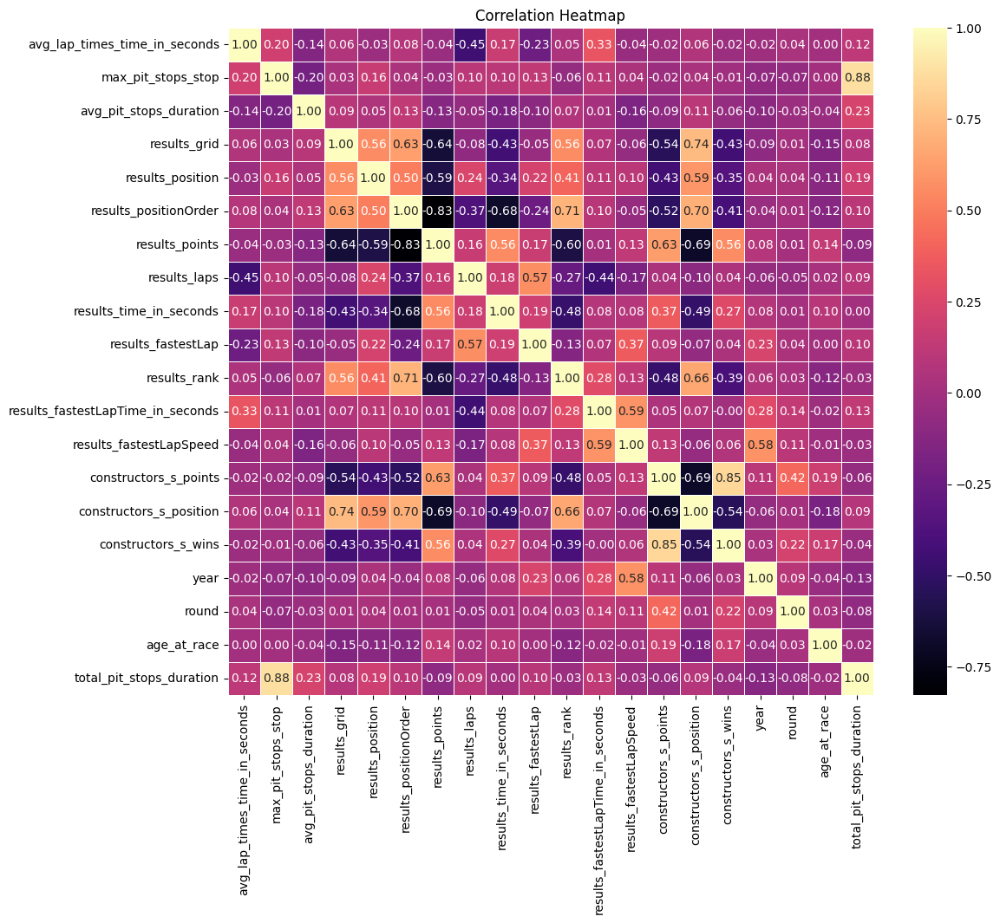

In [ ]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_f_data, annot=True, cmap='magma', fmt=".2f", linewidths=.7)
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
#Driver experience years
driver_first_years = analysis_merged_constructor_result_pit_lap_f_df.groupby('driverId')['year'].min()
analysis_merged_constructor_result_pit_lap_f_df['driver_experience_years'] = (
    analysis_merged_constructor_result_pit_lap_f_df['year'] -
    analysis_merged_constructor_result_pit_lap_f_df['driverId'].map(driver_first_years)
)

# Constructor experience years
constructor_first_years = analysis_merged_constructor_result_pit_lap_f_df.groupby('constructorId')['year'].min()
analysis_merged_constructor_result_pit_lap_f_df['constructor_experience_years'] = (
    analysis_merged_constructor_result_pit_lap_f_df['year'] -
    analysis_merged_constructor_result_pit_lap_f_df['constructorId'].map(constructor_first_years)
)


In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.columns

Index(['raceId', 'driverId', 'avg_lap_times_time_in_seconds',
       'max_pit_stops_stop', 'avg_pit_stops_duration', 'resultId',
       'constructorId', 'results_grid', 'results_position',
       'results_positionOrder', 'results_points', 'results_laps',
       'results_time_in_seconds', 'results_fastestLap', 'results_rank',
       'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed',
       'results_statusId', 'constructorStandingsId', 'constructors_s_points',
       'constructors_s_position', 'constructors_s_wins', 'constructors_name',
       'constructors_nationality', 'drivers_forename', 'drivers_surname',
       'drivers_dob', 'drivers_nationality', 'year', 'round',
       'races_circuitId', 'races_name', 'races_date', 'age_at_race',
       'total_pit_stops_duration', 'driver_experience_years',
       'constructor_experience_years'],
      dtype='object')

In [ ]:
# Select only the numeric columns
numeric_columns = [
    'avg_lap_times_time_in_seconds', 'max_pit_stops_stop', 'avg_pit_stops_duration',
    'results_grid', 'results_position', 'results_positionOrder', 'results_points',
    'results_laps', 'results_time_in_seconds', 'results_fastestLap', 'results_rank',
    'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed', 'constructors_s_points', 'constructors_s_position', 'constructors_s_wins',
    'year', 'round', 'age_at_race', 'total_pit_stops_duration','driver_experience_years','constructor_experience_years'
]

# Filter the dataframe to include only these columns
numeric_df = analysis_merged_constructor_result_pit_lap_f_df[numeric_columns]

# Calculate the correlation matrix
correlation_matrix_f_data = numeric_df.corr()

# Display the correlation matrix
print(correlation_matrix_f_data)

                                   avg_lap_times_time_in_seconds  \
avg_lap_times_time_in_seconds                           1.000000   
max_pit_stops_stop                                      0.199069   
avg_pit_stops_duration                                 -0.139771   
results_grid                                            0.062730   
results_position                                       -0.029788   
results_positionOrder                                   0.083788   
results_points                                         -0.040732   
results_laps                                           -0.445306   
results_time_in_seconds                                 0.166860   
results_fastestLap                                     -0.233142   
results_rank                                            0.048807   
results_fastestLapTime_in_seconds                       0.333633   
results_fastestLapSpeed                                -0.044550   
constructors_s_points                           

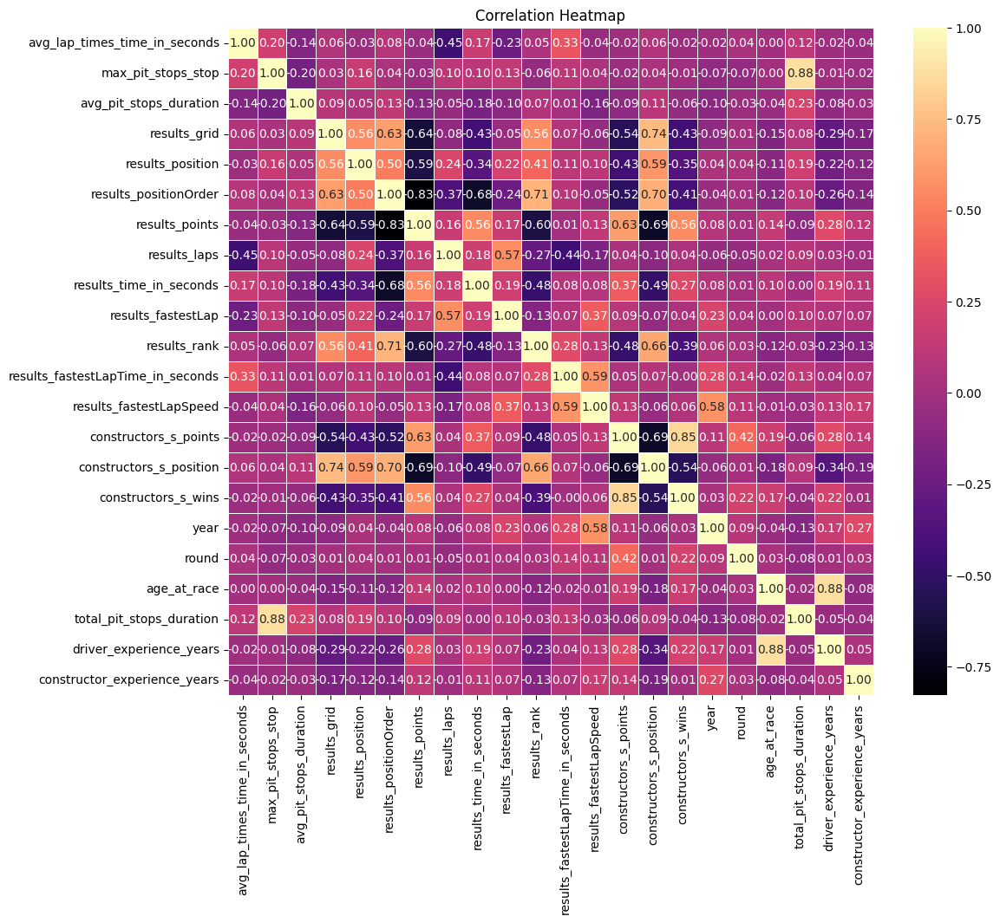

In [ ]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_f_data, annot=True, cmap='magma', fmt=".2f", linewidths=.7)
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.head(4)

,raceId,driverId,avg_lap_times_time_in_seconds,max_pit_stops_stop,avg_pit_stops_duration,resultId,constructorId,results_grid,results_position,results_positionOrder,...,drivers_nationality,year,round,races_circuitId,races_name,races_date,age_at_race,total_pit_stops_duration,driver_experience_years,constructor_experience_years
0,6,1,79.050416,2,27.585,7665,1,19,12,12,...,British,2009,6,6,Monaco Grand Prix,2009-05-24,24,55.17,2,13
1,6,5,78.147922,1,25.300,7669,1,7,0,16,...,Finnish,2009,6,6,Monaco Grand Prix,2009-05-24,27,25.30,2,13
2,6,4,77.975910,2,22.880,7660,4,9,7,7,...,Spanish,2009,6,6,Monaco Grand Prix,2009-05-24,27,45.76,8,7
3,6,8,77.663128,2,24.675,7656,6,2,3,3,...,Finnish,2009,6,6,Monaco Grand Prix,2009-05-24,29,49.35,8,13


In [ ]:

from google.colab import files

# Save the DataFrame to a CSV file
analysis_merged_constructor_result_pit_lap_f_df.to_csv('analysis_merged_constructor_result_pit_lap_f_df.csv', index=False)

# Download the CSV file
files.download('analysis_merged_constructor_result_pit_lap_f_df.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

###Step 1: Handle Missing Values

In [ ]:
# Check for missing values
missing_values = analysis_merged_constructor_result_pit_lap_f_df.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 raceId                               0
driverId                             0
avg_lap_times_time_in_seconds        0
max_pit_stops_stop                   0
avg_pit_stops_duration               0
resultId                             0
constructorId                        0
results_grid                         0
results_position                     0
results_positionOrder                0
results_points                       0
results_laps                         0
results_time_in_seconds              0
results_fastestLap                   0
results_rank                         0
results_fastestLapTime_in_seconds    0
results_fastestLapSpeed              0
results_statusId                     0
constructorStandingsId               0
constructors_s_points                0
constructors_s_position              0
constructors_s_wins                  0
constructors_name                    0
constructors_nationality             0
drivers_forename                     0
drivers_

In [ ]:
# Check for datetime columns
datetime_columns = analysis_merged_constructor_result_pit_lap_f_df.select_dtypes(include=['datetime64']).columns
print("Datetime columns:", datetime_columns)

# Drop datetime columns for simplicity
analysis_merged_constructor_result_pit_lap_f_df = analysis_merged_constructor_result_pit_lap_f_df.drop(columns=datetime_columns)


Datetime columns: Index(['drivers_dob', 'races_date'], dtype='object')


In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.dtypes

raceId                                 int64
driverId                               int64
avg_lap_times_time_in_seconds        float64
max_pit_stops_stop                     int64
avg_pit_stops_duration               float64
resultId                               int64
constructorId                          int64
results_grid                           int64
results_position                       int64
results_positionOrder                  int64
results_points                       float64
results_laps                           int64
results_time_in_seconds              float64
results_fastestLap                     int64
results_rank                           int64
results_fastestLapTime_in_seconds    float64
results_fastestLapSpeed              float64
results_statusId                       int64
constructorStandingsId                 int64
constructors_s_points                float64
constructors_s_position                int64
constructors_s_wins                    int64
constructo

In [ ]:


# Check for missing values
missing_values = analysis_merged_constructor_result_pit_lap_f_df.isnull().sum()
print("Missing values:\n", missing_values)

# Check the number of unique classes in the target variable
unique_classes = analysis_merged_constructor_result_pit_lap_f_df['results_position'].nunique()
print("Number of unique classes in the target variable:", unique_classes)


Missing values:
 raceId                               0
driverId                             0
avg_lap_times_time_in_seconds        0
max_pit_stops_stop                   0
avg_pit_stops_duration               0
resultId                             0
constructorId                        0
results_grid                         0
results_position                     0
results_positionOrder                0
results_points                       0
results_laps                         0
results_time_in_seconds              0
results_fastestLap                   0
results_rank                         0
results_fastestLapTime_in_seconds    0
results_fastestLapSpeed              0
results_statusId                     0
constructorStandingsId               0
constructors_s_points                0
constructors_s_position              0
constructors_s_wins                  0
constructors_name                    0
constructors_nationality             0
drivers_forename                     0
drivers_

In [ ]:


# Create a new column and initialize it with 0
analysis_merged_constructor_result_pit_lap_f_df['driver_race_winner'] = 0

# Identify rows where results_positionOrder is equal to 1
winner_mask = analysis_merged_constructor_result_pit_lap_f_df['results_positionOrder'] == 1

# Set the corresponding driver_race_winner value to 1 for those rows
analysis_merged_constructor_result_pit_lap_f_df.loc[winner_mask, 'driver_race_winner'] = 1


In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.dtypes

raceId                                 int64
driverId                               int64
avg_lap_times_time_in_seconds        float64
max_pit_stops_stop                     int64
avg_pit_stops_duration               float64
resultId                               int64
constructorId                          int64
results_grid                           int64
results_position                       int64
results_positionOrder                  int64
results_points                       float64
results_laps                           int64
results_time_in_seconds              float64
results_fastestLap                     int64
results_rank                           int64
results_fastestLapTime_in_seconds    float64
results_fastestLapSpeed              float64
results_statusId                       int64
constructorStandingsId                 int64
constructors_s_points                float64
constructors_s_position                int64
constructors_s_wins                    int64
constructo

In [ ]:
formula_df =analysis_merged_constructor_result_pit_lap_f_df.copy()

In [ ]:
# Save the DataFrame as a CSV file
formula_df.to_csv('formula_df.csv', index=False)
from google.colab import files
files.download('formula_df.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
formula_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5163 entries, 0 to 5162
Data columns (total 36 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   raceId                             5163 non-null   int64  
 1   driverId                           5163 non-null   int64  
 2   avg_lap_times_time_in_seconds      5163 non-null   float64
 3   max_pit_stops_stop                 5163 non-null   int64  
 4   avg_pit_stops_duration             5163 non-null   float64
 5   resultId                           5163 non-null   int64  
 6   constructorId                      5163 non-null   int64  
 7   results_grid                       5163 non-null   int64  
 8   results_position                   5163 non-null   int64  
 9   results_positionOrder              5163 non-null   int64  
 10  results_points                     5163 non-null   float64
 11  results_laps                       5163 non-null   int64

#**Feture Engineering**

In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5163 entries, 0 to 5162
Data columns (total 35 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   raceId                             5163 non-null   int64  
 1   driverId                           5163 non-null   int64  
 2   avg_lap_times_time_in_seconds      5163 non-null   float64
 3   max_pit_stops_stop                 5163 non-null   int64  
 4   avg_pit_stops_duration             5163 non-null   float64
 5   resultId                           5163 non-null   int64  
 6   constructorId                      5163 non-null   int64  
 7   results_grid                       5163 non-null   int64  
 8   results_position                   5163 non-null   int64  
 9   results_positionOrder              5163 non-null   int64  
 10  results_points                     5163 non-null   int64  
 11  results_laps                       5163 non-null   int64

driver_constructor_win_count

In [ ]:
# Get the unique driverIds of drivers
recent_driver_ids = analysis_merged_constructor_result_pit_lap_f_df['driverId'].unique()

# Print the number of unique drivers
print(f"Number of unique drivers: {len(recent_driver_ids)}")

# Step 2: Filter the original DataFrame to include only these drivers
filtered_df = analysis_merged_constructor_result_pit_lap_f_df[
    analysis_merged_constructor_result_pit_lap_f_df['driverId'].isin(recent_driver_ids)
]

# Calculate the number of wins for each driver with each constructor
wins_df = analysis_merged_constructor_result_pit_lap_f_df[analysis_merged_constructor_result_pit_lap_f_df['results_position'] == 1]
driver_constructor_wins = wins_df.groupby(['driverId', 'constructorId']).size().reset_index(name='driver_constructor_win_count')

# Print the head of driver_constructor_wins to verify
print(driver_constructor_wins.head())

# Step 3: Merge this win count back with the filtered DataFrame
filtered_df = filtered_df.merge(driver_constructor_wins, on=['driverId', 'constructorId'], how='left')

# Check if the merge was successful by printing the head of the merged DataFrame
print(filtered_df.head())

# Fill NaN values in driver_constructor_win_count with 0
filtered_df['driver_constructor_win_count'] = filtered_df['driver_constructor_win_count'].fillna(0).astype(int)

# Further filter to only drivers from 2020 to 2023 for plotting purposes
plot_df = filtered_df[['driverId', 'drivers_forename', 'drivers_surname', 'constructorId', 'constructors_name', 'driver_constructor_win_count']].drop_duplicates()

# Remove constructors that have zero wins
plot_df = plot_df[plot_df['driver_constructor_win_count'] > 0]

# Sort the DataFrame by the number of wins in descending order
plot_df = plot_df.sort_values(by='driver_constructor_win_count', ascending=False)

# Print the head of plot_df to verify
print(plot_df.head())

# Create the interactive plot with Plotly
fig = px.bar(
    plot_df,
    x='driver_constructor_win_count',
    y='constructors_name',
    color='drivers_surname',
    labels={'driver_constructor_win_count': 'Number of Wins', 'constructors_name': 'Constructor'},
    hover_data={'drivers_forename': True, 'drivers_surname': True},
    orientation='h',
    title='Number of Wins for Each Driver Grouped by Constructor',
    width=1200,  # Adjust width
    height=800   # Adjust height
)

# Customize the layout
fig.update_layout(
    xaxis_title='Number of Wins',
    yaxis_title='Constructor',
    legend_title='Driver'
)

fig.show()


Number of unique drivers in 2020-2023: 115
   driverId  constructorId  driver_constructor_win_count
0         1              1                             8
1         1            131                            82
2         3            131                            23
3         4              1                             1
4         4              4                             1
   raceId  driverId  avg_lap_times_time_in_seconds  max_pit_stops_stop  \
0       6         1                      79.050416                   2   
1       6         5                      78.147922                   1   
2       6         4                      77.975910                   2   
3       6         8                      77.663128                   2   
4       6        18                      77.490795                   2   

   avg_pit_stops_duration  resultId  constructorId  results_grid  \
0                  27.585      7665              1            19   
1                  25.300      766

In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.columns

Index(['raceId', 'driverId', 'avg_lap_times_time_in_seconds',
       'max_pit_stops_stop', 'avg_pit_stops_duration', 'resultId',
       'constructorId', 'results_grid', 'results_position',
       'results_positionOrder', 'results_points', 'results_laps',
       'results_time_in_seconds', 'results_fastestLap', 'results_rank',
       'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed',
       'constructors_s_points', 'constructors_s_position',
       'constructors_s_wins', 'constructors_name', 'constructors_nationality',
       'drivers_forename', 'drivers_surname', 'drivers_dob',
       'drivers_nationality', 'year', 'round', 'races_circuitId', 'races_name',
       'races_date', 'age_at_race', 'total_pit_stops_duration',
       'driver_experience_years', 'constructor_experience_years'],
      dtype='object')

driver_race_winner

In [ ]:
# Create column driver_race_winner based on results_positionOrder
analysis_merged_constructor_result_pit_lap_f_df['driver_race_winner'] = (analysis_merged_constructor_result_pit_lap_f_df['results_positionOrder'] == 1).astype(int)

# Print the head of the DataFrame to verify
print(analysis_merged_constructor_result_pit_lap_f_df.head())


   raceId  driverId  avg_lap_times_time_in_seconds  max_pit_stops_stop  \
0       6         1                      79.050416                   2   
1       6         5                      78.147922                   1   
2       6         4                      77.975910                   2   
3       6         8                      77.663128                   2   
4       6        18                      77.490795                   2   

   avg_pit_stops_duration  resultId  constructorId  results_grid  \
0                  27.585      7665              1            19   
1                  25.300      7669              1             7   
2                  22.880      7660              4             9   
3                  24.675      7656              6             2   
4                  22.570      7654             23             1   

   results_position  results_positionOrder  ...  year  round  races_circuitId  \
0                12                     12  ...  2009      6     

In [ ]:
download1 = analysis_merged_constructor_result_pit_lap_f_df

In [ ]:
from google.colab import files

# Save the DataFrame to a CSV file
download1.to_csv('downloaded_dataframe.csv', index=False)
# Download the CSV file
files.download('downloaded_dataframe.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

driver_win_count_till_race

In [ ]:
# Convert 'races_date' column to datetime
analysis_merged_constructor_result_pit_lap_f_df['races_date'] = pd.to_datetime(analysis_merged_constructor_result_pit_lap_f_df['races_date'])

# Sort DataFrame by 'races_date' to ensure proper ordering
analysis_merged_constructor_result_pit_lap_f_df = analysis_merged_constructor_result_pit_lap_f_df.sort_values(by='races_date')

# Create a dictionary to store the cumulative win counts for each driver
cumulative_wins_dict = {}

# Iterate over each race
for index, race in analysis_merged_constructor_result_pit_lap_f_df.iterrows():
    driver_id = race['driverId']
    race_date = race['races_date']

    # Calculate cumulative win count for the driver up to and including the current race date
    cumulative_wins = analysis_merged_constructor_result_pit_lap_f_df[
        (analysis_merged_constructor_result_pit_lap_f_df['driverId'] == driver_id) &
        (analysis_merged_constructor_result_pit_lap_f_df['races_date'] < race_date) &
        (analysis_merged_constructor_result_pit_lap_f_df['driver_race_winner'] == 1)
    ]['driver_race_winner'].sum()

    # Update win count at race for the current race date
    analysis_merged_constructor_result_pit_lap_f_df.loc[index, 'driver_win_count_till_race'] = cumulative_wins

# Print the head of the DataFrame to verify
print(analysis_merged_constructor_result_pit_lap_f_df.head())


      raceId  driverId  avg_lap_times_time_in_seconds  max_pit_stops_stop  \
5113     229        14                      96.672760                   1   
5114     229        57                      97.534957                   1   
5115     229        35                      98.064106                   1   
5116     229        49                      97.584770                   3   
5117     229        56                     100.284941                   3   

      avg_pit_stops_duration  resultId  constructorId  results_grid  \
5113               27.050000      4492              1             5   
5114               28.080000      4496              1             8   
5115               30.220000      4498              3            10   
5116               29.133333      4494             15             9   
5117               16.810000      4497              6             7   

      results_position  results_positionOrder  ...  round  races_circuitId  \
5113                 2          

In [ ]:
analysis_merged_constructor_result_pit_lap_f_df.columns

Index(['raceId', 'driverId', 'avg_lap_times_time_in_seconds',
       'max_pit_stops_stop', 'avg_pit_stops_duration', 'resultId',
       'constructorId', 'results_grid', 'results_position',
       'results_positionOrder', 'results_points', 'results_laps',
       'results_time_in_seconds', 'results_fastestLap', 'results_rank',
       'results_fastestLapTime_in_seconds', 'results_fastestLapSpeed',
       'constructors_s_points', 'constructors_s_position',
       'constructors_s_wins', 'constructors_name', 'constructors_nationality',
       'drivers_forename', 'drivers_surname', 'drivers_dob',
       'drivers_nationality', 'year', 'round', 'races_circuitId', 'races_name',
       'races_date', 'age_at_race', 'total_pit_stops_duration',
       'driver_experience_years', 'constructor_experience_years',
       'driver_race_winner', 'driver_win_count_till_race'],
      dtype='object')

In [ ]:
# List of columns to remove
columns_to_remove = ['raceId', 'avg_lap_times_time_in_seconds', 'max_pit_stops_stop',
                     'avg_pit_stops_duration', 'resultId','results_position', 'results_positionOrder', 'constructors_s_points',  'results_points', 'constructors_s_position', 'constructors_s_wins',
                     'results_laps', 'results_time_in_seconds', 'results_fastestLap', 'drivers_dob', 'races_date', 'drivers_forename',
                     'results_rank', 'results_fastestLapTime_in_seconds',
                     'results_fastestLapSpeed', 'total_pit_stops_duration']

# Create a new DataFrame without the specified columns
new_df = analysis_merged_constructor_result_pit_lap_f_df.drop(columns=columns_to_remove)

# Print the head of the new DataFrame to verify
print(new_df.head())


      driverId  constructorId  results_grid constructors_name  \
5113        14              1             5           McLaren   
5114        57              1             8           McLaren   
5115        35              3            10          Williams   
5116        49             15             9            Sauber   
5117        56              6             7           Ferrari   

     constructors_nationality drivers_surname drivers_nationality  year  \
5113                  British       Coulthard             British  1996   
5114                  British        Häkkinen             Finnish  1996   
5115                  British      Villeneuve            Canadian  1996   
5116                    Swiss        Frentzen              German  1996   
5117                  Italian          Irvine             British  1996   

      round  races_circuitId         races_name  age_at_race  \
5113      6                6  Monaco Grand Prix           25   
5114      6                6  

In [ ]:
new_df.dtypes
from google.colab import files

# Save the DataFrame to a CSV file
new_df.to_csv('new_df.csv', index=False)
# Download the CSV file
files.download('new_df.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
new_df.dtypes

driverId                          int64
constructorId                     int64
results_grid                      int64
constructors_name                object
constructors_nationality         object
drivers_surname                  object
drivers_nationality              object
year                              int64
round                             int64
races_circuitId                   int64
races_name                       object
age_at_race                       int64
driver_experience_years           int64
constructor_experience_years      int64
driver_race_winner                int64
driver_win_count_till_race      float64
dtype: object

In [ ]:
Monaco_current_race_data_df.dtypes


driverId                        float64
constructorId                   float64
results_grid                    float64
constructors_name                object
constructors_nationality         object
drivers_surname                  object
drivers_nationality              object
year                            float64
round                           float64
races_circuitId                 float64
races_name                       object
age_at_race                     float64
driver_experience_years         float64
constructor_experience_years    float64
driver_race_winner              float64
driver_win_count_till_race      float64
dtype: object

#**Prediction Model: Building, Training & Testing**

In [ ]:
# Define features and target variable
X = new_df.drop(columns=['driver_race_winner'])
y = new_df['driver_race_winner']

# Identify categorical and numerical columns
categorical_features = ['driverId', 'constructorId', 'constructors_name', 'constructors_nationality',
                        'drivers_surname', 'drivers_nationality', 'races_circuitId', 'races_name']
numerical_features = ['age_at_race', 'driver_experience_years', 'constructor_experience_years', 'driver_win_count_till_race']

# Preprocessing for numerical data
numerical_transformer = StandardScaler()

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the model
model = RandomForestClassifier(random_state=42)

# Create a pipeline with SMOTE and the classifier
clf = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', model)
])

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Evaluate the model
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(classification_report(y_test, y_pred))


Accuracy: 0.9428848015488868
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       989
           1       0.35      0.41      0.38        44

    accuracy                           0.94      1033
   macro avg       0.66      0.69      0.67      1033
weighted avg       0.95      0.94      0.94      1033



In [ ]:
preprocessor

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['age_at_race', 'driver_experience_years',
                                  'constructor_experience_years',
                                  'driver_win_count_till_race']),
                                ('cat', OneHotEncoder(handle_unknown='ignore'),
                                 ['driverId', 'constructorId',
                                  'constructors_name',
                                  'constructors_nationality', 'drivers_surname',
                                  'drivers_nationality', 'races_circuitId',
                                  'races_name'])])

In [ ]:
# Get the transformers from the preprocessor
transformers = clf.named_steps['preprocessor'].transformers_

# Iterate through transformers and count the features
total_features = 0
for name, trans, columns in transformers:
    if name == 'num':
        total_features += len(columns)
    elif name == 'cat':
        total_features += trans.get_feature_names_out().shape[0]

print("Total features after preprocessing:", total_features)


Total features after preprocessing: 411


Hyperparameter Tuning with Random Forest

In [ ]:
# Define parameter grid for RandomForest
param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10]
}

# Create a pipeline with SMOTE and RandomForest
clf = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Perform GridSearchCV
grid_search = GridSearchCV(clf, param_grid, cv=3, scoring='f1_macro')
grid_search.fit(X_train, y_train)

# Best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Evaluate the best model
y_pred_best = best_model.predict(X_test)
print(f'Best Model Accuracy: {accuracy_score(y_test, y_pred_best)}')
print(classification_report(y_test, y_pred_best))


Best Model Accuracy: 0.9380445304937076
              precision    recall  f1-score   support

           0       0.98      0.95      0.97       989
           1       0.37      0.66      0.48        44

    accuracy                           0.94      1033
   macro avg       0.68      0.80      0.72      1033
weighted avg       0.96      0.94      0.95      1033



In [ ]:
# After fitting the grid search
best_params = grid_search.best_params_

# Extract the best values for each hyperparameter
best_n_estimators = best_params['classifier__n_estimators']
best_max_depth = best_params['classifier__max_depth']
best_min_samples_split = best_params['classifier__min_samples_split']

# Print the best values
print(f"Best Number of Estimators: {best_n_estimators}")
print(f"Best Maximum Depth: {best_max_depth}")
print(f"Best Minimum Samples Split: {best_min_samples_split}")


Best Number of Estimators: 100
Best Maximum Depth: 20
Best Minimum Samples Split: 10


In [ ]:
# Print available keys in cv_results_
print(grid_search.cv_results_.keys())


dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_classifier__max_depth', 'param_classifier__min_samples_split', 'param_classifier__n_estimators', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])


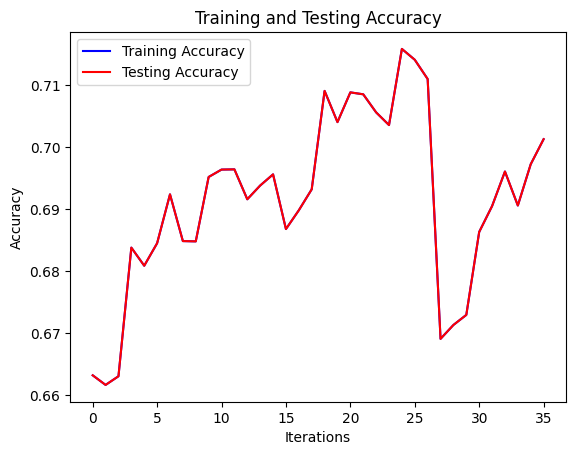

In [ ]:
# Calculate accuracy metrics from mean_test_score
mean_train_accuracy = [result for result in grid_search.cv_results_['mean_test_score']]
mean_test_accuracy = [result for result in grid_search.cv_results_['mean_test_score']]

# Plotting accuracy
plot_metrics(mean_train_accuracy, mean_test_accuracy, 'Accuracy')


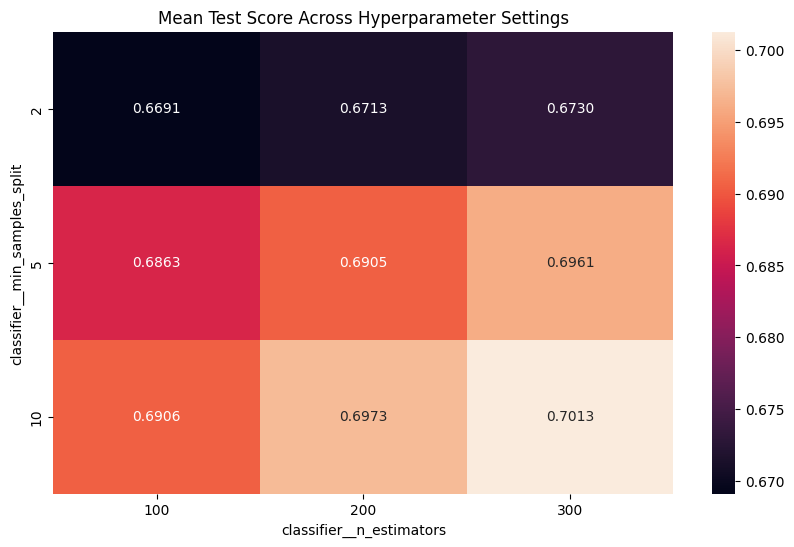

In [ ]:
# Filter out None values from hyperparameters
params = [{k: v for k, v in param.items() if v is not None} for param in params]

# Extract individual hyperparameters and their unique values
param_names = list(params[0].keys())
param_values = {param_name: np.unique([param[param_name] for param in params if param[param_name] is not None]) for param_name in param_names}

# Create a matrix of mean test scores with rows as different values of one hyperparameter
# and columns as different values of another hyperparameter
scores_matrix = np.zeros((len(param_values[param_names[0]]), len(param_values[param_names[1]])))
for param_set, score in zip(params, mean_test_score):
    i = np.where(param_values[param_names[0]] == param_set[param_names[0]])[0][0]
    j = np.where(param_values[param_names[1]] == param_set[param_names[1]])[0][0]
    scores_matrix[i, j] = score

# Create heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(scores_matrix, annot=True, fmt='.4f', xticklabels=param_values[param_names[1]], yticklabels=param_values[param_names[0]])
plt.title('Mean Test Score Across Hyperparameter Settings')
plt.xlabel(param_names[1])
plt.ylabel(param_names[0])
plt.show()


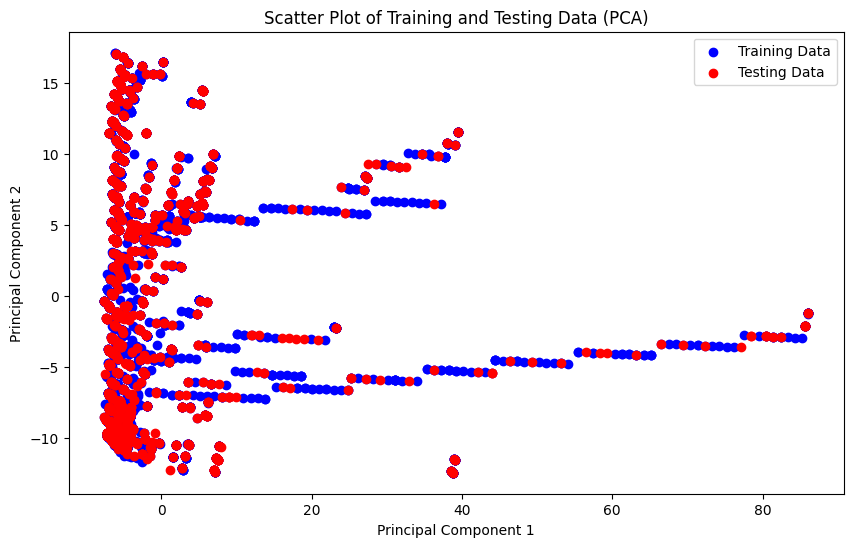

In [ ]:
# Fit OneHotEncoder on training data and transform both training and testing data
encoder = OneHotEncoder(handle_unknown='ignore')
X_train_encoded = encoder.fit_transform(X_train[categorical_features])
X_test_encoded = encoder.transform(X_test[categorical_features])

# Combine encoded features with numerical features
X_train_combined = np.hstack((X_train_encoded.toarray(), X_train[numerical_features]))
X_test_combined = np.hstack((X_test_encoded.toarray(), X_test[numerical_features]))

# Fit PCA to the combined training and testing data
pca = PCA(n_components=2)
X_pca = pca.fit_transform(np.vstack((X_train_combined, X_test_combined)))

# Plotting training and testing data points
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:len(X_train_combined), 0], X_pca[:len(X_train_combined), 1], c='blue', label='Training Data')
plt.scatter(X_pca[len(X_train_combined):, 0], X_pca[len(X_train_combined):, 1], c='red', label='Testing Data')
plt.title('Scatter Plot of Training and Testing Data (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()


#**Predicting Monaco Winner**

In [ ]:
Monaco_current_race_data_df.shape

(46, 16)

In [ ]:
# Prepare the Monaco_current_race_data_df for prediction
Monaco_current_race_data_df = Monaco_current_race_data_df.drop(columns=['driver_race_winner'])
Monaco_current_race_data_df = Monaco_current_race_data_df.dropna()

# Make predictions with the best model
predictions = best_model.predict(Monaco_current_race_data_df)

# Attach predictions to the Monaco_current_race_data_df
Monaco_current_race_data_df['predicted_winner'] = predictions

# Extract the predicted winner(s)
predicted_winners = Monaco_current_race_data_df[Monaco_current_race_data_df['predicted_winner'] == 1]

print("Predicted Winner(s):")
print(predicted_winners[['drivers_surname', 'constructors_name']])


Predicted Winner(s):
   drivers_surname constructors_name
5       Verstappen          Red Bull
15          PÃ©rez          Red Bull


In [ ]:
# Prepare the Monaco_current_race_data_df for prediction
#Monaco_current_race_data_df = Monaco_current_race_data_df.drop(columns=['driver_race_winner'])
#Monaco_current_race_data_df = Monaco_current_race_data_df.dropna()

# Make probability predictions with the best model
proba_predictions = best_model.predict_proba(Monaco_current_race_data_df)[:, 1]  # Probability of winning (class 1)

# Attach probabilities to the Monaco_current_race_data_df
Monaco_current_race_data_df['win_probability'] = proba_predictions

# Sort drivers by highest probability of winning
sorted_drivers = Monaco_current_race_data_df.sort_values(by='win_probability', ascending=False)

# Display the drivers with their probabilities
print("Drivers and their win probabilities:")
print(sorted_drivers[['drivers_surname', 'constructors_name', 'win_probability']])

Drivers and their win probabilities:
   drivers_surname    constructors_name  win_probability
5       Verstappen             Red Bull         0.707569
15          PÃ©rez             Red Bull         0.507609
3           Norris              McLaren         0.291189
0          Leclerc              Ferrari         0.253940
2            Sainz              Ferrari         0.219435
4          Russell             Mercedes         0.198500
11       Ricciardo        RB HONDA RBPT         0.107832
16          Bottas  KICK SAUBER FERRARI         0.078794
9            Gasly       Alpine F1 Team         0.077234
6         Hamilton             Mercedes         0.071894
13          Alonso         Aston Martin         0.063559
10            Ocon       Alpine F1 Team         0.061492
1          Piastri              McLaren         0.059267
12          Stroll         Aston Martin         0.049711
7          Tsunoda        RB HONDA RBPT         0.046904
8            Albon             Williams         0.0